# Plot_Map_Results

The code was written by E. McDuffie (Mar 2025) to plot the results for the global climate change penalty paper.
This code plots maps of emissions, meterological parameter changes, ozone, and PM2.5 results

In [1]:
#needed to downgrade xarray to 2023.10.1 version to be compatible with cf_xarray
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from mpl_toolkits.basemap import Basemap
import matplotlib.ticker as ticker
import regionmask
#import pycno
import geopandas as gpd
from glob import glob
import numpy as np
import os
from netCDF4 import Dataset
from shapely.geometry import Polygon, Point
from global_land_mask import globe
import rasterio
from sklearn.metrics import r2_score
import cf_xarray

#will need to pip install some packages (like cartopy, 

C:\Users\EMCDUF01\AppData\Local\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated and will be removed in a future release
  "class": algorithms.Blowfish,


In [2]:
print(os.getcwd())

C:\Users\EMCDUF01\OneDrive - Environmental Protection Agency (EPA)\Documents\CCD-CSIB\GitHub\Code\globalAQ_rft\analysis


# Create Grids and masks

In [3]:
#Create 0.5 x0.5 grid (using the globe package)
lat05 = np.arange(-89.75, 90, 0.5)
lon05 = np.arange(-179.75, 180, 0.5)

yp,xp = np.meshgrid(lat05,lon05)
#print(yp)       
is_land_vec = np.vectorize(globe.is_land)
landmask2d = is_land_vec(yp,xp)
#print(landmask2d)

In [4]:
#Create 2x2.5 grid (using the globe package)
lat2 = np.arange(-89, 90, 2)
lon25 = np.arange(-178.75, 180, 2.5)

yp2,xp25 = np.meshgrid(lat2,lon25)
#print(yp2)       
is_land_vec = np.vectorize(globe.is_land)
landmask2x25 = is_land_vec(yp2,xp25)
#print(np.shape(landmask2x25))
latarray = np.ma.getdata(yp2)
#print(np.mean(latarray))

## Create USA Mask

In [5]:
#create usa masks (using the regionmask package)
usa_mask = regionmask.defined_regions.natural_earth_v5_0_0.us_states_50
usamask2d = usa_mask.mask(lon05,lat05).transpose()
usamask2d = usamask2d.to_numpy()
usamask2d = np.nan_to_num(usamask2d,0)
usamask2d = usamask2d.astype(bool)
usamask2x25=usa_mask.mask(lon25,lat2).transpose()
usamask2x25=usamask2x25.to_numpy()
usamask2x25 = np.nan_to_num(usamask2x25,0)
usamask2x25 = usamask2x25.astype(bool)

# Figure S2 - Supplemental Ozone Maps

C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\2203340446.py:51: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,ozone, vmin=0, vmax=80, snap=True,zorder=2)


(720, 360)
(720, 360)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\2203340446.py:51: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,ozone, vmin=0, vmax=80, snap=True,zorder=2)


(720, 360)
(720, 360)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\2203340446.py:54: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,data, vmin=-22, vmax=22, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\2203340446.py:54: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,data, vmin=-22, vmax=22, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\2203340446.py:54: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreas

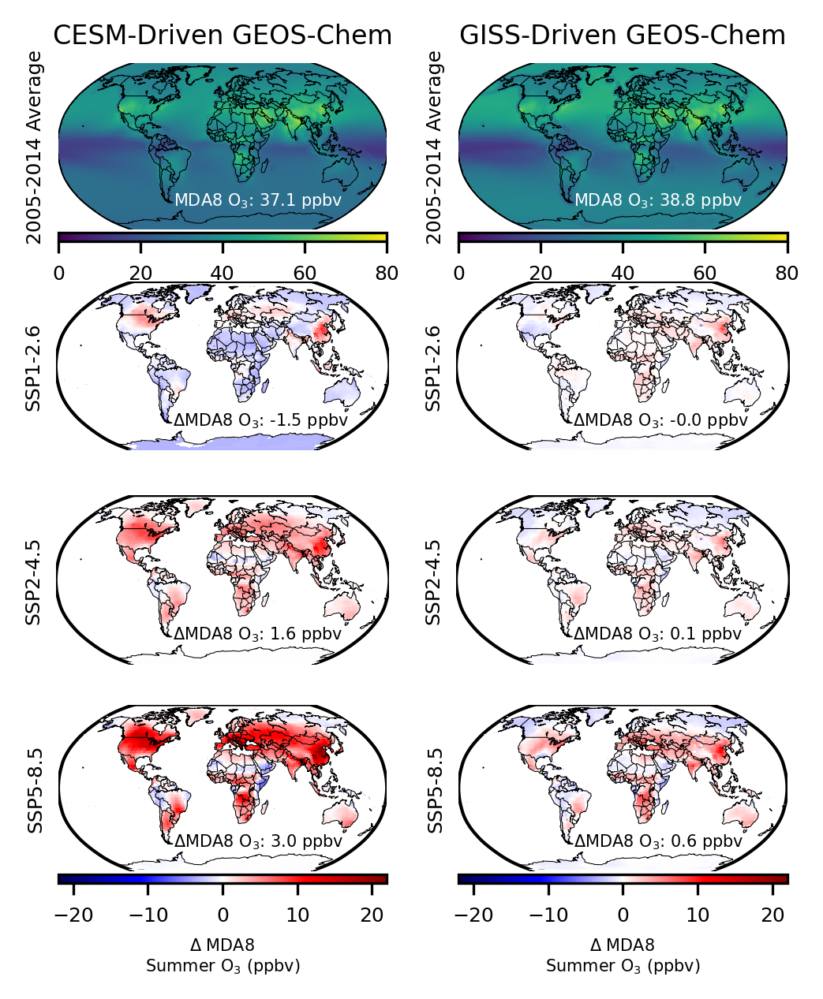

In [428]:
#Plot ozone data - CESM and GISS

path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
#xrds = xr.open_dataset(path_iec+'/GCAP2-CESM2/OSDMA8.base.nc')

#for attribute, value in xrds.attrs.items():
#    print(attribute, value)

#replace with GISS data when avaialble
# make a plot of O3 data (base in absolute and then delta for other 3 sims)
list_of_files = ['/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.base.nc', '/GCAP2-GISS_Raw Data/Ozone/OSDMA8.base.nc4',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.clim126.2090s.nc','/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim126.2090s.nc4',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.clim245.2090s.nc','/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim245.2090s.nc4',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.clim585.2090s.nc','/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim585.2090s.nc4']


data = Dataset(path_iec+list_of_files[0])
base_ozone_cesm = data.variables['MDA8'][0,0,:,:]
data = Dataset(path_iec+list_of_files[1])
base_ozone_giss = data.variables['corrected'][:,:]

numplts=8
fig = plt.figure(dpi=300,figsize=(4,4.5))

for iplt in np.arange(0,numplts):
    ax = fig.add_subplot(4,2,iplt+1)
    
    data = Dataset(path_iec+list_of_files[iplt])
    lat = data.variables['lat'][:]
    lon = data.variables['lon'][:]
    if ((iplt == 0) ):
        ozone = data.variables['MDA8'][0,0,:,:]
    elif (iplt ==1):
        ozone = data.variables['corrected'][:,:]
    elif ( iplt % 2 == 0):
        ozone = data.variables['MDA8'][0,0,:,:]
        ozone = ozone-base_ozone_cesm
    else:
        ozone = data.variables['corrected'][:,:]
        ozone = ozone-base_ozone_giss
    ozone=ozone.transpose()
    

    #print(ozone)
    m = Basemap(projection='robin',lon_0=0,resolution='c')
    m.drawmapboundary(fill_color='White')
    m.drawcoastlines(linewidth=0.25,zorder=3)
    #m.drawstates(linewidth=0.25,zorder=3)
    m.drawcountries(linewidth=0.25,zorder=3)
    xpi,ypi = m(xp,yp)

    if ((iplt == 0) or (iplt ==1)):
        plot = m.pcolor(xpi,ypi,ozone, vmin=0, vmax=80, snap=True,zorder=2)
    else:
        data = np.ma.array(ozone,mask =~landmask2d)
        plot = m.pcolor(xpi,ypi,data, vmin=-22, vmax=22, snap=True,zorder=2, cmap = 'seismic')
        
    if ((iplt ==0) or (iplt ==1)):
        cb = m.colorbar(plot, location = "bottom", pad = "2%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.set_xlabel('Absolute MDA8 \nSummer O$_3$ (ppbv)',fontsize=5)
    elif ((iplt ==6) or (iplt ==7)):
        cb = m.colorbar(plot, location = "bottom", pad = "2%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.set_xlabel('$\Delta$ MDA8 \nSummer O$_3$ (ppbv)',fontsize=5)
        
    if ((iplt == 0) or (iplt ==1)):
        plt.ylabel('2005-2014 Average',fontsize=6)
    elif iplt % 2 == 0:
        plt.ylabel('SSP'+list_of_files[iplt][45]+'-'+list_of_files[iplt][46]+'.'+list_of_files[iplt][47],fontsize=6)
    else:
        plt.ylabel('SSP'+list_of_files[iplt][38]+'-'+list_of_files[iplt][39]+'.'+list_of_files[iplt][40],fontsize=6)
        
    if ((iplt ==0)):
        ax.set_title('CESM-Driven GEOS-Chem',fontsize=8)
    elif iplt ==1:
        ax.set_title('GISS-Driven GEOS-Chem',fontsize=8)

    cb.ax.tick_params(labelsize=6)
    
    data = ozone
    #print(round(np.mean(np.mean(data)),1))
    data = np.ma.array(data,mask =~landmask2d)
    if ((iplt ==0) or (iplt==1)):
        strtext = 'MDA8 O$_3$: '+ str(round(np.nanmean(np.nanmean(data)),1))+ ' ppbv'
        ax.annotate(strtext, xy=(0.30, 0.15), xycoords='axes fraction', 
               xytext=(0.35, 0.15), textcoords='axes fraction', color='white',fontsize=5)
    else:
        strtext = '$\Delta$MDA8 O$_3$: '+ str(round(np.nanmean(np.mean(data)),1))+ ' ppbv'
        ax.annotate(strtext, xy=(0.3, 0.15), xycoords='axes fraction', 
               xytext=(0.35, 0.15), textcoords='axes fraction', color='black',fontsize=5)
    #print(strtext)
    
    
#ax = plt.axes(projection=ccrs.Robinson())
#ax.contourf(lon,lat,ozone,cmap = 'seismic')

#ax = plt.axes(projection=ccrs.Robinson())
#ax.coastlines()
#ax1.gridlines(draw_labels=True)
plt.savefig('plot_ozone_supplemental.png', bbox_inches='tight')
plt.show();
#print(ozone)
#print(lat)

# Table X - Land average Ozone Data

In [741]:
#calculate land-average MDA8 values - CESM and GISS
path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'

list_of_files = ['/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.base.nc', '/GCAP2-GISS_Raw Data/Ozone/OSDMA8.base.nc4',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.clim126.2090s.nc','/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim126.2090s.nc4',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.clim245.2090s.nc','/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim245.2090s.nc4',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.clim585.2090s.nc','/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim585.2090s.nc4',
                '/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim119.2090s.nc4','/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim434.2090s.nc4',
                '/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim460.2090s.nc4','/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim370.2090s.nc4']
data = Dataset(path_iec+list_of_files[1])
ozone = data.variables['corrected'][:,:]
base_giss = np.ma.array(ozone,mask =~landmaskt)
data = Dataset(path_iec+list_of_files[0])
ozone = data.variables['MDA8'][0,0,:,:]
base_cesm = np.ma.array(ozone,mask =~landmaskt)

for ifile in np.arange(0,len(list_of_files)):
    if 'GISS' in list_of_files[ifile]:
        data = Dataset(path_iec+list_of_files[ifile])
        ozone = data.variables['corrected'][:,:]
        print(np.shape(ozone))
    else:
        data = Dataset(path_iec+list_of_files[ifile])
        ozone = data.variables['MDA8'][0,0,:,:]
        print(np.shape(ozone))

    landmaskt = np.transpose(landmask2d)
    data = np.ma.array(ozone,mask =~landmaskt)
    #print(np.shape(landmask2d))
    #print(np.shape(landmaskt))

    print('MDA8 land average'+list_of_files[ifile]+': '+str(round(np.nanmean(np.mean(data)),1)))
    if 'GISS' in list_of_files[ifile]:
        print('Min, Mean, Max Change (ppbv): ', str(round(np.min(np.min(data-base_giss)),1)) 
              +', '+str(round(np.mean(np.mean(data-base_giss)),1))
              +', '+str(round(np.max(np.max(data-base_giss)),1)))
    else:
        print('Min, Mean, Max Change (ppbv): ', str(round(np.min(np.min(data-base_cesm)),1)) 
              +', '+str(round(np.mean(np.mean(data-base_cesm)),1))
              +', '+str(round(np.max(np.max(data-base_cesm)),1)))

(360, 720)
(720, 360)
(360, 720)
MDA8 land average/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.base.nc: 37.1
Min, Mean, Max Change (ppbv):  0.0, 0.0, 0.0
(360, 720)
(720, 360)
(360, 720)
MDA8 land average/GCAP2-GISS_Raw Data/Ozone/OSDMA8.base.nc4: 38.8
Min, Mean, Max Change (ppbv):  0.0, 0.0, 0.0
(360, 720)
(720, 360)
(360, 720)
MDA8 land average/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.clim126.2090s.nc: 35.6
Min, Mean, Max Change (ppbv):  -4.7, -1.5, 9.5
(360, 720)
(720, 360)
(360, 720)
MDA8 land average/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim126.2090s.nc4: 38.7
Min, Mean, Max Change (ppbv):  -5.4, -0.0, 8.2
(360, 720)
(720, 360)
(360, 720)
MDA8 land average/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.clim245.2090s.nc: 38.7
Min, Mean, Max Change (ppbv):  -4.0, 1.6, 12.0
(360, 720)
(720, 360)
(360, 720)
MDA8 land average/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim245.2090s.nc4: 38.9
Min, Mean, Max Change (ppbv):  -5.3, 0.1, 6.5
(360, 720)
(720, 360)
(360, 720)
MDA8 land average/GCAP2-CESM2_Raw Data/GCA

# Table X - population weighted PM2.5 averages

## first load population data

In [6]:
#This function coverts netCDF files into 1D arrays with lat, lon, values
# 1D arrays are necessary to merge the PM2.5 data with the population data arrays for population weighting

def netcdf_to_points(file_path, variable_name):
    """
    Converts a NetCDF file to a Pandas DataFrame with point data.

    Args:
        file_path (str): Path to the NetCDF file.
        variable_name (str): Name of the variable to extract.

    Returns:
        pandas.DataFrame: DataFrame containing latitude, longitude, and variable values.
    """
    with Dataset(file_path, 'r') as nc_file:
        latitudes = nc_file.variables['lat'][:]
        longitudes = nc_file.variables['lon'][:]
        variable_data = nc_file.variables[variable_name][:]

    if 'GWR_V4GL' in file_path:
        variable_data = np.transpose(variable_data)

    # Create coordinate arrays
    lons, lats = np.meshgrid(longitudes, latitudes)
    
    # Flatten the data and coordinates
    points = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        variable_name: variable_data.flatten()
    })
    return points

In [7]:
# This code first loads in the full grid and population array data
# this code needs to combine multiple datasets to create a full grid of global population data that can be used to population-weight PM2.5 results

path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data/GCAP2-CESM2_Raw Data'
path_iec2 = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
#xrds = xr.open_dataset(path_iec+'/GCAP2-CESM2/OSDMA8.base.nc')

#for attribute, value in xrds.attrs.items():
#    print(attribute, value)

#load in Dust and SSA data
data = Dataset(path_iec+'/GCAP2-CESM2/ACAG_PM25_noDUSTnoSEASALT_GWR_V4GL03_0p5_clim.nc')
present_total_PM = data.variables['PM25all'][:,:]
present_base_PM = data.variables['PM25'][:,:]
DSSC = present_total_PM-present_base_PM
print(np.shape(DSSC))
print(np.mean(DSSC))
DSSC = np.nan_to_num(DSSC,nan=0)
print(np.mean(DSSC))

#Make full population grid

# a. read in full grid
data = gpd.read_file(path_iec2+'/Grids/GMA_05x05.shp')
print(np.shape(data))
print(data.crs)
#data already in correct projections (4326 = WGS84)

#read in data where population > 0 
frag_data = gpd.read_file(path_iec2+'/Grids/Final_Fragments_Countries_AQS.shp')
print(np.shape(frag_data))
print(frag_data.crs)
frag_data_wgs84 = frag_data.to_crs({'init': 'epsg:4326'})
print(frag_data_wgs84.crs)
frag_data= frag_data_wgs84.loc[:,["ROW_1",'COL_1','ROW','COL','geometry','Alpha_3_co']]
frag_data.columns = ['ROW','COL','Row','Column','geometry','Alpha_3_co']
print(frag_data.columns)

#read in total population for these grids and merge with fragment grid
pop_data = pd.read_csv(path_iec2+'/RFF Fragment Total Population.csv')
pop_data = pop_data[pop_data.Year==2020.0]
print(pop_data.columns)
full_pop_join = pd.merge(frag_data, pop_data, how = 'left', on=['Row','Column'])
full_pop_join['ROW'] = full_pop_join['ROW'].astype(int)
full_pop_join['COL'] = full_pop_join['COL'].astype(int)
print(np.shape(full_pop_join))
print(full_pop_join.head())
print(full_pop_join.crs)
print(data.head())

#then join the population grid with the full 0.5x0.5 grid
data['ROW'] = data['ROW'].astype(int)
data['COL'] = data['COL'].astype(int)
full_grid_join = pd.merge(data,full_pop_join,how='left', on=['ROW','COL'])
full_grid_join['Year']= full_grid_join['Year'].fillna(2020)
#full_grid_join['total_pop']= full_grid_join['total_pop'].fillna(0)
print(np.shape(full_grid_join))
#print(full_pop_join.head())
print(full_grid_join.head())
print(full_grid_join.columns)
full_grid_join= full_grid_join.set_geometry("geometry_x")

#convert geometry to lat/lon
test = full_grid_join.geometry.bounds
centerx = (test.minx+test.maxx)/2
centery = (test.miny+test.maxy)/2
full_grid_join['Lon'] = centerx
full_grid_join['Lat'] = centery
full_grid_join['total_pop']= full_grid_join['total_pop'].fillna(0)
full_grid_join['World_Pop'] = np.sum(full_grid_join['total_pop'])

#full_grid_join.plot(column='total_pop',cmap='viridis')
#plt.show()

# read in base PM2.5 and Dust, and convert to points
allPM_df = netcdf_to_points(path_iec+'/GCAP2-CESM2/ACAG_PM25_noDUSTnoSEASALT_GWR_V4GL03_0p5_clim.nc', 'PM25all')
basePM_df = netcdf_to_points(path_iec+'/GCAP2-CESM2/ACAG_PM25_noDUSTnoSEASALT_GWR_V4GL03_0p5_clim.nc', 'PM25')
basePM_df['DST_SSA'] = allPM_df.loc[:,'PM25all']- basePM_df.loc[:,'PM25']
basePM_df['PM25all'] = allPM_df.loc[:,'PM25all']

#print(full_grid_join)
full_data_join = pd.merge(full_grid_join,basePM_df,how='left', on=['Lat','Lon'])
full_data_join['PW_PM25'] = np.sum((full_data_join.loc[:,'total_pop']*full_data_join.loc[:,'PM25all']))/full_data_join.loc[:,'World_Pop']
#print(full_data_join)
print(np.mean(full_data_join['PW_PM25'])) #just to double check Satellite-derived Population-weighting

#basePM_df.plot(column='PM25',cmap='viridis')
#plt.show()

(720, 360)
5.920739170817317
5.920739170817317
(259200, 4)
EPSG:4326
(65156, 37)
EPSG:3857


C:\Users\EMCDUF01\AppData\Local\anaconda3\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


+init=epsg:4326 +type=crs
Index(['ROW', 'COL', 'Row', 'Column', 'geometry', 'Alpha_3_co'], dtype='object')
Index(['Unnamed: 0', 'Column', 'Row', 'Year', 'total_pop'], dtype='object')
(65156, 9)
   ROW  COL     Row  Column  \
0  257  501  501257       4   
1  257  502  502257       4   
2  257  503  503257       4   
3  256  492  492256       4   
4  256  499  499256       4   

                                            geometry Alpha_3_co  Unnamed: 0  \
0  POLYGON ((70.50000 38.00000, 70.30853 38.00000...        AFG      2949.0   
1  POLYGON ((71.00000 38.46050, 71.00000 38.00000...        AFG      3059.0   
2  POLYGON ((71.27455 38.00000, 71.00000 38.00000...        AFG      3158.0   
3  POLYGON ((65.87964 37.50000, 65.66995 37.50000...        AFG      1684.0   
4  POLYGON ((69.50000 37.50000, 69.43228 37.50000...        AFG      2707.0   

     Year     total_pop  
0  2020.0   4309.854968  
1  2020.0  87686.602252  
2  2020.0  35587.885392  
3  2020.0    981.771003  
4  2020.0   25

## calculate population-weighted averages

In [8]:
path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'

#replace with GISS data when avaialble
# make a plot of PM2.5 data (base in absolute and then delta for other 3 sims)
list_of_files = ['/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.base.nc', '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.base.nc',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim126.2090s.nc','/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim126.2090s.nc',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim245.2090s.nc','/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim245.2090s.nc',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim585.2090s.nc','/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim585.2090s.nc',
                '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim119.2090s.nc','/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim434.2090s.nc',
                '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim460.2090s.nc','/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim370.2090s.nc']
data = Dataset(path_iec+list_of_files[0])
base_PM_cesm = data.variables['PM25'][0,0,:,:]
#print(np.shape(base_PM_cesm))
data = Dataset(path_iec+list_of_files[1])
base_PM_giss = data.variables['PM25'][0,0,:,:]
#print(np.shape(base_PM_giss))
#print(np.shape(landmask2d))
#print(np.mean(base_PM_cesm))
#print(np.mean(base_PM_giss))

for ifile in np.arange(0,len(list_of_files)):
    data_df = netcdf_to_points(path_iec+list_of_files[ifile],'PM25')
    data_df['PM25'] = data_df.loc[:,'PM25']+basePM_df.loc[:,'DST_SSA']
    full_data_join = pd.merge(full_grid_join,data_df,how='left', on=['Lat','Lon'])
    full_data_join['PW_PM25'] = np.sum((full_data_join.loc[:,'total_pop']*full_data_join.loc[:,'PM25']))/full_data_join.loc[:,'World_Pop']

    print('Population-weighted annual average'+list_of_files[ifile]+': '+str(round(np.nanmean(np.mean(full_data_join['PW_PM25'])),1)))

Population-weighted annual average/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.base.nc: 33.3
Population-weighted annual average/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.base.nc: 33.3
Population-weighted annual average/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim126.2090s.nc: 31.6
Population-weighted annual average/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim126.2090s.nc: 31.9
Population-weighted annual average/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim245.2090s.nc: 31.6
Population-weighted annual average/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim245.2090s.nc: 31.9
Population-weighted annual average/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim585.2090s.nc: 31.4
Population-weighted annual average/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim585.2090s.nc: 31.6
Population-weighted annual average/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim119.2090s.nc: 32.0
Population-weighted annual average/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim434.2090s.nc: 32.4
Populati

# Figure S3 - PM2.5 map comparison

(360, 720)
(720, 360)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\1018719365.py:52: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,PM, vmin=0, vmax=100, snap=True,zorder=2)
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\1018719365.py:52: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,PM, vmin=0, vmax=100, snap=True,zorder=2)


(360, 720)
(720, 360)
(360, 720)
(720, 360)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\1018719365.py:58: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')


(720, 360)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\1018719365.py:58: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')


(360, 720)
(720, 360)
(360, 720)
(720, 360)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\1018719365.py:58: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')


(720, 360)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\1018719365.py:58: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')


(360, 720)
(720, 360)
(360, 720)
(720, 360)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\1018719365.py:58: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\1018719365.py:67: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "1%",size='5%')


(720, 360)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\1018719365.py:58: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_23856\1018719365.py:67: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "1%",size='5%')


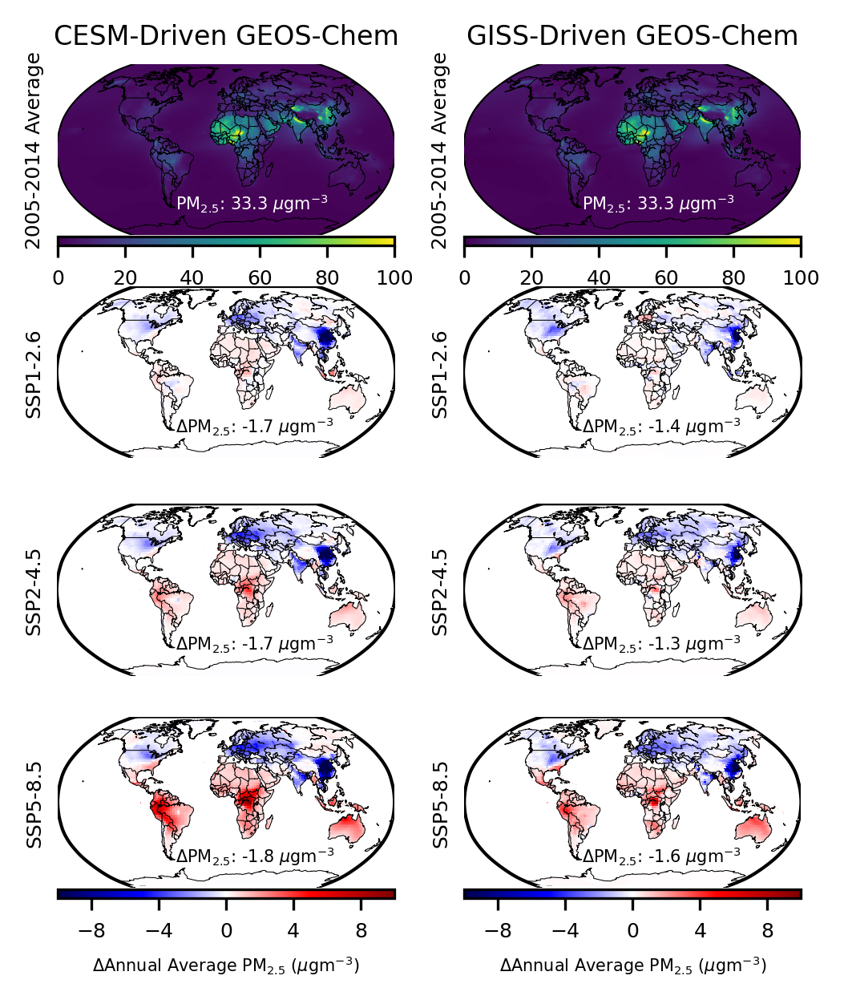

In [443]:
path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'

#replace with GISS data when avaialble
# make a plot of PM2.5 data (base in absolute and then delta for other 3 sims)
list_of_files = ['/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.base.nc', '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.base.nc',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim126.2090s.nc','/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim126.2090s.nc',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim245.2090s.nc','/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim245.2090s.nc',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim585.2090s.nc','/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim585.2090s.nc']

data = Dataset(path_iec+list_of_files[0])
base_PM_cesm = data.variables['PM25'][0,0,:,:]
data = Dataset(path_iec+list_of_files[1])
base_PM_giss = data.variables['PM25'][0,0,:,:]
#base_PM = base_PM+DSSC
DSSC_filled = DSSC.filled(0) #convert the masked array to a numerical array

numplts=8
fig = plt.figure(dpi=300,figsize=(4,4.5))

for iplt in np.arange(0,numplts):
    ax = fig.add_subplot(4,2,iplt+1)
    
    data = Dataset(path_iec+list_of_files[iplt])
    lat = data.variables['lat'][:]
    lon = data.variables['lon'][:]
    PM = data.variables['PM25'][0,0,:,:]
    if ((iplt == 0)):
        PM=base_PM_cesm+np.transpose(DSSC_filled)
        #print(np.shape(base_PM_cesm))
        #print(np.shape(DSSC_filled))
    elif (iplt ==1):
        PM=base_PM_giss+np.transpose(DSSC_filled)
    elif iplt % 2 == 0:
        PM = (PM+np.transpose(DSSC_filled))-(base_PM_cesm+np.transpose(DSSC_filled))
        #print(np.shape(base_PM_cesm))
        #print(np.shape(DSSC_filled))
        #print(np.shape(PM))
    else:
        PM = (PM+np.transpose(DSSC_filled))-(base_PM_giss+np.transpose(DSSC_filled))
    PM=PM.transpose()
    

    #print(ozone)
    m = Basemap(projection='robin',lon_0=0,resolution='c')
    m.drawmapboundary(fill_color='White')
    m.drawcoastlines(linewidth=0.25,zorder=3)
    #m.drawstates(linewidth=0.25,zorder=3)
    m.drawcountries(linewidth=0.25,zorder=3)
    xpi,ypi = m(xp,yp)

    if ((iplt == 0) or (iplt ==1)):
        plot = m.pcolor(xpi,ypi,PM, vmin=0, vmax=100, snap=True,zorder=2)
    else:
        #print(np.shape(landmask2d))
        #landmaskt = np.transpose(landmask2d)
        data = np.ma.array(PM,mask =~landmask2d)
        #print(np.shape(data))
        plot = m.pcolor(xpi,ypi,data, vmin=-12, vmax=12, snap=True,zorder=2, cmap = 'seismic')
        
    if ((iplt ==0) or (iplt ==1)):
        cb = m.colorbar(plot, location = "bottom", pad = "1%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.set_xlabel('Annual Average PM$_{2.5}$ ($\\mu$gm$^{-3}$)',fontsize=5)
    elif ((iplt ==6) or (iplt ==7)):
        cb = m.colorbar(plot, location = "bottom", pad = "1%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.set_xlabel('$\Delta$Annual Average PM$_{2.5}$ ($\\mu$gm$^{-3}$)',fontsize=5)
        
    if ((iplt == 0) or (iplt ==1)):
        plt.ylabel('2005-2014 Average',fontsize=6)
    elif iplt % 2 == 0:
        plt.ylabel('SSP'+list_of_files[iplt][54]+'-'+list_of_files[iplt][55]+'.'+list_of_files[iplt][56],fontsize=6)
    else:
        plt.ylabel('SSP'+list_of_files[iplt][44]+'-'+list_of_files[iplt][45]+'.'+list_of_files[iplt][46],fontsize=6)

    if ((iplt ==0)):
        ax.set_title('CESM-Driven GEOS-Chem',fontsize=8)
    elif iplt ==1:
        ax.set_title('GISS-Driven GEOS-Chem',fontsize=8)

    cb.ax.tick_params(labelsize=6)
    
    data = PM
    #print(round(np.mean(np.mean(data)),1))
    if ((iplt ==0) or (iplt==1)):
        #data = PM
        data_df = netcdf_to_points(path_iec+list_of_files[iplt],'PM25')
        data_df['PM25'] = data_df.loc[:,'PM25']+basePM_df.loc[:,'DST_SSA']
        full_data_join = pd.merge(full_grid_join,data_df,how='left', on=['Lat','Lon'])
        full_data_join['PW_PM25'] = np.sum((full_data_join.loc[:,'total_pop']*full_data_join.loc[:,'PM25']))/full_data_join.loc[:,'World_Pop']
        strtext = 'PM$_{2.5}$: '+ str(round(np.nanmean(np.nanmean(full_data_join['PW_PM25'])),1))+ ' $\\mu$gm$^{-3}$'
        ax.annotate(strtext, xy=(0.30, 0.15), xycoords='axes fraction', 
               xytext=(0.35, 0.15), textcoords='axes fraction', color='white',fontsize=5)
    elif iplt % 2 == 0:
        data_df = netcdf_to_points(path_iec+list_of_files[iplt],'PM25')
        base_df = netcdf_to_points(path_iec+list_of_files[0],'PM25')
        data_df['Delta_PM25'] = data_df.loc[:,'PM25']- base_df.loc[:,'PM25']
        #print(delta_df)
        full_data_join = pd.merge(full_grid_join,data_df,how='left', on=['Lat','Lon'])
        full_data_join['PW_PM25'] = np.sum((full_data_join.loc[:,'total_pop']*full_data_join.loc[:,'Delta_PM25']))/full_data_join.loc[:,'World_Pop']
        #data = np.ma.array(PM,mask =~landmask2d)
        strtext = '$\Delta$PM$_{2.5}$: '+ str(round(np.nanmean(np.mean(full_data_join['PW_PM25'])),1))+ ' $\\mu$gm$^{-3}$'
        ax.annotate(strtext, xy=(0.3, 0.15), xycoords='axes fraction', 
               xytext=(0.35, 0.15), textcoords='axes fraction', color='black',fontsize=5)
    else:
        data_df = netcdf_to_points(path_iec+list_of_files[iplt],'PM25')
        base_df = netcdf_to_points(path_iec+list_of_files[1],'PM25')
        data_df['Delta_PM25'] = data_df.loc[:,'PM25']- base_df.loc[:,'PM25']
        #print(delta_df)
        full_data_join = pd.merge(full_grid_join,data_df,how='left', on=['Lat','Lon'])
        full_data_join['PW_PM25'] = np.sum((full_data_join.loc[:,'total_pop']*full_data_join.loc[:,'Delta_PM25']))/full_data_join.loc[:,'World_Pop']
        #data = np.ma.array(PM,mask =~landmask2d)
        strtext = '$\Delta$PM$_{2.5}$: '+ str(round(np.nanmean(np.mean(full_data_join['PW_PM25'])),1))+ ' $\\mu$gm$^{-3}$'
        ax.annotate(strtext, xy=(0.3, 0.15), xycoords='axes fraction', 
               xytext=(0.35, 0.15), textcoords='axes fraction', color='black',fontsize=5)
    #print(strtext)
    
    
#ax = plt.axes(projection=ccrs.Robinson())
#ax.contourf(lon,lat,ozone,cmap = 'seismic')

#ax = plt.axes(projection=ccrs.Robinson())
#ax.coastlines()
#ax1.gridlines(draw_labels=True)
plt.savefig('plot_PM25_supplemental.png', bbox_inches='tight')
plt.show();

#print(ozone)
#print(lat)

# Figure 2 - PM2.5 and Ozone Comparison Maps (with global means)

C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_2756\1890516546.py:59: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-22, vmax=22, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_2756\1890516546.py:74: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_2756\1890516546.py:59: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated c

NameError: name 'full_data_join' is not defined

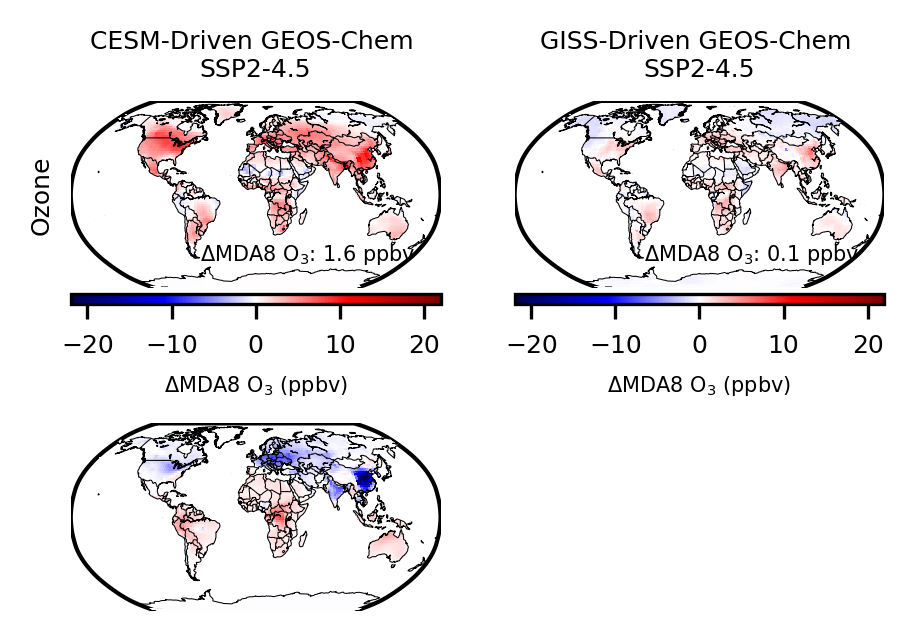

In [6]:
# make main text plot
# 4 panels with SSP245 results (Delta's)
#a) CESM-ozone
#b) GISS ozone
#c) CESM PM
#d) GISS PM

path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
list_of_files = ['/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.base.nc', '/GCAP2-GISS_Raw Data/Ozone/OSDMA8.base.nc4',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.base.nc', '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.base.nc',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.clim245.2090s.nc','/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim245.2090s.nc4',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim245.2090s.nc','/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim245.2090s.nc']

data = Dataset(path_iec+list_of_files[0])
base_ozone_cesm = data.variables['MDA8'][0,0,:,:]
data = Dataset(path_iec+list_of_files[1])
base_ozone_giss = data.variables['corrected'][:,:]
data = Dataset(path_iec+list_of_files[2])
base_PM_cesm = data.variables['PM25'][0,0,:,:]
data = Dataset(path_iec+list_of_files[3])
base_PM_giss = data.variables['PM25'][0,0,:,:]

numplts=4
fig = plt.figure(dpi=300,figsize=(3.5,2.5))

for iplt in np.arange(0,numplts):
    ax = fig.add_subplot(2,2,iplt+1)
    ifile = iplt+4
    data = Dataset(path_iec+list_of_files[ifile])
    lat = data.variables['lat'][:]
    lon = data.variables['lon'][:]
    if ((iplt == 0)):
        delta_data = data.variables['MDA8'][0,0,:,:] - base_ozone_cesm
    elif iplt ==1:
        delta_data = data.variables['corrected'][:,:] - base_ozone_giss
    elif (iplt == 2):
        delta_data = data.variables['PM25'][0,0,:,:] - base_PM_cesm
    elif (iplt ==3):
        delta_data = data.variables['PM25'][0,0,:,:] - base_PM_giss
    #print(np.shape(delta_data))
    
    #print(ozone)
    m = Basemap(projection='robin',lon_0=0,resolution='c')
    m.drawmapboundary(fill_color='White')
    m.drawcoastlines(linewidth=0.25,zorder=3)
    m.drawcountries(linewidth=0.25,zorder=3)
    xpi,ypi = m(xp,yp)

    #if ((iplt == 0) or (iplt ==1)):
    #    plot = m.pcolor(xpi,ypi,PM, vmin=0, vmax=100, snap=True,zorder=2)
    #else:
        #print(np.shape(landmask2d))
    landmaskt = np.transpose(landmask2d)
    #print(np.shape(landmaskt))
    data = np.ma.array(delta_data,mask =~landmaskt)
    #print(np.shape(data))
    #print(np.shape(data))
    if ((iplt == 0) or (iplt ==1)):
        plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-22, vmax=22, snap=True,zorder=2, cmap = 'seismic')
        strtext = '$\Delta$MDA8 O$_3$: '+ str(round(np.nanmean(np.mean(data)),1))+ ' ppbv'
        ax.annotate(strtext, xy=(0.3, 0.15), xycoords='axes fraction', 
               xytext=(0.35, 0.15), textcoords='axes fraction', color='black',fontsize=5)
    else:
        plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-12, vmax=12, snap=True,zorder=2, cmap = 'seismic')
        strtext = '$\Delta$PM$_{2.5}$: '+ str(round(np.nanmean(np.mean(full_data_join['PW_PM25'])),1))+ ' $\\mu$gm$^{-3}$'
        ax.annotate(strtext, xy=(0.3, 0.15), xycoords='axes fraction', 
               xytext=(0.35, 0.15), textcoords='axes fraction', color='black',fontsize=5)

    if ((iplt ==0)):
        ax.set_title('CESM-Driven GEOS-Chem \nSSP2-4.5',fontsize=6)
    elif iplt ==1:
        ax.set_title('GISS-Driven GEOS-Chem \nSSP2-4.5',fontsize=6)
        
    cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
    tick_locator = ticker.MaxNLocator(nbins=5)
    cb.locator = tick_locator
    cb.update_ticks()
    if  ((iplt ==0) or (iplt ==1)):
        cb.ax.set_xlabel('$\Delta$MDA8 O$_{3}$ (ppbv)',fontsize=5)
    elif ((iplt ==2) or (iplt ==3)):
        cb.ax.set_xlabel('$\Delta$Annual Average PM$_{2.5}$ ($\\mu$gm$^{-3}$)',fontsize=5)
        
    if iplt ==0:
        plt.ylabel('Ozone',fontsize=6)
    elif iplt ==2:
        plt.ylabel('PM$_{2.5}$',fontsize=6)
    cb.ax.tick_params(labelsize=6)

plt.savefig('Figure2_delta_concentrations.png', bbox_inches='tight')
plt.show();

# Table 2 - Emission and temperature results

In [9]:
### GISS - total annual emissions and temperatures
path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
list_of_files = ['/GCAP2-GISS_Raw Data/HEMCO.E21.base.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim119.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim126.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim245.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim370.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim460.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim434.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim585.2090s.ymonmean_1.nc4',
                '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.base.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim119.2090s.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim126.2090s.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim245.2090s.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim370.2090s.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim460.2090s.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim434.2090s.ymonmean.nc4',
                '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim585.2090s.ymonmean.nc4',]
MW_NOx = (30.01+46.01)/2
s_per_year = 31536000/12
kg_to_tg = 1e-9
data = Dataset(path_iec+list_of_files[0])
print(data)

AREA = np.ma.getdata(np.transpose(data.variables['AREA'])) #m2
emis_voc= np.zeros((144,90))

data = Dataset(path_iec+list_of_files[8])
temperature_base = np.ma.getdata(np.transpose(np.mean(data.variables['Met_TS'][:,:,:],axis=0)))
area_land = np.ma.array(AREA,mask =~landmask2x25)
temp_base_land = np.ma.array(temperature_base,mask =~landmask2x25)
#temp_base_land
temperature_base_weight = np.sum(temperature_base*AREA)/np.sum(AREA)
precip_base = np.ma.getdata(np.transpose(np.mean(data.variables['Met_PRECTOT'][:,:,:],axis=0)))
precip_base_land = np.ma.array(precip_base,mask =~landmask2x25)


for ifile in np.arange(0,len(list_of_files)-8):
    data = Dataset(path_iec+list_of_files[ifile])
    print('Here: '+list_of_files[ifile])
    #anthropogenic emissions
    # SO2
    so2 = np.ma.getdata(np.transpose(np.sum(data.variables['EmisSO2_Anthro'][:,:,:],axis=0)))
    so2 *= AREA*s_per_year*kg_to_tg#*(32.07/64.07) #convert to Tg S/yr
    # NH3
    nh3 = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNH3_Anthro'][:,:,:],axis=0)))
    nh3 *= AREA*s_per_year*kg_to_tg #convert to Tg NH3/yr
    # NOx
    nox = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO_Anthro'][:,:,:],axis=0)))
    #nox += np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO2_Anthro'][:,:,:],axis=0)))
    nox *= AREA*s_per_year*kg_to_tg#*14/MW_NOx #convert to Tg N/yr
    # NMVOC + CO
    co = np.ma.getdata(np.transpose(np.sum(data.variables['EmisCO_Anthro'][:,:,:],axis=0)))
    co *= AREA*s_per_year*kg_to_tg#*12/28.01 #convert to Tg C/yr 
    voc_list = ['EmisXYLE_Anthro','EmisTOLU_Anthro','EmisPRPE_Anthro','EmisMEK_Anthro','EmisHCOOH_Anthro','EmisEOH_Anthro','EmisCH2O_Anthro',
               'EmisC3H8_Anthro','EmisC2H6_Anthro','EmisBENZ_Anthro','EmisALK4_Anthro','EmisALD2_Anthro','EmisMACR_Total',
                'EmisRCHO_Total'] #'EmisMOH_Anthro', 'EmisC2H4_Anthro','EmisC2H2_Anthro',
    voc = np.zeros((144,90))
    for ivoc in voc_list:
        temp = np.ma.getdata(np.transpose(np.sum(data.variables[ivoc][:,:,:],axis=0)))
        if 'ALD2' in ivoc:
            cfactor = (1*12)/44.06
        elif 'ALK4' in ivoc:
            cfactor = (4.5*12)/58.12
        elif 'BENZ' in ivoc:
            cfactor = (6*12)/78.12
        elif 'C2H2' in ivoc:
            cfactor = (1*12)/26.05
        elif 'C2H4' in ivoc:
            cfactor = (2*12)/28.05
        elif 'C2H6' in ivoc:
            cfactor = (2*12)/30.08
        elif 'C3H8' in ivoc:
            cfactor = (3*12)/44.11
        elif 'CH2O' in ivoc:
            cfactor = (1*12)/30.03
        elif 'EOH' in ivoc:
            cfactor = (2*12)/46.07
        elif 'HCOOH' in ivoc:
            cfactor = (1*12)/46.03
        elif 'MEK' in ivoc:
            cfactor = (4*12)/72.11
        elif 'MOH' in ivoc:
            cfactor = (1*12)/32.05
        elif 'PRPE' in ivoc:
            cfactor = (3*12)/42.09
        elif 'TOLU' in ivoc:
            cfactor = (7*12)/92.15
        elif 'XYLE' in ivoc:
            cfactor = (8*12)/106.18
        elif 'RCHO' in ivoc:
            cfactor = (3*12)/58.09
        elif 'MACR' in ivoc:
            cfactor = (4*12)/70.10
        voc += temp*AREA*s_per_year*kg_to_tg*cfactor#*12/28.01 #convert to Tg C/yr
    # OC + BC (direct emissions)
    oc = np.ma.getdata(np.transpose(np.sum(data.variables['EmisOCPI_Anthro'][:,:,:],axis=0)))
    oc += np.ma.getdata(np.transpose(np.sum(data.variables['EmisOCPO_Anthro'][:,:,:],axis=0)))
    oc *= AREA*s_per_year*kg_to_tg #convert to Tg /yr
    bc = np.ma.getdata(np.transpose(np.sum(data.variables['EmisBCPI_Anthro'][:,:,:],axis=0)))
    bc += np.ma.getdata(np.transpose(np.sum(data.variables['EmisBCPO_Anthro'][:,:,:],axis=0)))
    bc *= AREA*s_per_year*kg_to_tg #convert to Tg /yr
    total_c = np.sum(bc)+np.sum(oc)

    print('SO2 - '+list_of_files[ifile]+': '+str(np.sum(so2)))
    print('NH3 - '+list_of_files[ifile]+': '+str(np.sum(nh3)))
    print('NOx - '+list_of_files[ifile]+': '+str(np.sum(nox)))
    print('CO - '+list_of_files[ifile]+': '+str(np.sum(co)))
    print('BC + OC - '+list_of_files[ifile]+': '+str(np.sum(total_c)))
    print('NMVOC - '+list_of_files[ifile]+': '+str(np.sum(voc)))

    #temperature (area weight)
    data = Dataset(path_iec+list_of_files[ifile+8])
    print(list_of_files[ifile+8])
    temperature = np.ma.getdata(np.transpose(np.mean(data.variables['Met_TS'][:,:,:],axis=0)))
    print(np.shape(temperature), np.shape(AREA))
    print(np.mean(temperature))
    #temperature = np.sum(temperature*AREA)/np.sum(AREA)
    temp_diff = temperature - temperature_base
    temp_diff = np.sum(temp_diff*AREA)/np.sum(AREA)
    temp_land = np.ma.array(temperature,mask =~landmask2x25)
    temp_diff_land = temp_land - temp_base_land
    temp_diff_land = np.sum(temp_diff_land*area_land)/np.sum(area_land)
    print('Temperature (K) - '+list_of_files[ifile+8]+': '+str((temp_diff))+', land-only: '+str(temp_diff_land))

    #Total precip - area weight
    data = Dataset(path_iec+list_of_files[ifile+8])
    print(list_of_files[ifile+8])
    precip = np.ma.getdata(np.transpose(np.mean(data.variables['Met_PRECTOT'][:,:,:],axis=0)))
    #print(np.shape(precip), np.shape(AREA))
    #print(np.mean(precip))
    precip_diff = 100*(precip - precip_base)/precip_base
    precip_diff = np.sum(precip_diff*AREA)/np.sum(AREA)
    precip_land = np.ma.array(precip,mask =~landmask2x25)
    precip_diff_land = 100*(precip_land - precip_base_land)/precip_base_land
    precip_diff_land = np.sum(precip_diff_land*area_land)/np.sum(area_land)
    print('Precip (percent change) - '+list_of_files[ifile+8]+': '+str((precip_diff))+', land-only: '+str(precip_diff_land))

<class 'netCDF4.Dataset'>
root group (NETCDF4_CLASSIC data model, file format HDF5):
    CDI: Climate Data Interface version 2.5.0 (https://mpimet.mpg.de/cdi)
    Conventions: CF-1.6
    title: OutputDir/HEMCO sa diagnostics
    format: NetCDF-4
    conventions: COARDS
    reference: http://wiki.geos-chem.org/The_HEMCO_Users_Guide
    contact: GEOS-Chem Support Team (geos-chem-support@as.harvard.edu)
    CDO: Climate Data Operators version 2.5.0 (https://mpimet.mpg.de/cdo)
    NCO: netCDF Operators version 5.3.2 (Homepage = http://nco.sf.net, Code = http://github.com/nco/nco, Citation = 10.1016/j.envsoft.2008.03.004)
    history: Mon Feb 24 12:13:16 2025: ncks -A -v EmisO3_Ship,EmisNO2_Ship,EmisHNO3_Ship giss.base.emis.nc giss2.base.emis.nc
Mon Feb 24 12:13:14 2025: ncap2 -O -s EmisNO_Total= (EmisNO_Ship+EmisNO_Lightning+EmisNO_BioBurn+EmisNO_Anthro+EmisNO_Aircraft+EmisNO_Soil); giss2.base.emis.nc giss2.base.emis.nc
Mon Feb 24 12:12:39 2025: cdo -O -L ymonmean -vertsum -mergetime /Volu

In [315]:
# CESM emissions and temperature
path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
list_of_files = ['/GCAP2-CESM2_Raw Data/HEMCO.CESM2.base.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim126.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim245.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim585.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.base.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim126.2090s.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim245.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim585.2090s.ymonmean.nc4',]
MW_NOx = (30.01+46.01)/2
s_per_year = 31536000/12
kg_to_tg = 1e-9
data = Dataset(path_iec+list_of_files[1])
print(data)

AREA = np.ma.getdata(np.transpose(data.variables['AREA'])) #m2
emis_voc= np.zeros((144,90))
data = Dataset(path_iec+list_of_files[4])
temperature_base = np.ma.getdata(np.transpose(np.mean(data.variables['Met_TS'][:,:,:],axis=0)))
area_land = np.ma.array(AREA,mask =~landmask2x25)
temp_base_land = np.ma.array(temperature_base,mask =~landmask2x25)
#temp_base_land
#temperature_base_weight = np.sum(temperature_base*AREA)/np.sum(AREA)
precip_base = np.ma.getdata(np.transpose(np.mean(data.variables['Met_PRECTOT'][:,:,:],axis=0)))
precip_base_land = np.ma.array(precip_base,mask =~landmask2x25)

for ifile in np.arange(0,len(list_of_files)-4):
    data = Dataset(path_iec+list_of_files[ifile])
    #anthropogenic emissions
    # SO2
    so2 = np.ma.getdata(np.transpose(np.sum(data.variables['EmisSO2_Anthro'][:,:,:],axis=0)))
    print(np.shape(so2))
    so2 *= AREA*s_per_year*kg_to_tg#*(32.07/64.07) #convert to Tg S/yr
    # NH3
    nh3 = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNH3_Anthro'][:,:,:],axis=0)))
    nh3 *= AREA*s_per_year*kg_to_tg #convert to Tg NH3/yr
    # NOx
    nox = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO_Anthro'][:,:,:],axis=0)))
    nox += np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO2_Total'][:,:,:],axis=0)))
    nox *= AREA*s_per_year*kg_to_tg#*14/MW_NOx #convert to Tg N/yr
    # NMVOC + CO
    co = np.ma.getdata(np.transpose(np.sum(data.variables['EmisCO_Anthro'][:,:,:],axis=0)))
    co *= AREA*s_per_year*kg_to_tg#*12/28.01 #convert to Tg C/yr 

    voc_list = ['EmisXYLE_Anthro','EmisTOLU_Anthro','EmisPRPE_Anthro','EmisMOH_Anthro','EmisMEK_Anthro','EmisHCOOH_Anthro','EmisEOH_Anthro','EmisCH2O_Anthro',
               'EmisC3H8_Anthro','EmisC2H6_Anthro','EmisC2H4_Anthro','EmisC2H2_Anthro','EmisBENZ_Anthro','EmisALK4_Anthro','EmisALD2_Anthro','EmisRCHO_Total',
               'EmisMACR_Total']
    voc = np.zeros((144,90))
    for ivoc in voc_list:
        temp = np.ma.getdata(np.transpose(np.sum(data.variables[ivoc][:,:,:],axis=0)))
        if 'ALD2' in ivoc:
            cfactor = (1*12)/44.06
        elif 'ALK4' in ivoc:
            cfactor = (4.5*12)/58.12
        elif 'BENZ' in ivoc:
            cfactor = (6*12)/78.12
        elif 'C2H2' in ivoc:
            cfactor = (1*12)/26.05
        elif 'C2H4' in ivoc:
            cfactor = (2*12)/28.05
        elif 'C2H6' in ivoc:
            cfactor = (2*12)/30.08
        elif 'C3H8' in ivoc:
            cfactor = (3*12)/44.11
        elif 'CH2O' in ivoc:
            cfactor = (1*12)/30.03
        elif 'EOH' in ivoc:
            cfactor = (2*12)/46.07
        elif 'HCOOH' in ivoc:
            cfactor = (1*12)/46.03
        elif 'MEK' in ivoc:
            cfactor = (4*12)/72.11
        elif 'MOH' in ivoc:
            cfactor = (1*12)/32.05
        elif 'PRPE' in ivoc:
            cfactor = (3*12)/42.09
        elif 'TOLU' in ivoc:
            cfactor = (7*12)/92.15
        elif 'XYLE' in ivoc:
            cfactor = (8*12)/106.18
        elif 'RCHO' in ivoc:
            cfactor = (3*12)/58.09
        elif 'MACR' in ivoc:
            cfactor = (4*12)/70.10
        voc += temp*AREA*s_per_year*kg_to_tg*cfactor#*12/28.01 #convert to Tg C/yr
    # OC + BC (direct emissions)
    oc = np.ma.getdata(np.transpose(np.sum(data.variables['EmisOCPI_Anthro'][:,:,:],axis=0)))
    oc += np.ma.getdata(np.transpose(np.sum(data.variables['EmisOCPO_Anthro'][:,:,:],axis=0)))
    oc *= AREA*s_per_year*kg_to_tg #convert to Tg /yr
    bc = np.ma.getdata(np.transpose(np.sum(data.variables['EmisBCPI_Anthro'][:,:,:],axis=0)))
    bc += np.ma.getdata(np.transpose(np.sum(data.variables['EmisBCPO_Anthro'][:,:,:],axis=0)))
    bc *= AREA*s_per_year*kg_to_tg #convert to Tg /yr
    total_c = np.sum(bc)+np.sum(oc)

    print('SO2 - '+list_of_files[ifile]+': '+str(np.sum(so2)))
    print('NH3 - '+list_of_files[ifile]+': '+str(np.sum(nh3)))
    print('NOx - '+list_of_files[ifile]+': '+str(np.sum(nox)))
    print('CO - '+list_of_files[ifile]+': '+str(np.sum(co)))
    print('BC + OC - '+list_of_files[ifile]+': '+str(np.sum(total_c)))
    print('NMVOC - '+list_of_files[ifile]+': '+str(np.sum(voc)))

    #temperature - area weight
    data = Dataset(path_iec+list_of_files[ifile+4])
    print(list_of_files[ifile+4])
    temperature = np.ma.getdata(np.transpose(np.mean(data.variables['Met_TS'][:,:,:],axis=0)))
    print(np.shape(temperature), np.shape(AREA))
    print(np.mean(temperature))
    #temperature = np.sum(temperature*AREA)/np.sum(AREA)
    temp_diff = temperature - temperature_base
    temp_diff = np.sum(temp_diff*AREA)/np.sum(AREA)
    temp_land = np.ma.array(temperature,mask =~landmask2x25)
    temp_diff_land = temp_land - temp_base_land
    temp_diff_land = np.sum(temp_diff_land*area_land)/np.sum(area_land)
    print('Temperature (K) - '+list_of_files[ifile+4]+': '+str((temp_diff))+', land-only: '+str(temp_diff_land))

    #Total precip - area weight
    data = Dataset(path_iec+list_of_files[ifile+4])
    print(list_of_files[ifile+4])
    precip = np.ma.getdata(np.transpose(np.mean(data.variables['Met_PRECTOT'][:,:,:],axis=0)))
    #print(np.shape(precip), np.shape(AREA))
    #print(np.mean(precip))
    precip_diff = 100*(precip - precip_base)/precip_base
    precip_diff = np.sum(precip_diff*AREA)/np.sum(AREA)
    precip_land = np.ma.array(precip,mask =~landmask2x25)
    precip_diff_land = 100*(precip_land - precip_base_land)/precip_base_land
    precip_diff_land = np.sum(precip_diff_land*area_land)/np.sum(area_land)
    print('Precip (percent change) - '+list_of_files[ifile+4]+': '+str((precip_diff))+', land-only: '+str(precip_diff_land))

<class 'netCDF4.Dataset'>
root group (NETCDF4_CLASSIC data model, file format HDF5):
    CDI: Climate Data Interface version 2.5.0 (https://mpimet.mpg.de/cdi)
    Conventions: CF-1.6
    title: ./OutputDir/HEMCO  diagnostics
    history: Mon Feb 24 12:22:02 2025: cdo -O -z zip_9 -L ymonmean -vertsum -mergetime /Volumes/Denali/projects/GCAP2-CESM2/13.4.1/clim126.2090s/OutputDir/HEMCO_diagnostics.209001010000.nc /Volumes/Denali/projects/GCAP2-CESM2/13.4.1/clim126.2090s/OutputDir/HEMCO_diagnostics.209002010000.nc /Volumes/Denali/projects/GCAP2-CESM2/13.4.1/clim126.2090s/OutputDir/HEMCO_diagnostics.209003010000.nc /Volumes/Denali/projects/GCAP2-CESM2/13.4.1/clim126.2090s/OutputDir/HEMCO_diagnostics.209004010000.nc /Volumes/Denali/projects/GCAP2-CESM2/13.4.1/clim126.2090s/OutputDir/HEMCO_diagnostics.209005010000.nc /Volumes/Denali/projects/GCAP2-CESM2/13.4.1/clim126.2090s/OutputDir/HEMCO_diagnostics.209006010000.nc /Volumes/Denali/projects/GCAP2-CESM2/13.4.1/clim126.2090s/OutputDir/HEMCO_di

C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_2756\2155592259.py:123: RuntimeWarning: invalid value encountered in divide
  precip_diff = 100*(precip - precip_base)/precip_base


SO2 - /GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim126.2090s.ymonmean.nc4: 107.281395
NH3 - /GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim126.2090s.ymonmean.nc4: 58.05254
NOx - /GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim126.2090s.ymonmean.nc4: 85.0607
CO - /GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim126.2090s.ymonmean.nc4: 612.0034
BC + OC - /GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim126.2090s.ymonmean.nc4: 25.76927
NMVOC - /GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim126.2090s.ymonmean.nc4: 117.1002555377274
/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim126.2090s.ymonmean.nc4
(144, 90) (144, 90)
280.35794
Temperature (K) - /GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim126.2090s.ymonmean.nc4: 1.4156759077067778, land-only: 1.780571946326699
/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim126.2090s.ymonmean.nc4
Precip (percent change) - /GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim126.2090s.ymonmean.nc4: nan, land-only: --
(144, 90)
SO2 - /GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim245.2090s.ymonmean.nc4: 107.32167

(144, 90)
14.5451785044055
1.4122564e-07
(12, 90, 144)
(144, 90)
(144, 90)
EmisACET_Biogenic: 21.47823462408097
EmisALD2_Biogenic: 11.439256454965392
EmisEOH_Biogenic: 10.9401701629211
EmisLIMO_Biogenic: 6.985390545902258
EmisISOP_Biogenic: 380.3572313697633
EmisMTPA_Biogenic: 71.1687430826166
EmisMTPO_Biogenic: 35.05879767330153
EmisPRPE_Biogenic: 16.08791621216662
EmisSOAP_Biogenic: 13.04414557407603
EmisSOAS_Biogenic: 13.04414557407603
579.6040312738699


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2117192386.py:87: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=0, vmax=1, snap=True,zorder=2)


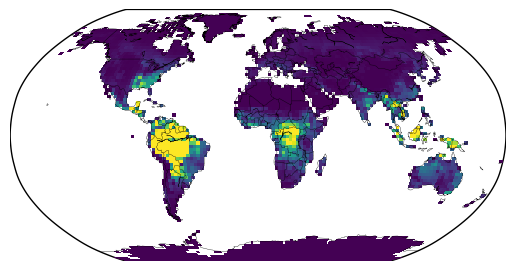

In [30]:
#GISS biogenic VOC emissions

path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
list_of_files = ['/GCAP2-GISS_Raw Data/HEMCO.E21.base.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim119.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim126.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim245.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim370.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim434.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim460.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim585.2090s.ymonmean_1.nc4']
MW_NOx = (30.01+46.01)/2
s_per_year = 31536000/12
data = Dataset(path_iec+list_of_files[7])
#print(data.variables)
AREA = np.ma.getdata(np.transpose(data.variables['AREA'])) #m2
test = (data.variables['EmisALD2_Biogenic'])
soilNO = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO_Soil'][:,:,:],axis=0))) #kg/m2/s (sum emissions over all months)
soil_base = 14/MW_NOx * soilNO*AREA*1e-9*s_per_year #convert to Tg N per year
lightNO = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO_Lightning'][:,:,:],axis=0))) #kg/m2/s (sum emissions over all months)
light_base = 14/MW_NOx * lightNO*AREA*1e-9*s_per_year #convert to Tg N per year

print(np.shape(soilNO))
print(np.sum(soil_base))
print(np.sum(test))
print(np.shape(test))

list_bvocs = ['EmisACET_Biogenic','EmisALD2_Biogenic','EmisEOH_Biogenic',
              'EmisLIMO_Biogenic','EmisISOP_Biogenic','EmisMTPA_Biogenic',
              'EmisMTPO_Biogenic','EmisPRPE_Biogenic','EmisSOAP_Biogenic','EmisSOAS_Biogenic']#,
              #'InvMEGAN_ACET_DIRECT','InvMEGAN_APIN','InvMEGAN_BPIN','InvMEGAN_SABI',
              #'InvMEGAN_MYRC','InvMEGAN_CARE','InvMEGAN_OCIM','InvMEGAN_OMON',
              #'InvMEGAN_FARN','InvMEGAN_OSQT','InvMEGAN_MBOX','InvMEGAN_FAXX','InvMEGAN_AAXX'] #'EmisC2H4_Biogenic','EmisMOH_Biogenic',

AREA = np.ma.getdata(np.transpose(data.variables['AREA'])) #m2
print(np.shape(AREA))
s_per_year = 31536000/12

print(np.shape(AREA))

emis_bio= np.zeros((144,90))

for ivoc in list_bvocs:
    if 'ACET' in ivoc:
        cfactor = (3*12)/58.09
    elif 'ALD2' in ivoc:
        cfactor = (2*12)/44.06
    elif 'C2H4' in ivoc:
        cfactor = (2*12)/28.05
    elif 'EOH' in ivoc:
        cfactor = (2*12)/46.07
    elif ('LIMO' in ivoc) or ('MTPA' in ivoc) or ('MTPO' in ivoc) or ('APIN' in ivoc) or \
    ('BPIN' in ivoc) or ('SABI' in ivoc) or ('MYRC' in ivoc) or ('CARE' in ivoc) or \
    ('OCIM' in ivoc) or ('OMON' in ivoc):
        cfactor = (10*12)/136.26
    elif 'ISOP' in ivoc:
        cfactor =  (5*12)/68.13
    elif 'MOH' in ivoc:
        cfactor = (1*12)/32.05
    elif 'PRPE' in ivoc:
        cfactor = (3*12)/42.09
    elif 'SOAP' in ivoc:
        cfactor = (12*12)/150
    elif 'SOAS' in ivoc:
        cfactor = (12*12)/150
    elif ('FARN' in ivoc) or ('OSQT' in ivoc):
        cfactor = (15*12)/204.35
    elif 'MBOX' in ivoc:
        cfactor = (5*12)/88.148
    elif 'FAXX' in ivoc:
        cfactor = (1*12)/46.03
    elif 'AAXX' in ivoc:
        cfactor = (2*12)/60.052
    #print(cfactor)
    emis_bio += 1e-9*s_per_year*cfactor*AREA*np.ma.getdata(np.transpose(np.sum(data.variables[ivoc][:,:,:],axis=0)))
    print(ivoc+': '+str(np.sum(1e-9*s_per_year*cfactor*AREA*np.ma.getdata(np.transpose(np.sum(data.variables[ivoc][:,:,:],axis=0))))))

print(np.sum(emis_bio))
m = Basemap(projection='robin',lon_0=0,resolution='c')
m.drawmapboundary(fill_color='White')
m.drawcoastlines(linewidth=0.25,zorder=3)
m.drawcountries(linewidth=0.25,zorder=3)
xpi25,ypi2 = m(xp25,yp2)
xpi,ypi = m(xp,yp)
data = np.ma.array(emis_bio,mask =~landmask2x25)
#print('Average change Precip: ',+np.mean(data))
plot = m.pcolor(xpi25,ypi2,data, vmin=0, vmax=1, snap=True,zorder=2)

# Figure S4 - Met Results and Ozone (GISS)

C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:156: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,data, vmin=0, vmax=100, snap=True,zorder=2)


(720, 360) (360, 720)
Average change Ozone:  -0.27260338694339753


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:163: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(720, 360) (360, 720)
Average change Ozone:  0.009875157148771926


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:163: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(720, 360) (360, 720)
Average change Ozone:  1.0623675015703518


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:163: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:165: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calcul

Average change Temp:  0.279014874969099


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:177: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Temp:  0.6736725975380992


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:177: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Temp:  1.5249791418246859


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:177: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:179: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell e

Average change H2O:  6.503621779025128


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:191: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change H2O:  14.70176262942066


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:191: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change H2O:  32.48989719055375


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:191: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:193: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

Average change PBLH:  0.743854904352315


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:205: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change PBLH:  1.8212590703524896


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:205: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change PBLH:  6.324162401116799


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:205: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:207: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell e

Average change Precip:  1.8632809091801419


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:219: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Precip:  5.35431178018846


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:219: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Precip:  9.939570367031177


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:219: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:221: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

Average change Wind:  -8.147074220567706


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:233: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Wind:  -8.400515137854816


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:233: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Wind:  -32.6364006514658


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:233: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:235: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

55.11621 49.427734 49.59143
Average change Theta:  3.1829548263727316


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:248: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


53.599213 50.588226 49.59143
Average change Theta:  4.269329484644021


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:248: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


53.97705 53.470184 49.59143
Average change Theta:  5.928019754827827


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:248: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:272: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

Soil NOx:  -233.9031630961558
Soil NOx:  32.77924794236412


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:277: RuntimeWarning: divide by zero encountered in divide
  soil = 100*(soil - soil_base)/soil_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:277: RuntimeWarning: invalid value encountered in divide
  soil = 100*(soil - soil_base)/soil_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:282: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array 

Soil NOx:  95.309421336248


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:284: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,light_base, vmin=0, vmax=0.01, snap=True,zorder=2)


5.781961573382635
27032.389868887414
Lightning NOx:  89367.6853866553


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:290: RuntimeWarning: divide by zero encountered in divide
  light = 100*(light - light_base)/light_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:290: RuntimeWarning: invalid value encountered in divide
  light = 100*(light - light_base)/light_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:295: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2

6.156899271075701
43731.123295054196
Lightning NOx:  144564.55940955188


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:290: RuntimeWarning: divide by zero encountered in divide
  light = 100*(light - light_base)/light_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:290: RuntimeWarning: invalid value encountered in divide
  light = 100*(light - light_base)/light_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:295: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2

7.025565084213859
319085.81395875703
Lightning NOx:  1054911.8944551456


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:290: RuntimeWarning: divide by zero encountered in divide
  light = 100*(light - light_base)/light_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:290: RuntimeWarning: invalid value encountered in divide
  light = 100*(light - light_base)/light_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:295: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2

409.3498441447259
409.3498441447259 363.7373491294888
BVOCs:  39.84890318156886


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:328: RuntimeWarning: invalid value encountered in divide
  bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:332: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


462.5814151412825
462.5814151412825 363.7373491294888
BVOCs:  95.86210975953553


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:328: RuntimeWarning: invalid value encountered in divide
  bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:332: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


579.6040312738699
579.6040312738699 363.7373491294888
BVOCs:  92.30354799077185


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:328: RuntimeWarning: invalid value encountered in divide
  bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:332: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\1862708231.py:344: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


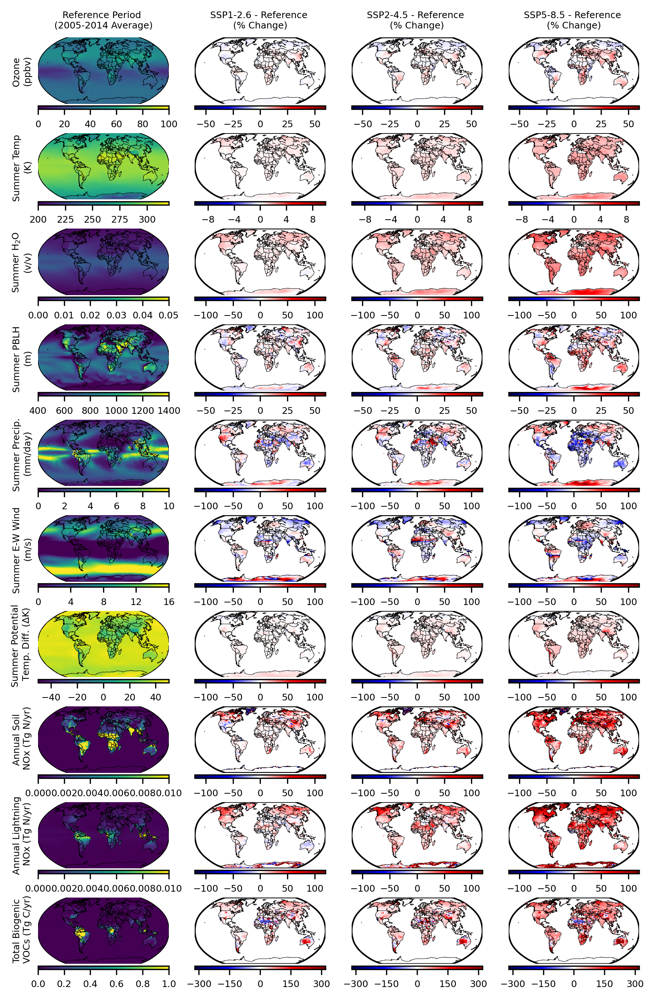

In [133]:
# Plot GISS results - Ozone

#SSP126, 245, 585 vs ozone, temp, pblh, precip, dry dep, biogenics, E-W wind

#1 Read in Met data files
# calculate the delta relative to the base for each month?
# 2 Take summertime annual average of the deltas for NH and SH, then stick back together
# 3) then plot the resulting deltas and show compared to ozone results? (need to use 0.5x0.5 meshgrid, as well as a 2x2.5 meshgrid). 

#GISS ozone plots
path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
list_of_files = ['/GCAP2-GISS_Raw Data/Ozone/OSDMA8.base.nc4', 
                '/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim126.2090s.nc4','/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim245.2090s.nc4',
                 '/GCAP2-GISS_Raw Data/Ozone/OSDMA8.clim585.2090s.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.base.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim126.2090s.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim245.2090s.ymonmean.nc4',
                '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim585.2090s.ymonmean.nc4',
                '/GCAP2-GISS_Raw Data/HEMCO.E21.base.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim126.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim245.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim585.2090s.ymonmean_1.nc4']

data = Dataset(path_iec+list_of_files[0])
#base_ozone_cesm = data.variables['MDA8'][0,0,:,:]
#data = Dataset(path_iec+list_of_files[1])
base_ozone_giss = data.variables['corrected'][:,:]

data = Dataset(path_iec+list_of_files[4])
#print(data)
#print(np.shape(latarray))

TS = data.variables['Met_TS']
TS_NH = np.ma.getdata(np.transpose(np.mean(TS[3:8,:,:], axis = 0)))
TS_SH = np.ma.getdata(np.transpose(np.mean(TS[[0,1,2,9,10,11],:,:], axis = 0)))
TS_NH = np.where((latarray >= 0), TS_NH, 0)
TS_SH = np.where((latarray < 0), TS_SH, 0)
TS_summer_base = TS_NH + TS_SH

TropLevel = data.variables['Met_TropLev'] #global average trop level is 23 (can make more specific mask later)
Wind = data.variables['Met_U']
#print(np.shape(Wind))
Wind_NH = np.ma.getdata(np.transpose(np.mean(Wind[3:8,0:20,:,:], axis = (0,1))))
Wind_SH = np.ma.getdata(np.transpose(np.mean(Wind[[0,1,2,9,10,11],0:20,:,:], axis = (0,1))))
Wind_NH = np.where((latarray >= 0), Wind_NH, 0)
Wind_SH = np.where((latarray < 0), Wind_SH, 0)
Wind_summer_base = Wind_NH + Wind_SH

PBLH = data.variables['Met_PBLH']
PBLH_NH = np.ma.getdata(np.transpose(np.mean(PBLH[3:8,:,:], axis = 0)))
PBLH_SH = np.ma.getdata(np.transpose(np.mean(PBLH[[0,1,2,9,10,11],:,:], axis = 0)))
PBLH_NH = np.where((latarray >= 0), PBLH_NH, 0)
PBLH_SH = np.where((latarray < 0), PBLH_SH, 0)
PBLH_summer_base = PBLH_NH + PBLH_SH

Precip = data.variables['Met_PRECTOT']
Precip_NH = np.ma.getdata(np.transpose(np.mean(Precip[3:8,:,:], axis = 0)))
Precip_SH = np.ma.getdata(np.transpose(np.mean(Precip[[0,1,2,9,10,11],:,:], axis = 0)))
Precip_NH = np.where((latarray >= 0), Precip_NH, 0)
Precip_SH = np.where((latarray < 0), Precip_SH, 0)
Precip_summer_base = Precip_NH + Precip_SH

H2O = data.variables['Met_AVGW']
H2O_NH = np.ma.getdata(np.transpose(np.mean(H2O[3:8,0:20,:,:], axis = (0,1))))
H2O_SH = np.ma.getdata(np.transpose(np.mean(H2O[[0,1,2,9,10,11],0:20,:,:], axis = (0,1))))
H2O_NH = np.where((latarray >= 0), H2O_NH, 0)
H2O_SH = np.where((latarray < 0), H2O_SH, 0)
H2O_summer_base = H2O_NH + H2O_SH

#Incident shortwave radiation at ground (W/m2)
SW = data.variables['Met_SWGDN']
SW_NH = np.ma.getdata(np.transpose(np.mean(SW[3:8,:,:], axis = 0)))
SW_SH = np.ma.getdata(np.transpose(np.mean(SW[[0,1,2,9,10,11],:,:], axis = 0)))
SW_NH = np.where((latarray >= 0), SW_NH, 0)
SW_SH = np.where((latarray < 0), SW_SH, 0)
SW_summer_base = SW_NH + SW_SH

Theta = data.variables['Met_THETA']
Theta_NH = np.ma.getdata(np.transpose(np.mean(Theta[3:8,17,:,:], axis = 0)))-np.ma.getdata(np.transpose(np.mean(Theta[3:8,0,:,:], axis = 0)))
Theta_SH = np.ma.getdata(np.transpose(np.mean(Theta[[0,1,2,9,10,11],17,:,:], axis = 0)))-np.ma.getdata(np.transpose(np.mean(Theta[[0,1,2,9,10,11],0,:,:], axis = 0)))
Theta_NH = np.where((latarray >= 0), Theta_NH, 0)
Theta_SH = np.where((latarray < 0), Theta_SH, 0)
Theta_summer_base = Theta_NH + Theta_SH

#Soil NOx
MW_NOx = (30.01+46.01)/2
s_per_year = 31536000/12
data = Dataset(path_iec+list_of_files[8])
AREA = np.ma.getdata(np.transpose(data.variables['AREA'])) #m2
soilNO = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO_Soil'][:,:,:],axis=0))) #kg/m2/s
soil_base = 14/MW_NOx * soilNO*AREA*1e-9*s_per_year #convert to Tg N per year

#lightning NOx
LightningNO = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO_Lightning'][:,:,:],axis=0))) #kg/m2/s
light_base = 14/MW_NOx*AREA*LightningNO *1e-9*s_per_year #convert to Tg N per year

#biogenic VOCs
list_bvocs = ['EmisACET_Biogenic','EmisALD2_Biogenic','EmisEOH_Biogenic',
              'EmisLIMO_Biogenic','EmisISOP_Biogenic','EmisMTPA_Biogenic',
              'EmisMTPO_Biogenic','EmisPRPE_Biogenic','EmisSOAP_Biogenic','EmisSOAS_Biogenic']#,'EmisC2H4_Biogenic','EmisMOH_Biogenic',
         #     'InvMEGAN_ACET_DIRECT','InvMEGAN_APIN','InvMEGAN_BPIN','InvMEGAN_SABI',
         #     'InvMEGAN_MYRC','InvMEGAN_CARE','InvMEGAN_OCIM','InvMEGAN_OMON',
         #     'InvMEGAN_FARN','InvMEGAN_OSQT','InvMEGAN_MBOX','InvMEGAN_FAXX','InvMEGAN_AAXX']
emis_bio_base= np.zeros((144,90))
for ivoc in list_bvocs:
    if 'ACET' in ivoc:
        cfactor = (3*12)/58.09
    elif 'ALD2' in ivoc:
        cfactor = (2*12)/44.06
    elif 'C2H4' in ivoc:
        cfactor = (2*12)/28.05
    elif 'EOH' in ivoc:
        cfactor = (2*12)/46.07
    elif ('LIMO' in ivoc) or ('MTPA' in ivoc) or ('MTPO' in ivoc) or ('APIN' in ivoc) or \
    ('BPIN' in ivoc) or ('SABI' in ivoc) or ('MYRC' in ivoc) or ('CARE' in ivoc) or \
    ('OCIM' in ivoc) or ('OMON' in ivoc):
        cfactor = (10*12)/136.26
    elif 'ISOP' in ivoc:
        cfactor =  (5*12)/68.13
    elif 'MOH' in ivoc:
        cfactor = (1*12)/32.05
    elif 'PRPE' in ivoc:
        cfactor = (3*12)/42.09
    elif 'SOAP' in ivoc:
        cfactor = (12*12)/150
    elif 'SOAS' in ivoc:
        cfactor = (12*12)/150
    elif ('FARN' in ivoc) or ('OSQT' in ivoc):
        cfactor = (15*12)/204.35
    elif 'MBOX' in ivoc:
        cfactor = (5*12)/88.148
    elif 'FAXX' in ivoc:
        cfactor = (1*12)/46.03
    elif 'AAXX' in ivoc:
        cfactor = (2*12)/60.052
    #print(cfactor)
    emis_bio_base += 1e-9*s_per_year*cfactor*AREA*np.ma.getdata(np.transpose(np.sum(data.variables[ivoc][:,:,:],axis=0)))
    #print(ivoc+': '+str(np.sum(1e-9*s_per_year*cfactor*AREA*np.ma.getdata(np.transpose(data.variables[ivoc][0,:,:])))))

numplts=40
fig = plt.figure(dpi=300,figsize=(7,11))

for iplt in np.arange(0,numplts):
    ax = fig.add_subplot(10,4,iplt+1)
    m = Basemap(projection='robin',lon_0=0,resolution='c')
    m.drawmapboundary(fill_color='White')
    m.drawcoastlines(linewidth=0.25,zorder=3)
    m.drawcountries(linewidth=0.25,zorder=3)
    xpi25,ypi2 = m(xp25,yp2)
    xpi,ypi = m(xp,yp)

    #data = Dataset(path_iec+list_of_files[iplt])

    if ((iplt == 0)):
        data = np.transpose(base_ozone_giss)
        plot = m.pcolor(xpi,ypi,data, vmin=0, vmax=100, snap=True,zorder=2)
    elif ((iplt == 1) or (iplt == 2) or (iplt == 3)):
        data = Dataset(path_iec+list_of_files[iplt])
        data = 100*(data.variables['corrected'][:,:] - base_ozone_giss)/base_ozone_giss
        print(np.shape(landmask2d), np.shape(data))
        data = np.ma.array(data,mask =~np.transpose(landmask2d))
        print('Average change Ozone: ',+np.mean(data))
        plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==4)):
        plot = m.pcolor(xpi25,ypi2,TS_summer_base, vmin=200, vmax=320, snap=True,zorder=2)
    elif ((iplt >= 5) and (iplt <8)):
        data = Dataset(path_iec+list_of_files[iplt])
        TS = data.variables['Met_TS']
        TS_NH = np.ma.getdata(np.transpose(np.mean(TS[3:8,:,:], axis = 0)))
        TS_SH = np.ma.getdata(np.transpose(np.mean(TS[[0,1,2,9,10,11],:,:], axis = 0)))
        TS_NH = np.where((latarray >= 0), TS_NH, 0)
        TS_SH = np.where((latarray < 0), TS_SH, 0)
        TS_summer = TS_NH + TS_SH
        TS_summer = 100*(TS_summer - TS_summer_base)/TS_summer_base
        data = np.ma.array(TS_summer,mask =~landmask2x25)
        print('Average change Temp: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==8)):
        plot = m.pcolor(xpi25,ypi2,H2O_summer_base, vmin=0, vmax=0.05, snap=True,zorder=2)    
    elif ((iplt >= 9) and (iplt < 12)):
        data = Dataset(path_iec+list_of_files[iplt-4])
        H2O = data.variables['Met_AVGW']
        H2O_NH = np.ma.getdata(np.transpose(np.mean(H2O[3:8,0:20,:,:], axis = (0,1))))
        H2O_SH = np.ma.getdata(np.transpose(np.mean(H2O[[0,1,2,9,10,11],0:20,:,:], axis = (0,1))))
        H2O_NH = np.where((latarray >= 0), H2O_NH, 0)
        H2O_SH = np.where((latarray < 0), H2O_SH, 0)
        H2O_summer = H2O_NH + H2O_SH
        H2O_summer = 100*(H2O_summer - H2O_summer_base)/H2O_summer_base
        data = np.ma.array(H2O_summer,mask =~landmask2x25)
        print('Average change H2O: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==12)):
        plot = m.pcolor(xpi25,ypi2,PBLH_summer_base, vmin=400, vmax=1400, snap=True,zorder=2)
    elif ((iplt >= 13) and (iplt < 16)):
        data = Dataset(path_iec+list_of_files[iplt-8])
        PBLH = data.variables['Met_PBLH']
        PBLH_NH = np.ma.getdata(np.transpose(np.mean(PBLH[3:8,:,:], axis = 0)))
        PBLH_SH = np.ma.getdata(np.transpose(np.mean(PBLH[[0,1,2,9,10,11],:,:], axis = 0)))
        PBLH_NH = np.where((latarray >= 0), PBLH_NH, 0)
        PBLH_SH = np.where((latarray < 0), PBLH_SH, 0)
        PBLH_summer = PBLH_NH + PBLH_SH
        PBLH_summer = 100*(PBLH_summer - PBLH_summer_base)/PBLH_summer_base
        data = np.ma.array(PBLH_summer,mask =~landmask2x25)
        print('Average change PBLH: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt ==16):
        plot = m.pcolor(xpi25,ypi2,Precip_summer_base, vmin=0, vmax=10, snap=True,zorder=2)
    elif ((iplt >= 17) and (iplt < 20)):
        data = Dataset(path_iec+list_of_files[iplt-12])
        Precip = data.variables['Met_PRECTOT']
        Precip_NH = np.ma.getdata(np.transpose(np.mean(Precip[3:8,:,:], axis = 0)))
        Precip_SH = np.ma.getdata(np.transpose(np.mean(Precip[[0,1,2,9,10,11],:,:], axis = 0)))
        Precip_NH = np.where((latarray >= 0), Precip_NH, 0)
        Precip_SH = np.where((latarray < 0), Precip_SH, 0)
        Precip_summer = Precip_NH + Precip_SH
        Precip_summer = 100*(Precip_summer - Precip_summer_base)/Precip_summer_base
        data = np.ma.array(Precip_summer,mask =~landmask2x25)
        print('Average change Precip: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt ==20):
        plot = m.pcolor(xpi25,ypi2,Wind_summer_base, vmin=0, vmax=16, snap=True,zorder=2)
    elif ((iplt >= 21) and (iplt < 24)):
        data = Dataset(path_iec+list_of_files[iplt-16])
        Wind = data.variables['Met_U']
        Wind_NH = np.ma.getdata(np.transpose(np.mean(Wind[3:8,0:20,:,:], axis = (0,1))))
        Wind_SH = np.ma.getdata(np.transpose(np.mean(Wind[[0,1,2,9,10,11],0:20,:,:], axis = (0,1))))
        Wind_NH = np.where((latarray >= 0), Wind_NH, 0)
        Wind_SH = np.where((latarray < 0), Wind_SH, 0)
        Wind_summer = Wind_NH + Wind_SH
        Wind_summer = 100*(Wind_summer - Wind_summer_base)/Wind_summer_base
        data = np.ma.array(Wind_summer,mask =~landmask2x25)
        print('Average change Wind: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==24):
        plot = m.pcolor(xpi25,ypi2,Theta_summer_base, vmin=-50, vmax=50, snap=True,zorder=2)
    elif ((iplt >= 25) and (iplt < 28)):
        data = Dataset(path_iec+list_of_files[iplt-20])
        theta = data.variables['Met_THETA']
        theta_NH = np.ma.getdata(np.transpose(np.mean(theta[3:8,17,:,:], axis = 0)))-np.ma.getdata(np.transpose(np.mean(theta[3:8,0,:,:], axis = 0)))
        theta_SH = np.ma.getdata(np.transpose(np.mean(theta[[0,1,2,9,10,11],17,:,:], axis = 0)))-np.ma.getdata(np.transpose(np.mean(theta[[0,1,2,9,10,11],0,:,:], axis = 0)))
        theta_NH = np.where((latarray >= 0), theta_NH, 0)
        theta_SH = np.where((latarray < 0), theta_SH, 0)
        print(np.max(theta_SH), np.max(theta_NH), np.max(Theta_summer_base))
        theta_summer = theta_NH + theta_SH
        theta_summer = 100*(theta_summer - Theta_summer_base)/Theta_summer_base
        data = np.ma.array(theta_summer,mask =~landmask2x25)
        print('Average change Theta: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    #elif (iplt==28):
    #    #print(list_of_files[iplt-16])
    #    data = Dataset(path_iec+list_of_files[iplt-24])
    #    SW = data.variables['Met_SWGND']
    #    SW_NH = np.ma.getdata(np.transpose(np.mean(SW[3:8,:,:], axis = 0)))
    #    SW_SH = np.ma.getdata(np.transpose(np.mean(SW[[0,1,2,9,10,11],:,:], axis = 0)))
    #    SW_NH = np.where((latarray >= 0), SW_NH, 0)
    #    SW_SH = np.where((latarray < 0), SW_SH, 0)
    #    SW_summer = SW_NH + SW_SH
    #    plot = m.pcolor(xpi25,ypi2,SW_summer, vmin=0, vmax=120, snap=True,zorder=2)
    #elif ((iplt >= 29) and (iplt < 32)):
    #    data = Dataset(path_iec+list_of_files[iplt-24])
    #    SW = data.variables['Met_SWGND']
    #    SW_NH = np.ma.getdata(np.transpose(np.mean(SW[3:8,:,:], axis = 0)))
    #    SW_SH = np.ma.getdata(np.transpose(np.mean(SW[[0,1,2,9,10,11],:,:], axis = 0)))
    #    SW_NH = np.where((latarray >= 0), SW_NH, 0)
    #    SW_SH = np.where((latarray < 0), SW_SH, 0)
    #    SW_summer = SW_NH + SW_SH
    #    SW_summer = 100*(SW_summer - SW_summer_base)/SW_summer_base
    #    data = np.ma.array(SW_summer,mask =~landmask2x25)
    #    print('Average change SW at Ground: ',+np.mean(data))
    #    plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==28):
        plot = m.pcolor(xpi25,ypi2,soil_base, vmin=0, vmax=0.01, snap=True,zorder=2)
    elif ((iplt >= 29) and (iplt < 32)):
        data = Dataset(path_iec+list_of_files[iplt-20])
        soil = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO_Soil'][:,:,:],axis=0)))
        soil = 14/MW_NOx * soil*AREA*1e-9*s_per_year
        soil = 100*(soil - soil_base)/soil_base
        soil[soil == np.inf] = np.nan
        data = np.ma.array(soil,mask =~landmask2x25)
        #print(np.mean(soil), np.nanmean(data), data.mean(), np.mean(data.astype(float)))
        print('Soil NOx: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==32):
        plot = m.pcolor(xpi25,ypi2,light_base, vmin=0, vmax=0.01, snap=True,zorder=2)
    elif ((iplt >= 33) and (iplt < 36)):
        data = Dataset(path_iec+list_of_files[iplt-24])
        light = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO_Lightning'][:,:,:],axis=0)))
        light = 14/MW_NOx * light*AREA*1e-9*s_per_year
        print(np.sum(light))
        light = 100*(light - light_base)/light_base
        light[light == np.inf] = np.nan
        print(np.nanmean(light))
        data = np.ma.array(light,mask =~landmask2x25)
        print('Lightning NOx: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==36):
        bvoc = emis_bio_base
        plot = m.pcolor(xpi25,ypi2,bvoc, vmin=0, vmax=1, snap=True,zorder=2)
    elif (iplt >= 37) or (iplt < 40):
        emis_bio= np.zeros((144,90))
        data = Dataset(path_iec+list_of_files[iplt-28])
        for ivoc in list_bvocs:
            if 'ACET' in ivoc:
                cfactor = (3*12)/58.09
            elif 'ALD2' in ivoc:
                cfactor = (2*12)/44.06
            elif 'C2H4' in ivoc:
                cfactor = (2*12)/28.05
            elif 'EOH' in ivoc:
                cfactor = (2*12)/46.07
            elif ('LIMO' in ivoc) or ('MTPA' in ivoc) or ('MTPO' in ivoc) or ('APIN' in ivoc) or \
            ('BPIN' in ivoc) or ('SABI' in ivoc) or ('MYRC' in ivoc) or ('CARE' in ivoc) or \
            ('OCIM' in ivoc) or ('OMON' in ivoc):
                cfactor = (10*12)/136.26
            elif 'ISOP' in ivoc:
                cfactor =  (5*12)/68.13
            elif 'MOH' in ivoc:
                cfactor = (1*12)/32.05
            elif 'PRPE' in ivoc:
                cfactor = (3*12)/42.09
            elif 'SOAP' in ivoc:
                cfactor = (12*12)/150
            elif 'SOAS' in ivoc:
                cfactor = (12*12)/150
            emis_bio += 1e-9*s_per_year*cfactor*AREA*np.ma.getdata(np.transpose(np.sum(data.variables[ivoc][:,:,:],axis=0)))
        print(np.sum(emis_bio))
        print(np.sum(emis_bio), np.sum(emis_bio_base))
        bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
        bvoc[bvoc == np.inf] = np.nan
        data = np.ma.array(bvoc,mask =~landmask2x25)
        print('BVOCs: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')
        

    if ((iplt ==0)):
        ax.set_title('Reference Period \n(2005-2014 Average)',fontsize=6)
    elif iplt ==1:
        ax.set_title('SSP1-2.6 - Reference \n(% Change)',fontsize=6)
    elif iplt ==2:
        ax.set_title('SSP2-4.5 - Reference \n(% Change)',fontsize=6)
    elif iplt ==3:
        ax.set_title('SSP5-8.5 - Reference \n(% Change)',fontsize=6)

    cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
    tick_locator = ticker.MaxNLocator(nbins=5)
    cb.locator = tick_locator
    cb.update_ticks()
    #if  ((iplt ==0) or (iplt ==1)):
    #    cb.ax.set_xlabel('$\Delta$MDA8 O$_{3}$ (ppbv)',fontsize=5)
    #elif ((iplt ==2) or (iplt ==3)):
    #    cb.ax.set_xlabel('$\Delta$Annual Average PM$_{2.5}$ ($\\mu$gm$^{-3}$)',fontsize=5)
    cb.ax.tick_params(labelsize=6)
    if iplt ==0:
        plt.ylabel('Ozone \n(ppbv)',fontsize=6)
    elif iplt ==4:
        plt.ylabel('Summer Temp \n(K)',fontsize=6)
    elif iplt ==8:
        plt.ylabel('Summer H$_2$O \n(v/v)',fontsize=6)
    elif iplt ==12:
        plt.ylabel('Summer PBLH \n(m)',fontsize=6)   
    elif iplt ==16:
        plt.ylabel('Summer Precip. \n(mm/day)',fontsize=6)
    elif iplt ==20:
        plt.ylabel('Summer E-W Wind \n(m/s)',fontsize=6)
    elif iplt ==24:
        plt.ylabel('Summer Potential \nTemp. Diff. ($\Delta$K)',fontsize=6)
    elif iplt ==28:
        plt.ylabel('Annual Soil\n NOx (Tg N/yr)',fontsize=6)
    elif iplt ==32:
        plt.ylabel('Annual Lightning\n NOx (Tg N/yr)',fontsize=6)
    elif iplt ==36:
        plt.ylabel('Total Biogenic\n VOCs (Tg C/yr)',fontsize=6)

plt.savefig('FigureS3_summer_giss_ozone_maps.png', bbox_inches='tight')
plt.show();

# Figure S5 - Met and Ozone data (CESM)

(144, 90)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:175: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,data, vmin=0, vmax=100, snap=True,zorder=2)


(720, 360) (360, 720)
Average change O3:  -4.770015457868544


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:182: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(720, 360) (360, 720)
Average change O3:  3.5879991817244936


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:182: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(720, 360) (360, 720)
Average change O3:  6.735030965986165


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:182: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:184: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calcul

Average change Temp:  0.7306610292032631


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:196: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Temp:  1.2375857502762913


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:196: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Temp:  2.549902843619125


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:196: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:198: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell e

Average change H2O:  13.940904563168916


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:211: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change H2O:  23.715278181712424


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:211: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change H2O:  54.19031380874826


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:211: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:213: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

Average change PBLH:  3.7903557977547697


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:226: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change PBLH:  5.004383852227781


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:226: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change PBLH:  9.888876366914845


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:226: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:228: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell e

Average change Precip:  nan


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:238: RuntimeWarning: invalid value encountered in divide
  Precip_summer = 100*(Precip_summer - Precip_summer_base)/Precip_summer_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:241: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Precip:  nan


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:238: RuntimeWarning: invalid value encountered in divide
  Precip_summer = 100*(Precip_summer - Precip_summer_base)/Precip_summer_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:241: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Precip:  nan


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:243: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,Wind_summer_base, vmin=0, vmax=16, snap=True,zorder=2)


Average change Wind:  -2.457206204193811


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:256: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Wind:  -6.856916552757096


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:256: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Wind:  -16.280970073289904


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:256: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:258: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

Average change Dry Dep:  5.175302284492787


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:271: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Dry Dep:  12.25224668450442


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:271: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Dry Dep:  10.001395089285714


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:271: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:273: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

80.91257 89.3923 89.997284
Average change Theta:  0.8075532269733016


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:286: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


78.72412 86.73193 89.997284
Average change Theta:  0.4400580802480805


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:286: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


74.989655 82.90173 89.997284
Average change Theta:  0.17360443356648442


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:286: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:288: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

Soil NOx:  55.73055222636542


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:293: RuntimeWarning: divide by zero encountered in divide
  soil = 100*(soil - soil_base)/soil_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:293: RuntimeWarning: invalid value encountered in divide
  soil = 100*(soil - soil_base)/soil_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:298: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array 

Soil NOx:  88.78265391268344


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:293: RuntimeWarning: divide by zero encountered in divide
  soil = 100*(soil - soil_base)/soil_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:293: RuntimeWarning: invalid value encountered in divide
  soil = 100*(soil - soil_base)/soil_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:298: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array 

Soil NOx:  502.9803334289746


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:300: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,light_base, vmin=0, vmax=0.01, snap=True,zorder=2)
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:305: RuntimeWarning: divide by zero encountered in divide
  light = 100*(light - light_base)/light_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:305: RuntimeWarning: invalid value encountered in divide
  light = 100*(light - light_base)/light_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:309: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which ca

Lightning NOx:  138.22745759729898


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:305: RuntimeWarning: divide by zero encountered in divide
  light = 100*(light - light_base)/light_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:305: RuntimeWarning: invalid value encountered in divide
  light = 100*(light - light_base)/light_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:309: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2

Lightning NOx:  143.0826367980819


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:305: RuntimeWarning: divide by zero encountered in divide
  light = 100*(light - light_base)/light_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:305: RuntimeWarning: invalid value encountered in divide
  light = 100*(light - light_base)/light_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:309: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2

Lightning NOx:  871.7463491131005


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:312: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,bvoc, vmin=0, vmax=1, snap=True,zorder=2)
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:341: RuntimeWarning: invalid value encountered in divide
  bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:345: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local

BVOCs:  41.11158036669442


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:341: RuntimeWarning: invalid value encountered in divide
  bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:345: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


BVOCs:  58.74182237436175


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:341: RuntimeWarning: invalid value encountered in divide
  bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:345: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\2361600027.py:356: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


BVOCs:  162.92107841146608


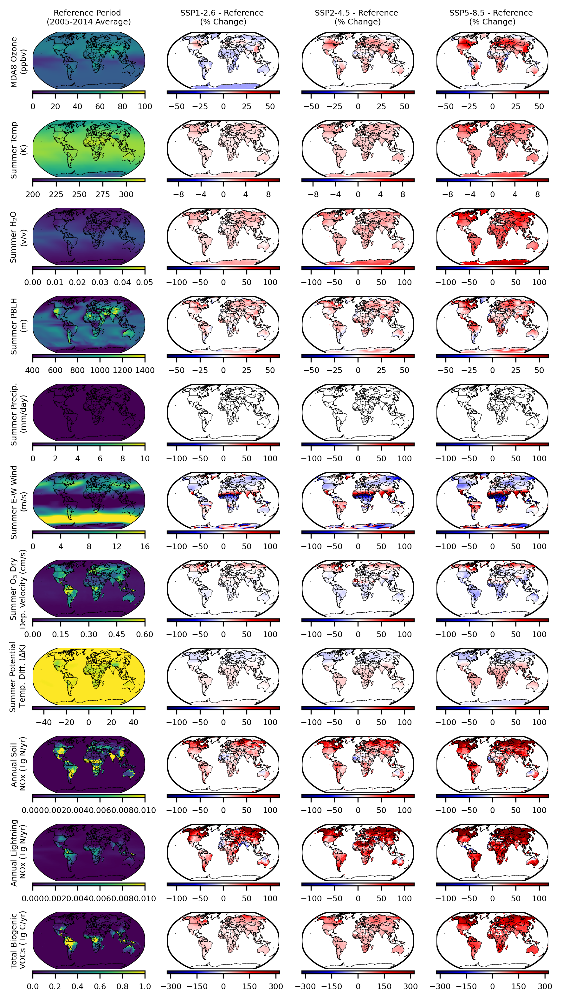

In [134]:
# NOW THE CESM MET DATA - Ozone

# Plot Ozone results

#SSP126, 245, 585 vs ozone, temp, pblh, precip, dry dep, biogenics, E-W wind

#1 Read in Met data files
# calculate the delta relative to the base for each month?
# 2 Take summertime annual average of the deltas for NH and SH, then stick back together
# 3) then plot the resulting deltas and show compared to ozone results? (need to use 0.5x0.5 meshgrid, as well as a 2x2.5 meshgrid). 

#GISS ozone plots
path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
list_of_files = ['/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.base.nc', 
                '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.clim126.2090s.nc','/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.clim245.2090s.nc',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/OSDMA8.clim585.2090s.nc',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.base.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim126.2090s.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim245.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim585.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.DryDep.base.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.DryDep.clim126.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.DryDep.clim245.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.DryDep.clim585.nc',
                '/GCAP2-CESM2_Raw Data/HEMCO.CESM2.base.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim126.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim245.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim585.2090s.ymonmean.nc4']

data = Dataset(path_iec+list_of_files[0])
base_ozone_cesm = data.variables['MDA8'][0,0,:,:]
#data = Dataset(path_iec+list_of_files[1])
#base_ozone_giss = data.variables['corrected'][:,:]

data = Dataset(path_iec+list_of_files[4])
#print(data.variables)
#print(np.shape(latarray))

TS = data.variables['Met_TS']
TS_NH = np.ma.getdata(np.transpose(np.mean(TS[3:8,:,:], axis = 0)))
TS_SH = np.ma.getdata(np.transpose(np.mean(TS[[0,1,2,9,10,11],:,:], axis = 0)))
TS_NH = np.where((latarray >= 0), TS_NH, 0)
TS_SH = np.where((latarray < 0), TS_SH, 0)
TS_summer_base = TS_NH + TS_SH

TropLevel = data.variables['Met_TropLev'] #global average trop level is 23 (can make more specific mask later)
Wind = data.variables['Met_U']
#print(np.shape(Wind))
Wind_NH = np.ma.getdata(np.transpose(np.mean(Wind[3:8,0:20,:,:], axis = (0,1))))
Wind_SH = np.ma.getdata(np.transpose(np.mean(Wind[[0,1,2,9,10,11],0:20,:,:], axis = (0,1))))
Wind_NH = np.where((latarray >= 0), Wind_NH, 0)
Wind_SH = np.where((latarray < 0), Wind_SH, 0)
Wind_summer_base = Wind_NH + Wind_SH

PBLH = data.variables['Met_PBLH']
PBLH_NH = np.ma.getdata(np.transpose(np.mean(PBLH[3:8,:,:], axis = 0)))
PBLH_SH = np.ma.getdata(np.transpose(np.mean(PBLH[[0,1,2,9,10,11],:,:], axis = 0)))
PBLH_NH = np.where((latarray >= 0), PBLH_NH, 0)
PBLH_SH = np.where((latarray < 0), PBLH_SH, 0)
PBLH_summer_base = PBLH_NH + PBLH_SH

Precip = data.variables['Met_PRECTOT']
Precip_NH = np.ma.getdata(np.transpose(np.mean(Precip[3:8,:,:], axis = 0)))
Precip_SH = np.ma.getdata(np.transpose(np.mean(Precip[[0,1,2,9,10,11],:,:], axis = 0)))
Precip_NH = np.where((latarray >= 0), Precip_NH, 0)
Precip_SH = np.where((latarray < 0), Precip_SH, 0)
Precip_summer_base = Precip_NH + Precip_SH

H2O = data.variables['Met_AVGW']
H2O_NH = np.ma.getdata(np.transpose(np.mean(H2O[3:8,0:20,:,:], axis = (0,1))))
H2O_SH = np.ma.getdata(np.transpose(np.mean(H2O[[0,1,2,9,10,11],0:20,:,:], axis = (0,1))))
H2O_NH = np.where((latarray >= 0), H2O_NH, 0)
H2O_SH = np.where((latarray < 0), H2O_SH, 0)
H2O_summer_base = H2O_NH + H2O_SH

#get the difference of potential temperature in the troposphere as an indicator of stagnation
Theta = data.variables['Met_THETA']
Theta_NH = np.ma.getdata(np.transpose(np.mean(Theta[3:8,17,:,:], axis = 0)))-np.ma.getdata(np.transpose(np.mean(Theta[3:8,0,:,:], axis = 0)))
Theta_SH = np.ma.getdata(np.transpose(np.mean(Theta[[0,1,2,9,10,11],17,:,:], axis = 0)))-np.ma.getdata(np.transpose(np.mean(Theta[[0,1,2,9,10,11],0,:,:], axis = 0)))
Theta_NH = np.where((latarray >= 0), Theta_NH, 0)
Theta_SH = np.where((latarray < 0), Theta_SH, 0)
Theta_summer_base = Theta_NH + Theta_SH

#Incident shortwave radiation at ground (W/m2)
SW = data.variables['Met_SWGDN']
SW_NH = np.ma.getdata(np.transpose(np.mean(SW[3:8,:,:], axis = 0)))
SW_SH = np.ma.getdata(np.transpose(np.mean(SW[[0,1,2,9,10,11],:,:], axis = 0)))
SW_NH = np.where((latarray >= 0), SW_NH, 0)
SW_SH = np.where((latarray < 0), SW_SH, 0)
SW_summer_base = SW_NH + SW_SH

data = Dataset(path_iec+list_of_files[8])
drydep = data.variables['DryDepVel_O3']
drydep_NH = np.ma.getdata(np.transpose(np.mean(drydep[3:8,:,:], axis = 0)))
drydep_SH = np.ma.getdata(np.transpose(np.mean(drydep[[0,1,2,9,10,11],:,:], axis = 0)))
drydep_NH = np.where((latarray >= 0), drydep_NH, 0)
drydep_SH = np.where((latarray < 0), drydep_SH, 0)
drydep_summer_base = drydep_NH + drydep_SH

#Soil NOx
MW_NOx = (30.01+46.01)/2
s_per_year = 31536000/12
data = Dataset(path_iec+list_of_files[12])
AREA = np.ma.getdata(np.transpose(data.variables['AREA'])) #m2
print(np.shape(AREA))
soilNO = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO_Soil'][:,:,:],axis=0))) #kg/m2/s
soil_base = 14/MW_NOx * soilNO*AREA*1e-9*s_per_year #convert to Tg N per year

#lightning NOx
LightningNO = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO_Lightning'][:,:,:],axis=0))) #kg/m2/s
light_base = 14/MW_NOx*AREA*LightningNO *1e-9*s_per_year #convert to Tg N per year

#Biogenic VOCs
list_bvocs = ['EmisACET_Biogenic','EmisALD2_Biogenic','EmisC2H4_Biogenic','EmisEOH_Biogenic',
              'EmisLIMO_Biogenic','EmisISOP_Biogenic','EmisMOH_Biogenic','EmisMTPA_Biogenic',
              'EmisMTPO_Biogenic','EmisPRPE_Biogenic','EmisSOAP_Biogenic','EmisSOAS_Biogenic']#,
             # 'InvMEGAN_ACET_DIRECT','InvMEGAN_APIN','InvMEGAN_BPIN','InvMEGAN_SABI',
             # 'InvMEGAN_MYRC','InvMEGAN_CARE','InvMEGAN_OCIM','InvMEGAN_OMON',
              #'InvMEGAN_FARN','InvMEGAN_OSQT','InvMEGAN_MBOX','InvMEGAN_FAXX','InvMEGAN_AAXX']
emis_bio_base= np.zeros((144,90))
for ivoc in list_bvocs:
    if 'ACET' in ivoc:
        cfactor = (3*12)/58.09
    elif 'ALD2' in ivoc:
        cfactor = (2*12)/44.06
    elif 'C2H4' in ivoc:
        cfactor = (2*12)/28.05
    elif 'EOH' in ivoc:
        cfactor = (2*12)/46.07
    elif ('LIMO' in ivoc) or ('MTPA' in ivoc) or ('MTPO' in ivoc) or ('APIN' in ivoc) or \
    ('BPIN' in ivoc) or ('SABI' in ivoc) or ('MYRC' in ivoc) or ('CARE' in ivoc) or \
    ('OCIM' in ivoc) or ('OMON' in ivoc):
        cfactor = (10*12)/136.26
    elif 'ISOP' in ivoc:
        cfactor =  (5*12)/68.13
    elif 'MOH' in ivoc:
        cfactor = (1*12)/32.05
    elif 'PRPE' in ivoc:
        cfactor = (3*12)/42.09
    elif 'SOAP' in ivoc:
        cfactor = (12*12)/150
    elif 'SOAS' in ivoc:
        cfactor = (12*12)/150
    #print(cfactor)
    emis_bio_base += 1e-9*s_per_year*cfactor*AREA*np.ma.getdata(np.transpose(np.sum(data.variables[ivoc][:,:,:],axis=0)))
    #print(ivoc+': '+str(np.sum(1e-9*s_per_year*cfactor*AREA*np.ma.getdata(np.transpose(data.variables[ivoc][0,:,:])))))
    #print(np.sum(emis_bio_base))


numplts=44
# w x H
fig = plt.figure(dpi=300,figsize=(7,13))

for iplt in np.arange(0,numplts):
    ax = fig.add_subplot(11,4,iplt+1)
    m = Basemap(projection='robin',lon_0=0,resolution='c')
    m.drawmapboundary(fill_color='White')
    m.drawcoastlines(linewidth=0.25,zorder=3)
    m.drawcountries(linewidth=0.25,zorder=3)
    xpi25,ypi2 = m(xp25,yp2)
    xpi,ypi = m(xp,yp)

    #data = Dataset(path_iec+list_of_files[iplt])

    if ((iplt == 0)):
        data = np.transpose(base_ozone_cesm)
        plot = m.pcolor(xpi,ypi,data, vmin=0, vmax=100, snap=True,zorder=2)
    elif ((iplt == 1) or (iplt == 2) or (iplt == 3)):
        data = Dataset(path_iec+list_of_files[iplt])
        data = 100*(data.variables['MDA8'][0,0,:,:] - base_ozone_cesm)/base_ozone_cesm
        print(np.shape(landmask2d), np.shape(data))
        data = np.ma.array(data,mask =~np.transpose(landmask2d))
        print('Average change O3: ',+np.mean(data))
        plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==4)):
        plot = m.pcolor(xpi25,ypi2,TS_summer_base, vmin=200, vmax=320, snap=True,zorder=2)
    elif ((iplt >= 5) and (iplt <8)):
        data = Dataset(path_iec+list_of_files[iplt])
        TS = data.variables['Met_TS']
        TS_NH = np.ma.getdata(np.transpose(np.mean(TS[3:8,:,:], axis = 0)))
        TS_SH = np.ma.getdata(np.transpose(np.mean(TS[[0,1,2,9,10,11],:,:], axis = 0)))
        TS_NH = np.where((latarray >= 0), TS_NH, 0)
        TS_SH = np.where((latarray < 0), TS_SH, 0)
        TS_summer = TS_NH + TS_SH
        TS_summer = 100*(TS_summer - TS_summer_base)/TS_summer_base
        data = np.ma.array(TS_summer,mask =~landmask2x25)
        print('Average change Temp: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==8)):
        plot = m.pcolor(xpi25,ypi2,H2O_summer_base, vmin=0, vmax=0.05, snap=True,zorder=2)
    elif ((iplt >= 9) and (iplt < 12)):
        #print(list_of_files[iplt-4])
        data = Dataset(path_iec+list_of_files[iplt-4])
        H2O = data.variables['Met_AVGW']
        H2O_NH = np.ma.getdata(np.transpose(np.mean(H2O[3:8,0:20,:,:], axis = (0,1))))
        H2O_SH = np.ma.getdata(np.transpose(np.mean(H2O[[0,1,2,9,10,11],0:20,:,:], axis = (0,1))))
        H2O_NH = np.where((latarray >= 0), H2O_NH, 0)
        H2O_SH = np.where((latarray < 0), H2O_SH, 0)
        H2O_summer = H2O_NH + H2O_SH
        H2O_summer = 100*(H2O_summer - H2O_summer_base)/H2O_summer_base
        data = np.ma.array(H2O_summer,mask =~landmask2x25)
        print('Average change H2O: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==12)):
        plot = m.pcolor(xpi25,ypi2,PBLH_summer_base, vmin=400, vmax=1400, snap=True,zorder=2)
    elif ((iplt >= 13) and (iplt < 16)):
        #print(list_of_files[iplt-8])
        data = Dataset(path_iec+list_of_files[iplt-8])
        PBLH = data.variables['Met_PBLH']
        PBLH_NH = np.ma.getdata(np.transpose(np.mean(PBLH[3:8,:,:], axis = 0)))
        PBLH_SH = np.ma.getdata(np.transpose(np.mean(PBLH[[0,1,2,9,10,11],:,:], axis = 0)))
        PBLH_NH = np.where((latarray >= 0), PBLH_NH, 0)
        PBLH_SH = np.where((latarray < 0), PBLH_SH, 0)
        PBLH_summer = PBLH_NH + PBLH_SH
        PBLH_summer = 100*(PBLH_summer - PBLH_summer_base)/PBLH_summer_base
        data = np.ma.array(PBLH_summer,mask =~landmask2x25)
        print('Average change PBLH: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt ==16):
        plot = m.pcolor(xpi25,ypi2,Precip_summer_base, vmin=0, vmax=10, snap=True,zorder=2)
    elif ((iplt >= 17) and (iplt < 20)):
        #print(list_of_files[iplt-12])
        data = Dataset(path_iec+list_of_files[iplt-12])
        Precip = data.variables['Met_PRECTOT']
        Precip_NH = np.ma.getdata(np.transpose(np.mean(Precip[3:8,:,:], axis = 0)))
        Precip_SH = np.ma.getdata(np.transpose(np.mean(Precip[[0,1,2,9,10,11],:,:], axis = 0)))
        Precip_NH = np.where((latarray >= 0), Precip_NH, 0)
        Precip_SH = np.where((latarray < 0), Precip_SH, 0)
        Precip_summer = Precip_NH + Precip_SH
        Precip_summer = 100*(Precip_summer - Precip_summer_base)/Precip_summer_base
        data = np.ma.array(Precip_summer,mask =~landmask2x25)
        print('Average change Precip: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt ==20):
        plot = m.pcolor(xpi25,ypi2,Wind_summer_base, vmin=0, vmax=16, snap=True,zorder=2)
    elif ((iplt >= 21) and (iplt < 24)):
        #print(list_of_files[iplt-16])
        data = Dataset(path_iec+list_of_files[iplt-16])
        Wind = data.variables['Met_U']
        Wind_NH = np.ma.getdata(np.transpose(np.mean(Wind[3:8,0:20,:,:], axis = (0,1))))
        Wind_SH = np.ma.getdata(np.transpose(np.mean(Wind[[0,1,2,9,10,11],0:20,:,:], axis = (0,1))))
        Wind_NH = np.where((latarray >= 0), Wind_NH, 0)
        Wind_SH = np.where((latarray < 0), Wind_SH, 0)
        Wind_summer = Wind_NH + Wind_SH
        Wind_summer = 100*(Wind_summer - Wind_summer_base)/Wind_summer_base
        data = np.ma.array(Wind_summer,mask =~landmask2x25)
        print('Average change Wind: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==24):
        plot = m.pcolor(xpi25,ypi2,drydep_summer_base, vmin=0, vmax=0.6, snap=True,zorder=2)
    elif ((iplt >= 25) and (iplt < 28)):
        #print(list_of_files[iplt-16])
        data = Dataset(path_iec+list_of_files[iplt-16])
        drydep = data.variables['DryDepVel_O3']
        drydep_NH = np.ma.getdata(np.transpose(np.mean(drydep[3:8,:,:], axis = 0)))
        drydep_SH = np.ma.getdata(np.transpose(np.mean(drydep[[0,1,2,9,10,11],:,:], axis = 0)))
        drydep_NH = np.where((latarray >= 0), drydep_NH, 0)
        drydep_SH = np.where((latarray < 0), drydep_SH, 0)
        drydep_summer = drydep_NH + drydep_SH
        drydep_summer = 100*(drydep_summer - drydep_summer_base)/drydep_summer_base
        data = np.ma.array(drydep_summer,mask =~landmask2x25)
        print('Average change Dry Dep: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==28):
        plot = m.pcolor(xpi25,ypi2,Theta_summer_base, vmin=-50, vmax=50, snap=True,zorder=2)
    elif ((iplt >= 29) and (iplt < 32)):
        data = Dataset(path_iec+list_of_files[iplt-24])
        theta = data.variables['Met_THETA']
        theta_NH = np.ma.getdata(np.transpose(np.mean(theta[3:8,17,:,:], axis = 0)))-np.ma.getdata(np.transpose(np.mean(theta[3:8,0,:,:], axis = 0)))
        theta_SH = np.ma.getdata(np.transpose(np.mean(theta[[0,1,2,9,10,11],17,:,:], axis = 0)))-np.ma.getdata(np.transpose(np.mean(theta[[0,1,2,9,10,11],0,:,:], axis = 0)))
        theta_NH = np.where((latarray >= 0), theta_NH, 0)
        theta_SH = np.where((latarray < 0), theta_SH, 0)
        print(np.max(theta_SH), np.max(theta_NH), np.max(Theta_summer_base))
        theta_summer = theta_NH + theta_SH
        theta_summer = 100*(theta_summer - Theta_summer_base)/Theta_summer_base
        data = np.ma.array(theta_summer,mask =~landmask2x25)
        print('Average change Theta: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==32):
        plot = m.pcolor(xpi25,ypi2,soil_base, vmin=0, vmax=0.01, snap=True,zorder=2)
    elif ((iplt >= 33) and (iplt < 36)):
        data = Dataset(path_iec+list_of_files[iplt-20])
        soil = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO_Soil'][:,:,:],axis=0)))
        soil = 14/MW_NOx * soil*AREA*1e-9*s_per_year
        soil = 100*(soil - soil_base)/soil_base
        soil[soil == np.inf] = np.nan
        data = np.ma.array(soil,mask =~landmask2x25)
        #print(np.mean(soil), np.nanmean(data), data.mean(), np.mean(data.astype(float)))
        print('Soil NOx: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==36):
        plot = m.pcolor(xpi25,ypi2,light_base, vmin=0, vmax=0.01, snap=True,zorder=2)
    elif ((iplt >= 37) and (iplt < 40)):
        data = Dataset(path_iec+list_of_files[iplt-24])
        light = np.ma.getdata(np.transpose(np.sum(data.variables['EmisNO_Lightning'][:,:,:],axis=0)))
        light = 14/MW_NOx * light*AREA*1e-9*s_per_year
        light = 100*(light - light_base)/light_base
        light[light == np.inf] = np.nan
        data = np.ma.array(light,mask =~landmask2x25)
        print('Lightning NOx: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==40):
        bvoc = emis_bio_base
        plot = m.pcolor(xpi25,ypi2,bvoc, vmin=0, vmax=1, snap=True,zorder=2)
    elif (iplt >= 41) or (iplt < 44):
        emis_bio= np.zeros((144,90))
        data = Dataset(path_iec+list_of_files[iplt-28])
        for ivoc in list_bvocs:
            if 'ACET' in ivoc:
                cfactor = (3*12)/58.09
            elif 'ALD2' in ivoc:
                cfactor = (2*12)/44.06
            elif 'C2H4' in ivoc:
                cfactor = (2*12)/28.05
            elif 'EOH' in ivoc:
                cfactor = (2*12)/46.07
            elif ('LIMO' in ivoc) or ('MTPA' in ivoc) or ('MTPO' in ivoc) or ('APIN' in ivoc) or \
            ('BPIN' in ivoc) or ('SABI' in ivoc) or ('MYRC' in ivoc) or ('CARE' in ivoc) or \
            ('OCIM' in ivoc) or ('OMON' in ivoc):
                cfactor = (10*12)/136.26
            elif 'ISOP' in ivoc:
                cfactor =  (5*12)/68.13
            elif 'MOH' in ivoc:
                cfactor = (1*12)/32.05
            elif 'PRPE' in ivoc:
                cfactor = (3*12)/42.09
            elif 'SOAP' in ivoc:
                cfactor = (12*12)/150
            elif 'SOAS' in ivoc:
                cfactor = (12*12)/150
            emis_bio += 1e-9*s_per_year*cfactor*AREA*np.ma.getdata(np.transpose(np.sum(data.variables[ivoc][:,:,:],axis=0)))
        #print(np.sum(emis_bio))
        bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
        bvoc[bvoc == np.inf] = np.nan
        data = np.ma.array(bvoc,mask =~landmask2x25)
        print('BVOCs: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')

    if ((iplt ==0)):
        ax.set_title('Reference Period \n(2005-2014 Average)',fontsize=6)
    elif iplt ==1:
        ax.set_title('SSP1-2.6 - Reference \n(% Change)',fontsize=6)
    elif iplt ==2:
        ax.set_title('SSP2-4.5 - Reference \n(% Change)',fontsize=6)
    elif iplt ==3:
        ax.set_title('SSP5-8.5 - Reference \n(% Change)',fontsize=6)

    cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
    tick_locator = ticker.MaxNLocator(nbins=5)
    cb.locator = tick_locator
    cb.update_ticks()
    cb.ax.tick_params(labelsize=6)
    if iplt ==0:
        plt.ylabel('MDA8 Ozone \n(ppbv)',fontsize=6)
    elif iplt ==4:
        plt.ylabel('Summer Temp \n(K)',fontsize=6)
    elif iplt ==8:
        plt.ylabel('Summer H$_2$O \n(v/v)',fontsize=6)
    elif iplt ==12:
        plt.ylabel('Summer PBLH \n(m)',fontsize=6)   
    elif iplt ==16:
        plt.ylabel('Summer Precip. \n(mm/day)',fontsize=6)
    elif iplt ==20:
        plt.ylabel('Summer E-W Wind \n(m/s)',fontsize=6)
    elif iplt ==24:
        plt.ylabel('Summer O$_3$ Dry \nDep. Velocity (cm/s)',fontsize=6)
    elif iplt ==28:
        plt.ylabel('Summer Potential\n Temp. Diff. ($\Delta$K)',fontsize=6)
    elif iplt ==32:
        plt.ylabel('Annual Soil\n NOx (Tg N/yr)',fontsize=6)
    elif iplt ==36:
        plt.ylabel('Annual Lightning\n NOx (Tg N/yr)',fontsize=6)
    elif iplt ==40:
        plt.ylabel('Total Biogenic\n VOCs (Tg C/yr)',fontsize=6)

plt.savefig('FigureS4_summer_cesm_ozone_maps.png', bbox_inches='tight')
plt.show();

# Figure S6 - Met supplemental figures for PM (GISS)

(360, 720)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:109: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,data, vmin=0, vmax=40, snap=True,zorder=2)


(720, 360) (360, 720)
Average change PM$_2.5$:  -1.9222204375239293


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:116: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(720, 360) (360, 720)
Average change PM$_2.5$:  -0.20116742958077505


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:116: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(720, 360) (360, 720)
Average change PM$_2.5$:  6.930193931940432


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:116: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:118: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calc

Average change Temp:  0.3011379747847836


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:126: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Temp:  0.8104292353456549


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:126: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Temp:  1.7578135224595741


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:126: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:128: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell e

Average change H2O:  6.124141133957655


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:137: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change H2O:  14.446328597603536


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:137: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change H2O:  33.25109425895766


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:137: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:139: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

Average change PBLH:  0.6638490899655363


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:148: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change PBLH:  2.258614108306189


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:148: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change PBLH:  6.05748449496859


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:148: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:150: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell e

Average change Precip:  0.20147901049543393


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:159: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Precip:  4.565564652163797


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:159: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Precip:  12.250105426942763


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:159: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:161: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

Average change Wind:  1.8399505402221963


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:170: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Wind:  1.1403775647830385


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:170: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Wind:  3.298087182628548


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:170: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:172: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

Average change Theta:  1.612162792832422


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:180: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Theta:  2.2670244063372498


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:180: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Theta:  3.2583478143904143


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:180: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:182: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

Average change Inorg Dry Dep:  0.0


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:191: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Inorg Dry Dep:  0.0


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:191: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Inorg Dry Dep:  0.0


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:191: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:193: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell e

Average Change Carbon Dry Dep:  0.0


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:201: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average Change Carbon Dry Dep:  0.0


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:201: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average Change Carbon Dry Dep:  0.0


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:201: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:203: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell e

Total Change PM Wet Dep:  0.0


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:208: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Total Change PM Wet Dep:  0.0


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:208: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Total Change PM Wet Dep:  0.0


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:208: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:211: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

BVOCs:  39.84890318156886


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:240: RuntimeWarning: invalid value encountered in divide
  bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:244: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


BVOCs:  95.86210975953553


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:240: RuntimeWarning: invalid value encountered in divide
  bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:244: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3572802181.py:255: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


BVOCs:  92.30354799077185


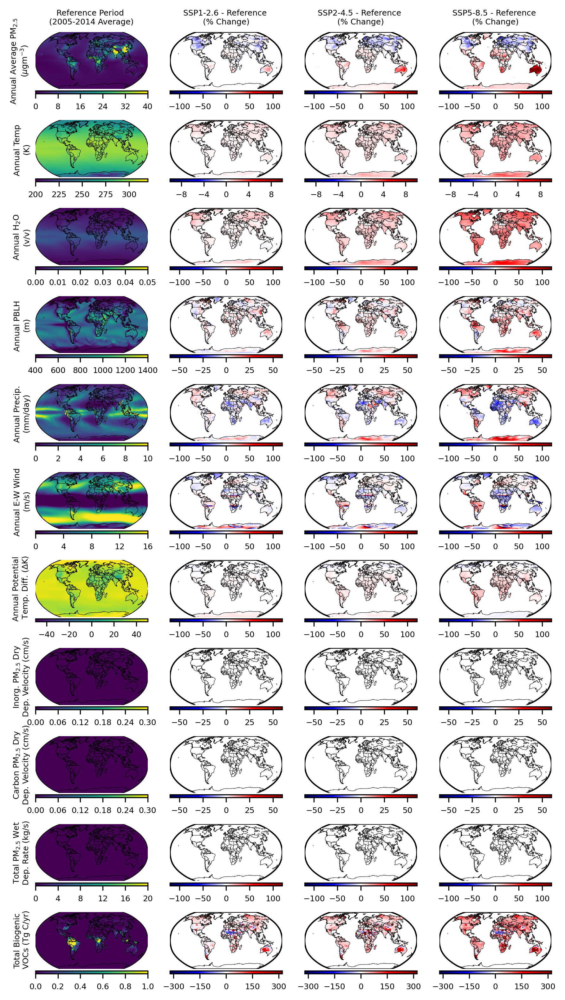

In [136]:
#GISS PM and Met (annual averages)

path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
list_of_files = ['/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.base.nc',
                 '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim126.2090s.nc',
                 '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim245.2090s.nc',
                 '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim585.2090s.nc',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.base.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim126.2090s.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim245.2090s.ymonmean.nc4',
                '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim585.2090s.ymonmean.nc4',
                '/GCAP2-GISS_Raw Data/HEMCO.E21.base.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim126.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim245.2090s.ymonmean_1.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim585.2090s.ymonmean_1.nc4'
                 ]
             
data = Dataset(path_iec+list_of_files[0])
base_pm_giss = data.variables['PM25'][0,0,:,:]
print(np.shape(base_pm_giss))

#the dry deposition velocities are the same for carbonaceous aerosol and for inorganic aerosol, so we can just plot the two different velocities 
#data = Dataset(path_iec+list_of_files[8])
inorg_drydep_base = np.zeros((144,90))#np.transpose(np.mean(data.variables['DryDepVel_SO4'][:,:,:],axis=0))
carbon_drydep_base = np.zeros((144,90))#np.transpose(np.mean(data.variables['DryDepVel_SOAS'][:,:,:],axis=0))
wetdep_pm_base = np.zeros((144,90))#np.transpose(wetconv+wetls)


#State Met files
data = Dataset(path_iec+list_of_files[4])

TS = data.variables['Met_TS']
TS_base = np.ma.getdata(np.transpose(np.mean(TS[:,:,:], axis = 0)))

TropLevel = data.variables['Met_TropLev'] #global average trop level is 23 (can make more specific mask later)
Wind = data.variables['Met_U']
#print(np.shape(Wind))
Wind_base = np.ma.getdata(np.transpose(np.mean(Wind[:,0:20,:,:], axis = (0,1))))

PBLH = data.variables['Met_PBLH']
PBLH_base = np.ma.getdata(np.transpose(np.mean(PBLH[:,:,:], axis = 0)))

Precip = data.variables['Met_PRECTOT']
Precip_base = np.ma.getdata(np.transpose(np.mean(Precip[:,:,:], axis = 0)))

H2O = data.variables['Met_AVGW']
H2O_base = np.ma.getdata(np.transpose(np.mean(H2O[:,0:20,:,:], axis = (0,1))))

#get the difference of potential temperature in the troposphere as an indicator of stagnation
Theta = data.variables['Met_THETA']
Theta_base = np.ma.getdata(np.transpose(np.mean(Theta[:,17,:,:], axis = 0)))-np.ma.getdata(np.transpose(np.mean(Theta[:,0,:,:], axis = 0)))

#BVOC emissions
data = Dataset(path_iec+list_of_files[8])
AREA = np.ma.getdata(np.transpose(data.variables['AREA'])) #m2

#Biogenic VOCs
list_bvocs = ['EmisACET_Biogenic','EmisALD2_Biogenic','EmisEOH_Biogenic',
              'EmisLIMO_Biogenic','EmisISOP_Biogenic','EmisMTPA_Biogenic',
              'EmisMTPO_Biogenic','EmisPRPE_Biogenic','EmisSOAP_Biogenic','EmisSOAS_Biogenic']#,'EmisC2H4_Biogenic','EmisMOH_Biogenic',
             # 'InvMEGAN_ACET_DIRECT','InvMEGAN_APIN','InvMEGAN_BPIN','InvMEGAN_SABI',
             # 'InvMEGAN_MYRC','InvMEGAN_CARE','InvMEGAN_OCIM','InvMEGAN_OMON',
              #'InvMEGAN_FARN','InvMEGAN_OSQT','InvMEGAN_MBOX','InvMEGAN_FAXX','InvMEGAN_AAXX']
emis_bio_base= np.zeros((144,90))
for ivoc in list_bvocs:
    if 'ACET' in ivoc:
        cfactor = (3*12)/58.09
    elif 'ALD2' in ivoc:
        cfactor = (2*12)/44.06
    elif 'C2H4' in ivoc:
        cfactor = (2*12)/28.05
    elif 'EOH' in ivoc:
        cfactor = (2*12)/46.07
    elif ('LIMO' in ivoc) or ('MTPA' in ivoc) or ('MTPO' in ivoc) or ('APIN' in ivoc) or \
    ('BPIN' in ivoc) or ('SABI' in ivoc) or ('MYRC' in ivoc) or ('CARE' in ivoc) or \
    ('OCIM' in ivoc) or ('OMON' in ivoc):
        cfactor = (10*12)/136.26
    elif 'ISOP' in ivoc:
        cfactor =  (5*12)/68.13
    elif 'MOH' in ivoc:
        cfactor = (1*12)/32.05
    elif 'PRPE' in ivoc:
        cfactor = (3*12)/42.09
    elif 'SOAP' in ivoc:
        cfactor = (12*12)/150
    elif 'SOAS' in ivoc:
        cfactor = (12*12)/150
    #print(cfactor)
    emis_bio_base += 1e-9*s_per_year*cfactor*AREA*np.ma.getdata(np.transpose(np.sum(data.variables[ivoc][:,:,:],axis=0)))


numplts=44
# w x H
fig = plt.figure(dpi=300,figsize=(7,13))

for iplt in np.arange(0,numplts):
    ax = fig.add_subplot(11,4,iplt+1)
    m = Basemap(projection='robin',lon_0=0,resolution='c')
    m.drawmapboundary(fill_color='White')
    m.drawcoastlines(linewidth=0.25,zorder=3)
    m.drawcountries(linewidth=0.25,zorder=3)
    xpi25,ypi2 = m(xp25,yp2)
    xpi,ypi = m(xp,yp)

    #data = Dataset(path_iec+list_of_files[iplt])

    if ((iplt == 0)):
        data = np.transpose(base_pm_giss)
        plot = m.pcolor(xpi,ypi,data, vmin=0, vmax=40, snap=True,zorder=2)
    elif ((iplt == 1) or (iplt == 2) or (iplt == 3)):
        data = Dataset(path_iec+list_of_files[iplt])
        data = 100*(data.variables['PM25'][0,0,:,:] - base_pm_giss)/base_pm_giss
        print(np.shape(landmask2d), np.shape(data))
        data = np.ma.array(data,mask =~np.transpose(landmask2d))
        print('Average change PM$_2.5$: ',+np.mean(data))
        plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==4)):
        plot = m.pcolor(xpi25,ypi2,TS_base, vmin=200, vmax=320, snap=True,zorder=2)
    elif ((iplt >= 5) and (iplt <8)):
        data = Dataset(path_iec+list_of_files[iplt])
        TS = data.variables['Met_TS']
        TS_annual = np.ma.getdata(np.transpose(np.mean(TS[:,:,:], axis = 0)))
        TS_annual = 100*(TS_annual - TS_base)/TS_base
        data = np.ma.array(TS_annual,mask =~landmask2x25)
        print('Average change Temp: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==8)):
        plot = m.pcolor(xpi25,ypi2,H2O_base, vmin=0, vmax=0.05, snap=True,zorder=2)
    elif ((iplt >= 9) and (iplt < 12)):
        #print(list_of_files[iplt-4])
        data = Dataset(path_iec+list_of_files[iplt-4])
        H2O = data.variables['Met_AVGW']
        H2O_annual = np.ma.getdata(np.transpose(np.mean(H2O[:,0:20,:,:], axis = (0,1))))
        H2O_annual = 100*(H2O_annual - H2O_base)/H2O_base
        data = np.ma.array(H2O_annual,mask =~landmask2x25)
        print('Average change H2O: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==12)):
        plot = m.pcolor(xpi25,ypi2,PBLH_base, vmin=400, vmax=1400, snap=True,zorder=2)
    elif ((iplt >= 13) and (iplt < 16)):
        #print(list_of_files[iplt-8])
        data = Dataset(path_iec+list_of_files[iplt-8])
        PBLH = data.variables['Met_PBLH']
        PBLH_annual = np.ma.getdata(np.transpose(np.mean(PBLH[:,:,:], axis = 0)))
        PBLH_annual = 100*(PBLH_annual - PBLH_base)/PBLH_base
        data = np.ma.array(PBLH_annual,mask =~landmask2x25)
        print('Average change PBLH: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt ==16):
        plot = m.pcolor(xpi25,ypi2,Precip_base, vmin=0, vmax=10, snap=True,zorder=2)
    elif ((iplt >= 17) and (iplt < 20)):
        #print(list_of_files[iplt-12])
        data = Dataset(path_iec+list_of_files[iplt-12])
        Precip = data.variables['Met_PRECTOT']
        Precip_annual = np.ma.getdata(np.transpose(np.mean(Precip[:,:,:], axis = 0)))
        Precip_annual = 100*(Precip_annual - Precip_base)/Precip_base
        data = np.ma.array(Precip_annual,mask =~landmask2x25)
        print('Average change Precip: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt ==20):
        plot = m.pcolor(xpi25,ypi2,Wind_base, vmin=0, vmax=16, snap=True,zorder=2)
    elif ((iplt >= 21) and (iplt < 24)):
        #print(list_of_files[iplt-16])
        data = Dataset(path_iec+list_of_files[iplt-16])
        Wind = data.variables['Met_U']
        Wind_annual = np.ma.getdata(np.transpose(np.mean(Wind[:,0:20,:,:], axis = (0,1))))
        Wind_annual = 100*(Wind_annual - Wind_base)/Wind_base
        data = np.ma.array(Wind_annual,mask =~landmask2x25)
        print('Average change Wind: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==24):
        plot = m.pcolor(xpi25,ypi2,Theta_base, vmin=-50, vmax=50, snap=True,zorder=2)
    elif ((iplt >= 25) and (iplt < 28)):
        data = Dataset(path_iec+list_of_files[iplt-20])
        theta = data.variables['Met_THETA']
        theta_annual_ = np.ma.getdata(np.transpose(np.mean(theta[:,17,:,:], axis = 0)))-np.ma.getdata(np.transpose(np.mean(theta[:,0,:,:], axis = 0)))
        theta_annual_ = 100*(theta_annual_ - Theta_base)/Theta_base
        data = np.ma.array(theta_annual_,mask =~landmask2x25)
        print('Average change Theta: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==28):
        plot = m.pcolor(xpi25,ypi2,inorg_drydep_base, vmin=0, vmax=0.3, snap=True,zorder=2)
    elif ((iplt >= 29) and (iplt < 32)):
        #print(list_of_files[iplt-16])
        #data = Dataset(path_iec+list_of_files[iplt-20])
        #inorg_drydep_annual = np.transpose(np.mean(data.variables['DryDepVel_SO4'][:,:,:],axis=0))
        #inorg_drydep_annual = 100*(inorg_drydep_annual - inorg_drydep_base)/inorg_drydep_base
        inorg_drydep_annual = np.zeros((144,90))
        data = np.ma.array(inorg_drydep_annual,mask =~landmask2x25)
        print('Average change Inorg Dry Dep: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==32):
        plot = m.pcolor(xpi25,ypi2,carbon_drydep_base, vmin=0, vmax=0.3, snap=True,zorder=2)
    elif ((iplt >= 33) and (iplt < 36)):
        #data = Dataset(path_iec+list_of_files[iplt-24])
        #carbon_drydep_annual = np.transpose(np.mean(data.variables['DryDepVel_SOAS'][:,:,:],axis=0))
        #carbon_drydep_annual = 100*(carbon_drydep_annual - carbon_drydep_base)/carbon_drydep_base
        carbon_drydep_annual = np.zeros((144,90))
        data = np.ma.array(carbon_drydep_annual,mask =~landmask2x25)
        print('Average Change Carbon Dry Dep: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==36):
        plot = m.pcolor(xpi25,ypi2,wetdep_pm_base, vmin=0, vmax=20, snap=True,zorder=2)
    elif ((iplt >= 37) and (iplt < 40)):
        wetdep_pm_annual = np.zeros((144,90))
        data = np.ma.array(wetdep_pm_annual,mask =~landmask2x25)
        print('Total Change PM Wet Dep: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==40):
        bvoc = emis_bio_base
        plot = m.pcolor(xpi25,ypi2,bvoc, vmin=0, vmax=1, snap=True,zorder=2)
    elif (iplt >= 41) or (iplt < 44):
        emis_bio= np.zeros((144,90))
        data = Dataset(path_iec+list_of_files[iplt-32])
        for ivoc in list_bvocs:
            if 'ACET' in ivoc:
                cfactor = (3*12)/58.09
            elif 'ALD2' in ivoc:
                cfactor = (2*12)/44.06
            elif 'C2H4' in ivoc:
                cfactor = (2*12)/28.05
            elif 'EOH' in ivoc:
                cfactor = (2*12)/46.07
            elif ('LIMO' in ivoc) or ('MTPA' in ivoc) or ('MTPO' in ivoc) or ('APIN' in ivoc) or \
            ('BPIN' in ivoc) or ('SABI' in ivoc) or ('MYRC' in ivoc) or ('CARE' in ivoc) or \
            ('OCIM' in ivoc) or ('OMON' in ivoc):
                cfactor = (10*12)/136.26
            elif 'ISOP' in ivoc:
                cfactor =  (5*12)/68.13
            elif 'MOH' in ivoc:
                cfactor = (1*12)/32.05
            elif 'PRPE' in ivoc:
                cfactor = (3*12)/42.09
            elif 'SOAP' in ivoc:
                cfactor = (12*12)/150
            elif 'SOAS' in ivoc:
                cfactor = (12*12)/150
            #print(cfactor)
            emis_bio += 1e-9*s_per_year*cfactor*AREA*np.ma.getdata(np.transpose(np.sum(data.variables[ivoc][:,:,:],axis=0)))
        bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
        bvoc[bvoc == np.inf] = np.nan
        data = np.ma.array(bvoc,mask =~landmask2x25)
        print('BVOCs: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')

    if ((iplt ==0)):
        ax.set_title('Reference Period \n(2005-2014 Average)',fontsize=6)
    elif iplt ==1:
        ax.set_title('SSP1-2.6 - Reference \n(% Change)',fontsize=6)
    elif iplt ==2:
        ax.set_title('SSP2-4.5 - Reference \n(% Change)',fontsize=6)
    elif iplt ==3:
        ax.set_title('SSP5-8.5 - Reference \n(% Change)',fontsize=6)

    cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
    tick_locator = ticker.MaxNLocator(nbins=5)
    cb.locator = tick_locator
    cb.update_ticks()
    cb.ax.tick_params(labelsize=6)
    if iplt ==0:
        plt.ylabel('Annual Average PM$_{2.5}$ \n($\\mu$gm$^{-3}$)',fontsize=6)
    elif iplt ==4:
        plt.ylabel('Annual Temp \n(K)',fontsize=6)
    elif iplt ==8:
        plt.ylabel('Annual H$_2$O \n(v/v)',fontsize=6)
    elif iplt ==12:
        plt.ylabel('Annual PBLH \n(m)',fontsize=6)   
    elif iplt ==16:
        plt.ylabel('Annual Precip. \n(mm/day)',fontsize=6)
    elif iplt ==20:
        plt.ylabel('Annual E-W Wind \n(m/s)',fontsize=6)
    elif iplt ==28:
        plt.ylabel('Inorg. PM$_{2.5}$ Dry \nDep. Velocity (cm/s)',fontsize=6)
    elif iplt ==24:
        plt.ylabel('Annual Potential\n Temp. Diff. ($\Delta$K)',fontsize=6)
    elif iplt ==32:
        plt.ylabel('Carbon PM$_{2.5}$ Dry \nDep. Velocity (cm/s)',fontsize=6)
    elif iplt ==36:
        plt.ylabel('Total PM$_{2.5}$ Wet\nDep. Rate (kg/s)',fontsize=6)
    elif iplt ==40:
        plt.ylabel('Total Biogenic\n VOCs (Tg C/yr)',fontsize=6)

plt.savefig('FigureS5_annual_giss_pm25_maps.png', bbox_inches='tight')
plt.show();

# Figure S7 - Met supplemental figures for PM (GISS)

(360, 720)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:163: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,data, vmin=0, vmax=40, snap=True,zorder=2)


(720, 360) (360, 720)
Average change PM$_2.5$:  -2.27074904543338


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:170: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(720, 360) (360, 720)
Average change PM$_2.5$:  -1.2036661280661538


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:170: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(720, 360) (360, 720)
Average change PM$_2.5$:  4.300368315701937


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:170: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:172: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calc

Average change Temp:  0.7223055463660424


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:180: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Temp:  1.282223722334516


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:180: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Temp:  2.66432970276873


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:180: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:182: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell e

Average change H2O:  14.727642217310377


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:191: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change H2O:  23.68565139308981


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:191: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change H2O:  55.37440015704979


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:191: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:193: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

Average change PBLH:  2.765116042345277


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:202: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change PBLH:  4.122440670079107


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:202: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change PBLH:  8.122195279781293


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:202: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:204: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell e

Average change Precip:  nan


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:210: RuntimeWarning: invalid value encountered in divide
  Precip_annual = 100*(Precip_annual - Precip_base)/Precip_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:213: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Precip:  nan


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:210: RuntimeWarning: invalid value encountered in divide
  Precip_annual = 100*(Precip_annual - Precip_base)/Precip_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:213: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Precip:  nan


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:215: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,Wind_base, vmin=0, vmax=16, snap=True,zorder=2)


Average change Wind:  -22.967990198929733


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:224: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Wind:  -0.40883534583672637


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:224: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Wind:  28.965194567240577


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:224: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:226: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

Average change Theta:  0.024607648179385763


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:234: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Theta:  -0.6422862695948697


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:234: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Theta:  -1.381832756514658


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:234: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:236: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

Average change Inorg Dry Dep:  1.6218243541690902


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:244: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Inorg Dry Dep:  2.415094956956724


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:244: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average change Inorg Dry Dep:  3.991425881223825


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:244: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:246: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell e

Average Change Carbon Dry Dep:  1.690837


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:253: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average Change Carbon Dry Dep:  2.9709725


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:253: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Average Change Carbon Dry Dep:  4.31891


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:253: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:255: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell e

Total Change PM Wet Dep:  4.574796723821189


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:269: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Total Change PM Wet Dep:  7.151712923776719


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:269: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Total Change PM Wet Dep:  23.168550309198245


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:269: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:272: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell

BVOCs:  41.11158036669442


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:301: RuntimeWarning: invalid value encountered in divide
  bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:305: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


BVOCs:  58.74182237436175


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:301: RuntimeWarning: invalid value encountered in divide
  bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:305: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\3247494924.py:316: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


BVOCs:  162.92107841146608


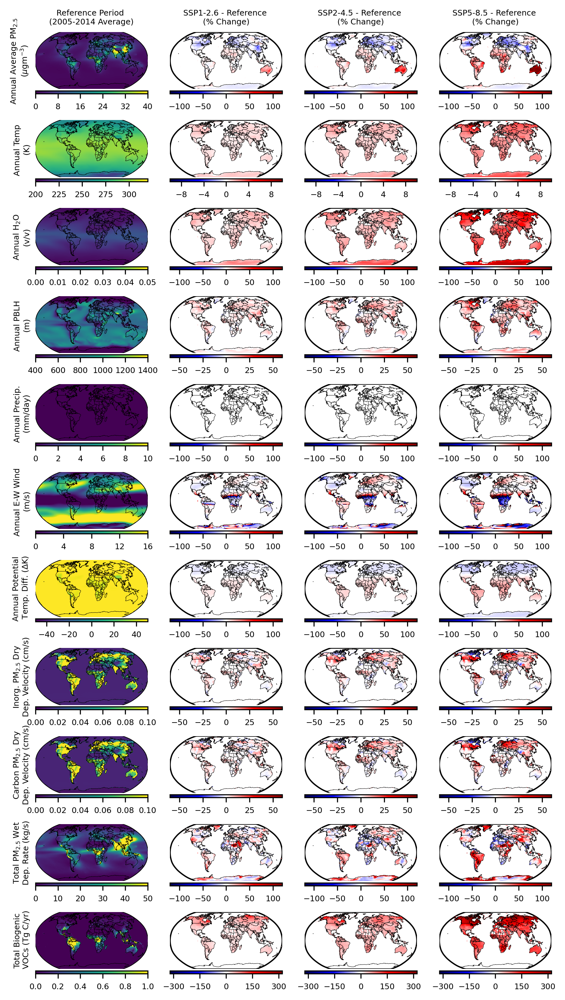

In [139]:
# CESM PM & Met (annual averages)

path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
list_of_files = ['/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.base.nc', 
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim126.2090s.nc', 
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim245.2090s.nc',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim585.2090s.nc', 
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.base.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim126.2090s.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim245.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim585.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.DryDep.base.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.DryDep.clim126.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.DryDep.clim245.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.DryDep.clim585.nc',
                '/GCAP2-CESM2_Raw Data/HEMCO.CESM2.base.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim126.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim245.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/HEMCO.CESM2.clim585.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.WetLossConv.base.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.WetLossConv.clim126.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.WetLossConv.clim245.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.WetLossConv.clim585.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.WetLossLS.base.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.WetLossLS.clim126.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.WetLossLS.clim245.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.WetLossLS.clim585.nc',
                '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.AerosolMass.base.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.AerosolMass.clim126.2090s.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.AerosolMass.clim245.2090s.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.AerosolMass.clim585.2090s.ymonmean.nc4']


data = Dataset(path_iec+list_of_files[0])
base_pm_cesm = data.variables['PM25'][0,0,:,:]
print(np.shape(base_pm_cesm))

#the dry deposition velocities are the same for carbonaceous aerosol and for inorganic aerosol, so we can just plot the two different velocities 
data = Dataset(path_iec+list_of_files[8])
inorg_drydep_base = np.transpose(np.mean(data.variables['DryDepVel_SO4'][:,:,:],axis=0))
carbon_drydep_base = np.transpose(np.mean(data.variables['DryDepVel_SOAS'][:,:,:],axis=0))


#List_wetconv = ['WetLossConv_NIT']
List_wetconv =['WetLossConv_SO4','WetLossConv_HMS','WetLossConv_NIT','WetLossConv_NH4','WetLossConv_OCPI',
                'WetLossConv_OCPO','WetLossConv_BCPI','WetLossConv_BCPO','WetLossConv_SOAS']
#List_wetls = ['WetLossLS_NIT']
List_wetls =['WetLossLS_SO4','WetLossLS_HMS','WetLossLS_NIT','WetLossLS_NH4','WetLossLS_OCPI',
                'WetLossLS_OCPO','WetLossLS_BCPI','WetLossLS_BCPO','WetLossLS_SOAS']

#wet deposition - in units of kg/s or percent loss (from convective updraft)
#add togeth LS and Conv mass loss (convective updrafts and large scale precipitation)
#inorganic species (and hydrophilic carbon aerosol) all lose the same fraction as each other
#hydrophobic BCPO has very different loss fraction than hydrophobic OCPO
# let's add the average rates across all the PM2/5 components (kg/s)
data_conv = Dataset(path_iec+list_of_files[16])
data_ls = Dataset(path_iec+list_of_files[20])
#data_mass = Dataset(path_iec+list_of_files[24])
wetconv = np.zeros((90,144))
wetls = np.zeros((90,144))
#wetmass = np.zeros((90,144))
for ispc in List_wetconv:
    #if 'NIT' in ispc:
    #    ispc_mass = 'AerMass_NIT'
    #temp /= np.mean(data_mass.variables[ispc_mass][:,:,:],axis=(0))
    wetconv += np.sum(data_conv.variables[ispc][:,:,:,:],axis=(0,1))
for ispc in List_wetls:
    wetls += np.sum(data_ls.variables[ispc][:,:,:,:],axis=(0,1))
wetdep_pm_base = np.transpose(wetconv+wetls)
#print(data)
#m = Basemap(projection='robin',lon_0=0,resolution='c')
#m.drawmapboundary(fill_color='White')
#m.drawcoastlines(linewidth=0.25,zorder=3)
#m.drawcountries(linewidth=0.25,zorder=3)
#xpi25,ypi2 = m(xp25,yp2)
#xpi,ypi = m(xp,yp)
#data = np.ma.array(wetdep_pm,mask =~landmask2x25)
##print('Average change Precip: ',+np.mean(data))
#plot = m.pcolor(xpi25,ypi2,data, vmin=0, vmax=50, snap=True,zorder=2)

#State Met files
data = Dataset(path_iec+list_of_files[4])

TS = data.variables['Met_TS']
TS_base = np.ma.getdata(np.transpose(np.mean(TS[:,:,:], axis = 0)))

TropLevel = data.variables['Met_TropLev'] #global average trop level is 23 (can make more specific mask later)
Wind = data.variables['Met_U']
#print(np.shape(Wind))
Wind_base = np.ma.getdata(np.transpose(np.mean(Wind[:,0:20,:,:], axis = (0,1))))

PBLH = data.variables['Met_PBLH']
PBLH_base = np.ma.getdata(np.transpose(np.mean(PBLH[:,:,:], axis = 0)))

Precip = data.variables['Met_PRECTOT']
Precip_base = np.ma.getdata(np.transpose(np.mean(Precip[:,:,:], axis = 0)))

H2O = data.variables['Met_AVGW']
H2O_base = np.ma.getdata(np.transpose(np.mean(H2O[:,0:20,:,:], axis = (0,1))))

#get the difference of potential temperature in the troposphere as an indicator of stagnation
Theta = data.variables['Met_THETA']
Theta_base = np.ma.getdata(np.transpose(np.mean(Theta[:,17,:,:], axis = 0)))-np.ma.getdata(np.transpose(np.mean(Theta[:,0,:,:], axis = 0)))

#BVOC emissions
data = Dataset(path_iec+list_of_files[12])
AREA = np.ma.getdata(np.transpose(data.variables['AREA'])) #m2

#Biogenic VOCs
list_bvocs = ['EmisACET_Biogenic','EmisALD2_Biogenic','EmisC2H4_Biogenic','EmisEOH_Biogenic',
              'EmisLIMO_Biogenic','EmisISOP_Biogenic','EmisMOH_Biogenic','EmisMTPA_Biogenic',
              'EmisMTPO_Biogenic','EmisPRPE_Biogenic','EmisSOAP_Biogenic','EmisSOAS_Biogenic']#,
             # 'InvMEGAN_ACET_DIRECT','InvMEGAN_APIN','InvMEGAN_BPIN','InvMEGAN_SABI',
             # 'InvMEGAN_MYRC','InvMEGAN_CARE','InvMEGAN_OCIM','InvMEGAN_OMON',
              #'InvMEGAN_FARN','InvMEGAN_OSQT','InvMEGAN_MBOX','InvMEGAN_FAXX','InvMEGAN_AAXX']
emis_bio_base= np.zeros((144,90))
for ivoc in list_bvocs:
    if 'ACET' in ivoc:
        cfactor = (3*12)/58.09
    elif 'ALD2' in ivoc:
        cfactor = (2*12)/44.06
    elif 'C2H4' in ivoc:
        cfactor = (2*12)/28.05
    elif 'EOH' in ivoc:
        cfactor = (2*12)/46.07
    elif ('LIMO' in ivoc) or ('MTPA' in ivoc) or ('MTPO' in ivoc) or ('APIN' in ivoc) or \
    ('BPIN' in ivoc) or ('SABI' in ivoc) or ('MYRC' in ivoc) or ('CARE' in ivoc) or \
    ('OCIM' in ivoc) or ('OMON' in ivoc):
        cfactor = (10*12)/136.26
    elif 'ISOP' in ivoc:
        cfactor =  (5*12)/68.13
    elif 'MOH' in ivoc:
        cfactor = (1*12)/32.05
    elif 'PRPE' in ivoc:
        cfactor = (3*12)/42.09
    elif 'SOAP' in ivoc:
        cfactor = (12*12)/150
    elif 'SOAS' in ivoc:
        cfactor = (12*12)/150
    #print(cfactor)
    emis_bio_base += 1e-9*s_per_year*cfactor*AREA*np.ma.getdata(np.transpose(np.sum(data.variables[ivoc][:,:,:],axis=0)))
    #print(ivoc+': '+str(np.sum(1e-9*s_per_year*cfactor*AREA*np.ma.getdata(np.transpose(data.variables[ivoc][0,:,:])))))
    #print(np.sum(emis_bio_base))


numplts=44
# w x H
fig = plt.figure(dpi=300,figsize=(7,13))

for iplt in np.arange(0,numplts):
    ax = fig.add_subplot(11,4,iplt+1)
    m = Basemap(projection='robin',lon_0=0,resolution='c')
    m.drawmapboundary(fill_color='White')
    m.drawcoastlines(linewidth=0.25,zorder=3)
    m.drawcountries(linewidth=0.25,zorder=3)
    xpi25,ypi2 = m(xp25,yp2)
    xpi,ypi = m(xp,yp)

    #data = Dataset(path_iec+list_of_files[iplt])

    if ((iplt == 0)):
        data = np.transpose(base_pm_cesm)
        plot = m.pcolor(xpi,ypi,data, vmin=0, vmax=40, snap=True,zorder=2)
    elif ((iplt == 1) or (iplt == 2) or (iplt == 3)):
        data = Dataset(path_iec+list_of_files[iplt])
        data = 100*(data.variables['PM25'][0,0,:,:] - base_pm_cesm)/base_pm_cesm
        print(np.shape(landmask2d), np.shape(data))
        data = np.ma.array(data,mask =~np.transpose(landmask2d))
        print('Average change PM$_2.5$: ',+np.mean(data))
        plot = m.pcolor(xpi,ypi,np.transpose(data), vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==4)):
        plot = m.pcolor(xpi25,ypi2,TS_base, vmin=200, vmax=320, snap=True,zorder=2)
    elif ((iplt >= 5) and (iplt <8)):
        data = Dataset(path_iec+list_of_files[iplt])
        TS = data.variables['Met_TS']
        TS_annual = np.ma.getdata(np.transpose(np.mean(TS[:,:,:], axis = 0)))
        TS_annual = 100*(TS_annual - TS_base)/TS_base
        data = np.ma.array(TS_annual,mask =~landmask2x25)
        print('Average change Temp: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-10, vmax=10, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==8)):
        plot = m.pcolor(xpi25,ypi2,H2O_base, vmin=0, vmax=0.05, snap=True,zorder=2)
    elif ((iplt >= 9) and (iplt < 12)):
        #print(list_of_files[iplt-4])
        data = Dataset(path_iec+list_of_files[iplt-4])
        H2O = data.variables['Met_AVGW']
        H2O_annual = np.ma.getdata(np.transpose(np.mean(H2O[:,0:20,:,:], axis = (0,1))))
        H2O_annual = 100*(H2O_annual - H2O_base)/H2O_base
        data = np.ma.array(H2O_annual,mask =~landmask2x25)
        print('Average change H2O: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==12)):
        plot = m.pcolor(xpi25,ypi2,PBLH_base, vmin=400, vmax=1400, snap=True,zorder=2)
    elif ((iplt >= 13) and (iplt < 16)):
        #print(list_of_files[iplt-8])
        data = Dataset(path_iec+list_of_files[iplt-8])
        PBLH = data.variables['Met_PBLH']
        PBLH_annual = np.ma.getdata(np.transpose(np.mean(PBLH[:,:,:], axis = 0)))
        PBLH_annual = 100*(PBLH_annual - PBLH_base)/PBLH_base
        data = np.ma.array(PBLH_annual,mask =~landmask2x25)
        print('Average change PBLH: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt ==16):
        plot = m.pcolor(xpi25,ypi2,Precip_base, vmin=0, vmax=10, snap=True,zorder=2)
    elif ((iplt >= 17) and (iplt < 20)):
        #print(list_of_files[iplt-12])
        data = Dataset(path_iec+list_of_files[iplt-12])
        Precip = data.variables['Met_PRECTOT']
        Precip_annual = np.ma.getdata(np.transpose(np.mean(Precip[:,:,:], axis = 0)))
        Precip_annual = 100*(Precip_annual - Precip_base)/Precip_base
        data = np.ma.array(Precip_annual,mask =~landmask2x25)
        print('Average change Precip: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt ==20):
        plot = m.pcolor(xpi25,ypi2,Wind_base, vmin=0, vmax=16, snap=True,zorder=2)
    elif ((iplt >= 21) and (iplt < 24)):
        #print(list_of_files[iplt-16])
        data = Dataset(path_iec+list_of_files[iplt-16])
        Wind = data.variables['Met_U']
        Wind_annual = np.ma.getdata(np.transpose(np.mean(Wind[:,0:20,:,:], axis = (0,1))))
        Wind_annual = 100*(Wind_annual - Wind_base)/Wind_base
        data = np.ma.array(Wind_annual,mask =~landmask2x25)
        print('Average change Wind: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==24):
        plot = m.pcolor(xpi25,ypi2,Theta_base, vmin=-50, vmax=50, snap=True,zorder=2)
    elif ((iplt >= 25) and (iplt < 28)):
        data = Dataset(path_iec+list_of_files[iplt-20])
        theta = data.variables['Met_THETA']
        theta_annual_ = np.ma.getdata(np.transpose(np.mean(theta[:,17,:,:], axis = 0)))-np.ma.getdata(np.transpose(np.mean(theta[:,0,:,:], axis = 0)))
        theta_annual_ = 100*(theta_annual_ - Theta_base)/Theta_base
        data = np.ma.array(theta_annual_,mask =~landmask2x25)
        print('Average change Theta: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==28):
        plot = m.pcolor(xpi25,ypi2,inorg_drydep_base, vmin=0, vmax=0.1, snap=True,zorder=2)
    elif ((iplt >= 29) and (iplt < 32)):
        #print(list_of_files[iplt-16])
        data = Dataset(path_iec+list_of_files[iplt-20])
        inorg_drydep_annual = np.transpose(np.mean(data.variables['DryDepVel_SO4'][:,:,:],axis=0))
        inorg_drydep_annual = 100*(inorg_drydep_annual - inorg_drydep_base)/inorg_drydep_base
        data = np.ma.array(inorg_drydep_annual,mask =~landmask2x25)
        print('Average change Inorg Dry Dep: ',+np.mean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==32):
        plot = m.pcolor(xpi25,ypi2,carbon_drydep_base, vmin=0, vmax=0.1, snap=True,zorder=2)
    elif ((iplt >= 33) and (iplt < 36)):
        data = Dataset(path_iec+list_of_files[iplt-24])
        carbon_drydep_annual = np.transpose(np.mean(data.variables['DryDepVel_SOAS'][:,:,:],axis=0))
        carbon_drydep_annual = 100*(carbon_drydep_annual - carbon_drydep_base)/carbon_drydep_base
        data = np.ma.array(carbon_drydep_annual,mask =~landmask2x25)
        print('Average Change Carbon Dry Dep: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-60, vmax=60, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==36):
        plot = m.pcolor(xpi25,ypi2,wetdep_pm_base, vmin=0, vmax=50, snap=True,zorder=2)
    elif ((iplt >= 37) and (iplt < 40)):
        data_conv = Dataset(path_iec+list_of_files[iplt-20])
        data_ls = Dataset(path_iec+list_of_files[iplt-16])
        wetconv = np.zeros((90,144))
        wetls = np.zeros((90,144))
        for ispc in List_wetconv:
            wetconv += np.sum(data_conv.variables[ispc][:,:,:,:],axis=(0,1))
        for ispc in List_wetls:
            wetls += np.sum(data_ls.variables[ispc][:,:,:,:],axis=(0,1))
        wetdep_pm_annual = np.transpose(wetconv+wetls)
        wetdep_pm_annual = 100*(wetdep_pm_annual - wetdep_pm_base)/wetdep_pm_base
        data = np.ma.array(wetdep_pm_annual,mask =~landmask2x25)
        print('Total Change PM Wet Dep: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif (iplt==40):
        bvoc = emis_bio_base
        plot = m.pcolor(xpi25,ypi2,bvoc, vmin=0, vmax=1, snap=True,zorder=2)
    elif (iplt >= 41) or (iplt < 44):
        emis_bio= np.zeros((144,90))
        data = Dataset(path_iec+list_of_files[iplt-28])
        for ivoc in list_bvocs:
            if 'ACET' in ivoc:
                cfactor = (3*12)/58.09
            elif 'ALD2' in ivoc:
                cfactor = (2*12)/44.06
            elif 'C2H4' in ivoc:
                cfactor = (2*12)/28.05
            elif 'EOH' in ivoc:
                cfactor = (2*12)/46.07
            elif ('LIMO' in ivoc) or ('MTPA' in ivoc) or ('MTPO' in ivoc) or ('APIN' in ivoc) or \
            ('BPIN' in ivoc) or ('SABI' in ivoc) or ('MYRC' in ivoc) or ('CARE' in ivoc) or \
            ('OCIM' in ivoc) or ('OMON' in ivoc):
                cfactor = (10*12)/136.26
            elif 'ISOP' in ivoc:
                cfactor =  (5*12)/68.13
            elif 'MOH' in ivoc:
                cfactor = (1*12)/32.05
            elif 'PRPE' in ivoc:
                cfactor = (3*12)/42.09
            elif 'SOAP' in ivoc:
                cfactor = (12*12)/150
            elif 'SOAS' in ivoc:
                cfactor = (12*12)/150
            #print(cfactor)
            emis_bio += 1e-9*s_per_year*cfactor*AREA*np.ma.getdata(np.transpose(np.sum(data.variables[ivoc][:,:,:],axis=0)))
        bvoc = 100*(emis_bio-emis_bio_base)/emis_bio_base
        bvoc[bvoc == np.inf] = np.nan
        data = np.ma.array(bvoc,mask =~landmask2x25)
        print('BVOCs: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-320, vmax=320, snap=True,zorder=2, cmap = 'seismic')

    if ((iplt ==0)):
        ax.set_title('Reference Period \n(2005-2014 Average)',fontsize=6)
    elif iplt ==1:
        ax.set_title('SSP1-2.6 - Reference \n(% Change)',fontsize=6)
    elif iplt ==2:
        ax.set_title('SSP2-4.5 - Reference \n(% Change)',fontsize=6)
    elif iplt ==3:
        ax.set_title('SSP5-8.5 - Reference \n(% Change)',fontsize=6)

    cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
    tick_locator = ticker.MaxNLocator(nbins=5)
    cb.locator = tick_locator
    cb.update_ticks()
    cb.ax.tick_params(labelsize=6)
    if iplt ==0:
        plt.ylabel('Annual Average PM$_{2.5}$ \n($\\mu$gm$^{-3}$)',fontsize=6)
    elif iplt ==4:
        plt.ylabel('Annual Temp \n(K)',fontsize=6)
    elif iplt ==8:
        plt.ylabel('Annual H$_2$O \n(v/v)',fontsize=6)
    elif iplt ==12:
        plt.ylabel('Annual PBLH \n(m)',fontsize=6)   
    elif iplt ==16:
        plt.ylabel('Annual Precip. \n(mm/day)',fontsize=6)
    elif iplt ==20:
        plt.ylabel('Annual E-W Wind \n(m/s)',fontsize=6)
    elif iplt ==28:
        plt.ylabel('Inorg. PM$_{2.5}$ Dry \nDep. Velocity (cm/s)',fontsize=6)
    elif iplt ==24:
        plt.ylabel('Annual Potential\n Temp. Diff. ($\Delta$K)',fontsize=6)
    elif iplt ==32:
        plt.ylabel('Carbon PM$_{2.5}$ Dry \nDep. Velocity (cm/s)',fontsize=6)
    elif iplt ==36:
        plt.ylabel('Total PM$_{2.5}$ Wet\nDep. Rate (kg/s)',fontsize=6)
    elif iplt ==40:
        plt.ylabel('Total Biogenic\n VOCs (Tg C/yr)',fontsize=6)

plt.savefig('FigureS6_annual_cesm_pm25_maps.png', bbox_inches='tight')
plt.show();

# Figure S8 - PM speciated Supplemental Maps (GISS)

4.268440094280391
(360, 720)
(144, 90)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:87: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=0, vmax=60, snap=True,zorder=2)


(144, 90) (144, 90)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:102: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(144, 90) (144, 90)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:102: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(144, 90) (144, 90)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:102: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(144, 90) (144, 90) (144, 90)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:119: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,sulfate_base, vmin=0, vmax=30, snap=True,zorder=2)


sulfate + hms:  -5.63733585537704


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:145: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


sulfate + hms:  -8.21153668703001


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:145: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


sulfate + hms:  -12.065228549549323


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:145: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(144, 90) (12, 1, 90, 144) (144, 90)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:161: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,nitrate_base, vmin=0, vmax=30, snap=True,zorder=2)


nitrate:  -14.97604676418102


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:186: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


nitrate:  -25.761779340399517


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:186: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


nitrate:  -42.25768455888194


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:186: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(144, 90) (12, 1, 90, 144) (144, 90)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:202: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,ammonium_base, vmin=0, vmax=30, snap=True,zorder=2)


ammonium:  -7.440023289426827


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:227: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


ammonium:  -12.233722715286099


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:227: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


ammonium:  -20.078484834261033


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:227: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(144, 90) (12, 1, 90, 144) (144, 90)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:243: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,oa_base, vmin=0, vmax=30, snap=True,zorder=2)


Total OA:  -1.9312234301068556


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:268: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Total OA:  -0.2555501660609315


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:268: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


Total OA:  6.825647123246828


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:268: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


(144, 90) (12, 1, 90, 144) (144, 90)


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:284: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,bc_base, vmin=0, vmax=30, snap=True,zorder=2)


BC:  -6.095228389545233


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:309: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


BC:  -10.642338559794705


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:309: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


BC:  -17.653760529521257


C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:309: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
C:\Users\EMCDUF01\AppData\Local\Temp\ipykernel_10140\4142448414.py:325: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')


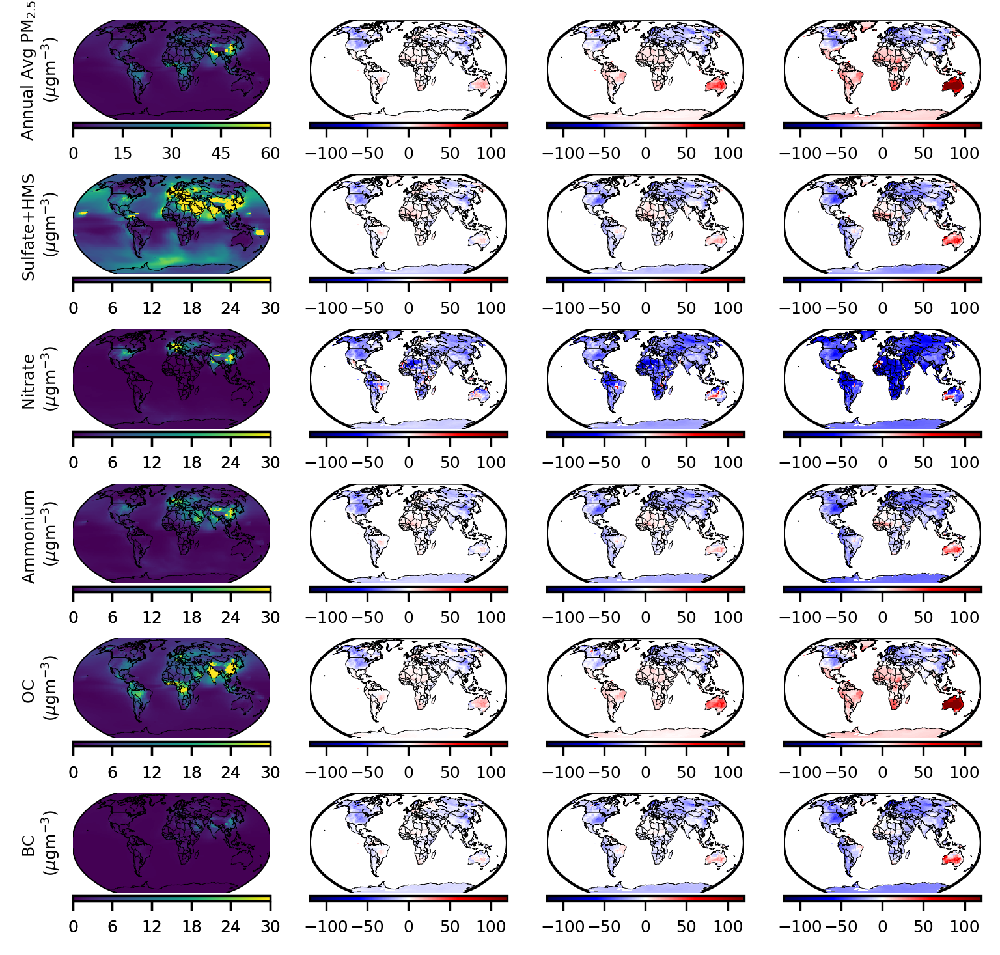

In [145]:
#GISS PM Speciated

#read in bias corrected PM
#read in speciated PM (if I want to calculate the total, I need to caluclate the fraction * total bias-corrected)
# or, calculate total mass from speciated components, but this won't work because we need to bias correct all the species

path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
list_of_files = ['/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.base.nc',
                 '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim126.2090s.nc',
                 '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim245.2090s.nc',
                 '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim585.2090s.nc',
                '/GCAP2-GISS_Raw Data/GEOSChem.E21.AerosolMass.base.ymonmean.nc4',
                '/GCAP2-GISS_Raw Data/GEOSChem.E21.AerosolMass.clim126.2090s.ymonmean.nc4',
                '/GCAP2-GISS_Raw Data/GEOSChem.E21.AerosolMass.clim245.2090s.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.AerosolMass.clim585.2090s.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.base.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim126.2090s.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim245.2090s.ymonmean.nc4',
                '/GCAP2-GISS_Raw Data/GEOSChem.E21.StateMet.clim585.2090s.ymonmean.nc4',
                '/GCAP2-GISS_Raw Data/HEMCO.E21.base.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim126.2090s.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim245.2090s.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/HEMCO.E21.clim585.2090s.ymonmean.nc4']

data = Dataset(path_iec+list_of_files[0])
#base_ozone_cesm = data.variables['MDA8'][0,0,:,:]
#data = Dataset(path_iec+list_of_files[1])
#base_ozone_giss = data.variables['corrected'][:,:]
#print(data)

pm25_base_cor = data.variables['PM25'][0,0,:,:]
print(np.mean(pm25_base_cor))

print(np.shape(pm25_base_cor))
region_mask = landmask2x25
NH_summer = [3,4,5,6,7,8] #np.arange(0,11) #
SH_summer = [0,1,2,9,10,11] #np.arange(0,11) #
avg_months = [0,1,2,3,4,5,6,7,8,9,10,11]

#re-grid the PM data to the 2x2.5 resolution of the speciated data (alternatively could have regridded the met data...)
data_pm = xr.open_dataset(path_iec+list_of_files[0])
data = Dataset(path_iec+list_of_files[4])
regrid_lat = data.variables['lat']
regrid_lon = data.variables['lon']
regridded_data = data_pm.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
base_pm_giss = regridded_data.variables['PM25'][0,0,:,:].transpose()
print(np.shape(base_pm_giss))
data_pm = xr.open_dataset(path_iec+list_of_files[1])
regridded_data = data_pm.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
ssp126_pm_giss = regridded_data.variables['PM25'][0,0,:,:].transpose()
data_pm = xr.open_dataset(path_iec+list_of_files[2])
regridded_data = data_pm.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
ssp245_pm_giss = regridded_data.variables['PM25'][0,0,:,:].transpose()
data_pm = xr.open_dataset(path_iec+list_of_files[3])
regridded_data = data_pm.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
ssp585_pm_giss = regridded_data.variables['PM25'][0,0,:,:].transpose()


numplts = 24

list_species = ['AerMassSO4','AerMassHMS','AerMassNIT','AerMassNH4','AerMassBC','TotalOA']


fig = plt.figure(dpi=300,figsize=(6,6))

for iplt in np.arange(0,numplts):
    ax = fig.add_subplot(6,4,iplt+1)
    #m = Basemap(projection='robin',lon_0=0,resolution='c')
    #m.drawmapboundary(fill_color='White')
    #m.drawcoastlines(linewidth=0.25,zorder=3)
    #m.drawcountries(linewidth=0.25,zorder=3)
    #xpi25,ypi2 = m(xp25,yp2)
    #xpi,ypi = m(xp,yp)

    #data = Dataset(path_iec+list_of_files[iplt])

    #if ((iplt <= 4) or (iplt == 8) or (iplt ==12) or (iplt==16) or (iplt==20) or (iplt==24)):
    m = Basemap(projection='robin',lon_0=0,resolution='c')
    m.drawmapboundary(fill_color='White')
    m.drawcoastlines(linewidth=0.25,zorder=3)
    m.drawcountries(linewidth=0.25,zorder=3)
    xpi25,ypi2 = m(xp25,yp2)
    xpi,ypi = m(xp,yp)
                             
    if ((iplt == 0)):
        data = base_pm_giss
        plot = m.pcolor(xpi25,ypi2,data, vmin=0, vmax=60, snap=True,zorder=2)
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)
    elif ((iplt == 1) or (iplt == 2) or (iplt == 3)):
        if iplt ==1:
            data = 100*(ssp126_pm_giss- base_pm_giss)/base_pm_giss
        elif iplt ==2:
            data = 100*(ssp245_pm_giss- base_pm_giss)/base_pm_giss
        elif iplt ==3:
            data = 100*(ssp585_pm_giss- base_pm_giss)/base_pm_giss
        print(np.shape(landmask2x25), np.shape(data))
        data = np.ma.array(data,mask =~landmask2x25)
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==4)): #sulfate + HMS
        data = Dataset(path_iec+list_of_files[iplt])
        sulfate = data.variables['AerMassSO4'] 
        hms = data.variables['AerMassHMS']
        sulfate_annual = np.ma.getdata(np.transpose(np.mean(sulfate[avg_months,0,:,:],axis=0))) +  np.ma.getdata(np.transpose(np.mean(hms[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        print(np.shape(tot_pm), np.shape(sulfate_annual), np.shape(base_pm_giss))
        sulfate_base = (sulfate_annual/tot_pm)*base_pm_giss
        plot = m.pcolor(xpi25,ypi2,sulfate_base, vmin=0, vmax=30, snap=True,zorder=2)
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)
    elif ((iplt >= 5) and (iplt <8)):
        data = Dataset(path_iec+list_of_files[iplt])
        sulfate = data.variables['AerMassSO4'] 
        hms = data.variables['AerMassHMS']
        sulfate_annual = np.ma.getdata(np.transpose(np.mean(sulfate[avg_months,0,:,:],axis=0))) +  np.ma.getdata(np.transpose(np.mean(hms[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        if iplt ==5: ssp_pm=ssp126_pm_giss 
        elif iplt==6: ssp_pm = ssp245_pm_giss 
        elif iplt==7: ssp_pm = ssp585_pm_giss
        sulfate_cor = 100*((sulfate_annual/tot_pm)*ssp_pm - sulfate_base)/sulfate_base
        data = np.ma.array(sulfate_cor,mask =~region_mask)
        print('sulfate + hms: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==8)): #nitrate
        data = Dataset(path_iec+list_of_files[iplt-4])
        nitrate = data.variables['AerMassNIT'] 
        nitrate_annual = np.ma.getdata(np.transpose(np.mean(nitrate[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        print(np.shape(tot_pm), np.shape(nitrate), np.shape(base_pm_giss))
        nitrate_base = (nitrate_annual/tot_pm)*base_pm_giss
        plot = m.pcolor(xpi25,ypi2,nitrate_base, vmin=0, vmax=30, snap=True,zorder=2)
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)
    elif ((iplt >= 9) and (iplt <12)):
        data = Dataset(path_iec+list_of_files[iplt-4])
        nitrate = data.variables['AerMassNIT'] 
        nitrate_annual = np.ma.getdata(np.transpose(np.mean(nitrate[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        if iplt ==9: ssp_pm=ssp126_pm_giss 
        elif iplt==10: ssp_pm = ssp245_pm_giss 
        elif iplt==11: ssp_pm = ssp585_pm_giss
        nitrate_cor = 100*((nitrate_annual/tot_pm)*ssp_pm - nitrate_base)/nitrate_base
        data = np.ma.array(nitrate_cor,mask =~region_mask)
        print('nitrate: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==12)): #ammonium
        data = Dataset(path_iec+list_of_files[iplt-8])
        ammonium = data.variables['AerMassNH4'] 
        ammonium_annual = np.ma.getdata(np.transpose(np.mean(ammonium[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        print(np.shape(tot_pm), np.shape(ammonium), np.shape(base_pm_giss))
        ammonium_base = (ammonium_annual/tot_pm)*base_pm_giss
        plot = m.pcolor(xpi25,ypi2,ammonium_base, vmin=0, vmax=30, snap=True,zorder=2)
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)
    elif ((iplt >= 13) and (iplt <16)):
        data = Dataset(path_iec+list_of_files[iplt-8])
        ammonium = data.variables['AerMassNH4'] 
        ammonium_annual = np.ma.getdata(np.transpose(np.mean(ammonium[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        if iplt ==13: ssp_pm=ssp126_pm_giss 
        elif iplt==14: ssp_pm = ssp245_pm_giss 
        elif iplt==15: ssp_pm = ssp585_pm_giss
        ammonium_cor = 100*((ammonium_annual/tot_pm)*ssp_pm - ammonium_base)/ammonium_base
        data = np.ma.array(ammonium_cor,mask =~region_mask)
        print('ammonium: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==16)): #OC
        data = Dataset(path_iec+list_of_files[iplt-12])
        oa = data.variables['TotalOA'] 
        oa_annual = np.ma.getdata(np.transpose(np.mean(oa[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        print(np.shape(tot_pm), np.shape(oa), np.shape(base_pm_giss))
        oa_base = (oa_annual/tot_pm)*base_pm_giss
        plot = m.pcolor(xpi25,ypi2,oa_base, vmin=0, vmax=30, snap=True,zorder=2)
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)
    elif ((iplt >= 17) and (iplt <20)):
        data = Dataset(path_iec+list_of_files[iplt-12])
        oa = data.variables['TotalOA'] 
        oa_annual = np.ma.getdata(np.transpose(np.mean(oa[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        if iplt ==17: ssp_pm=ssp126_pm_giss 
        elif iplt==18: ssp_pm = ssp245_pm_giss 
        elif iplt==19: ssp_pm = ssp585_pm_giss
        oa_cor = 100*((oa_annual/tot_pm)*ssp_pm - oa_base)/oa_base
        data = np.ma.array(oa_cor,mask =~region_mask)
        print('Total OA: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==20)): #BC
        data = Dataset(path_iec+list_of_files[iplt-16])
        bc = data.variables['AerMassBC'] 
        bc_annual = np.ma.getdata(np.transpose(np.mean(bc[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        print(np.shape(tot_pm), np.shape(bc), np.shape(base_pm_giss))
        bc_base = (bc_annual/tot_pm)*base_pm_giss
        plot = m.pcolor(xpi25,ypi2,bc_base, vmin=0, vmax=30, snap=True,zorder=2)
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)
    elif ((iplt >= 21) and (iplt <24)):
        data = Dataset(path_iec+list_of_files[iplt-16])
        bc = data.variables['AerMassBC'] 
        bc_annual = np.ma.getdata(np.transpose(np.mean(bc[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        if iplt ==21: ssp_pm=ssp126_pm_giss 
        elif iplt==22: ssp_pm = ssp245_pm_giss 
        elif iplt==23: ssp_pm = ssp585_pm_giss
        bc_cor = 100*((bc_annual/tot_pm)*ssp_pm - bc_base)/bc_base
        data = np.ma.array(bc_cor,mask =~region_mask)
        print('BC: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')

    if iplt ==0:
        plt.ylabel('Annual Avg PM$_{2.5}$ \n($\\mu$gm$^{-3}$)',fontsize=6)
    elif iplt ==4:
        plt.ylabel('Sulfate+HMS \n($\\mu$gm$^{-3}$)',fontsize=6)
    elif iplt ==8:
        plt.ylabel('Nitrate \n($\\mu$gm$^{-3}$)',fontsize=6)
    elif iplt ==12:
        plt.ylabel('Ammonium \n($\\mu$gm$^{-3}$)',fontsize=6)   
    elif iplt ==16:
        plt.ylabel('OC \n($\\mu$gm$^{-3}$)',fontsize=6)
    elif iplt ==20:
        plt.ylabel('BC \n($\\mu$gm$^{-3}$)',fontsize=6)

    if iplt >0:
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)

plt.savefig('FigureS8_giss_pm_species.png', bbox_inches='tight')
plt.show();

# Figure S9 - PM speciated Supplemental maps (CESM)

In [ ]:

# CESM PM Speciated
path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
list_of_files = ['/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.base.nc', 
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim126.2090s.nc', 
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim245.2090s.nc',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim585.2090s.nc', 
                '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.AerosolMass.base.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.AerosolMass.clim126.2090s.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.AerosolMass.clim245.2090s.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.AerosolMass.clim585.2090s.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.base.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim126.2090s.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim245.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.StateMet.clim585.2090s.ymonmean.nc4',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.DryDep.base.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.DryDep.clim126.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.DryDep.clim245.nc',
                '/GCAP2-CESM2_Raw Data/GC.CESM2.DryDep.clim585.nc',]


data = Dataset(path_iec+list_of_files[0])
#print(data)

pm25_base_cor = data.variables['PM25'][0,0,:,:]
#print(np.mean(pm25_base_cor))

print(np.shape(pm25_base_cor))
region_mask = landmask2x25
avg_months = [0,1,2,3,4,5,6,7,8,9,10,11]

#re-grid the PM data to the 2x2.5 resolution of the speciated data (alternatively could have regridded the met data...)
data_pm = xr.open_dataset(path_iec+list_of_files[0])
data = Dataset(path_iec+list_of_files[4])
regrid_lat = data.variables['lat']
regrid_lon = data.variables['lon']
regridded_data = data_pm.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
base_pm_cesm = regridded_data.variables['PM25'][0,0,:,:].transpose()
print(np.shape(base_pm_giss))
data_pm = xr.open_dataset(path_iec+list_of_files[1])
regridded_data = data_pm.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
ssp126_pm_cesm = regridded_data.variables['PM25'][0,0,:,:].transpose()
data_pm = xr.open_dataset(path_iec+list_of_files[2])
regridded_data = data_pm.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
ssp245_pm_cesm = regridded_data.variables['PM25'][0,0,:,:].transpose()
data_pm = xr.open_dataset(path_iec+list_of_files[3])
regridded_data = data_pm.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
ssp585_pm_cesm = regridded_data.variables['PM25'][0,0,:,:].transpose()


numplts = 24

list_species = ['AerMassSO4','AerMassHMS','AerMassNIT','AerMassNH4','AerMassBC','TotalOA']


fig = plt.figure(dpi=300,figsize=(6,6))

for iplt in np.arange(0,numplts):
    ax = fig.add_subplot(6,4,iplt+1)
    m = Basemap(projection='robin',lon_0=0,resolution='c')
    m.drawmapboundary(fill_color='White')
    m.drawcoastlines(linewidth=0.25,zorder=3)
    m.drawcountries(linewidth=0.25,zorder=3)
    xpi25,ypi2 = m(xp25,yp2)
    xpi,ypi = m(xp,yp)
                             
    if ((iplt == 0)):
        data = base_pm_cesm
        plot = m.pcolor(xpi25,ypi2,data, vmin=0, vmax=60, snap=True,zorder=2)
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)
    elif ((iplt == 1) or (iplt == 2) or (iplt == 3)):
        if iplt ==1:
            data = 100*(ssp126_pm_cesm- base_pm_cesm)/base_pm_cesm
        elif iplt ==2:
            data = 100*(ssp245_pm_cesm- base_pm_cesm)/base_pm_cesm
        elif iplt ==3:
            data = 100*(ssp585_pm_cesm- base_pm_cesm)/base_pm_cesm
        print(np.shape(landmask2x25), np.shape(data))
        data = np.ma.array(data,mask =~landmask2x25)
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==4)): #sulfate + HMS
        data = Dataset(path_iec+list_of_files[iplt])
        sulfate = data.variables['AerMassSO4'] 
        hms = data.variables['AerMassHMS']
        sulfate_annual = np.ma.getdata(np.transpose(np.mean(sulfate[avg_months,0,:,:],axis=0))) +  np.ma.getdata(np.transpose(np.mean(hms[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        print(np.shape(tot_pm), np.shape(sulfate_annual), np.shape(base_pm_cesm))
        sulfate_base = (sulfate_annual/tot_pm)*base_pm_cesm
        plot = m.pcolor(xpi25,ypi2,sulfate_base, vmin=0, vmax=30, snap=True,zorder=2)
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)
    elif ((iplt >= 5) and (iplt <8)):
        data = Dataset(path_iec+list_of_files[iplt])
        sulfate = data.variables['AerMassSO4'] 
        hms = data.variables['AerMassHMS']
        sulfate_annual = np.ma.getdata(np.transpose(np.mean(sulfate[avg_months,0,:,:],axis=0))) +  np.ma.getdata(np.transpose(np.mean(hms[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        if iplt ==5: ssp_pm=ssp126_pm_cesm 
        elif iplt==6: ssp_pm = ssp245_pm_cesm 
        elif iplt==7: ssp_pm = ssp585_pm_cesm
        sulfate_cor = 100*((sulfate_annual/tot_pm)*ssp_pm - sulfate_base)/sulfate_base
        data = np.ma.array(sulfate_cor,mask =~region_mask)
        print('sulfate + hms: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==8)): #nitrate
        data = Dataset(path_iec+list_of_files[iplt-4])
        nitrate = data.variables['AerMassNIT'] 
        nitrate_annual = np.ma.getdata(np.transpose(np.mean(nitrate[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        print(np.shape(tot_pm), np.shape(nitrate), np.shape(base_pm_cesm))
        nitrate_base = (nitrate_annual/tot_pm)*base_pm_cesm
        plot = m.pcolor(xpi25,ypi2,nitrate_base, vmin=0, vmax=30, snap=True,zorder=2)
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)
    elif ((iplt >= 9) and (iplt <12)):
        data = Dataset(path_iec+list_of_files[iplt-4])
        nitrate = data.variables['AerMassNIT'] 
        nitrate_annual = np.ma.getdata(np.transpose(np.mean(nitrate[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        if iplt ==9: ssp_pm=ssp126_pm_cesm 
        elif iplt==10: ssp_pm = ssp245_pm_cesm 
        elif iplt==11: ssp_pm = ssp585_pm_cesm
        nitrate_cor = 100*((nitrate_annual/tot_pm)*ssp_pm - nitrate_base)/nitrate_base
        data = np.ma.array(nitrate_cor,mask =~region_mask)
        print('nitrate: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==12)): #ammonium
        data = Dataset(path_iec+list_of_files[iplt-8])
        ammonium = data.variables['AerMassNH4'] 
        ammonium_annual = np.ma.getdata(np.transpose(np.mean(ammonium[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        print(np.shape(tot_pm), np.shape(ammonium), np.shape(base_pm_cesm))
        ammonium_base = (ammonium_annual/tot_pm)*base_pm_cesm
        plot = m.pcolor(xpi25,ypi2,ammonium_base, vmin=0, vmax=30, snap=True,zorder=2)
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)
    elif ((iplt >= 13) and (iplt <16)):
        data = Dataset(path_iec+list_of_files[iplt-8])
        ammonium = data.variables['AerMassNH4'] 
        ammonium_annual = np.ma.getdata(np.transpose(np.mean(ammonium[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        if iplt ==13: ssp_pm=ssp126_pm_cesm 
        elif iplt==14: ssp_pm = ssp245_pm_cesm 
        elif iplt==15: ssp_pm = ssp585_pm_cesm
        ammonium_cor = 100*((ammonium_annual/tot_pm)*ssp_pm - ammonium_base)/ammonium_base
        data = np.ma.array(ammonium_cor,mask =~region_mask)
        print('ammonium: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==16)): #OC
        data = Dataset(path_iec+list_of_files[iplt-12])
        oa = data.variables['TotalOA'] 
        oa_annual = np.ma.getdata(np.transpose(np.mean(oa[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        print(np.shape(tot_pm), np.shape(oa), np.shape(base_pm_cesm))
        oa_base = (oa_annual/tot_pm)*base_pm_cesm
        plot = m.pcolor(xpi25,ypi2,oa_base, vmin=0, vmax=30, snap=True,zorder=2)
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)
    elif ((iplt >= 17) and (iplt <20)):
        data = Dataset(path_iec+list_of_files[iplt-12])
        oa = data.variables['TotalOA'] 
        oa_annual = np.ma.getdata(np.transpose(np.mean(oa[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        if iplt ==17: ssp_pm=ssp126_pm_cesm
        elif iplt==18: ssp_pm = ssp245_pm_cesm 
        elif iplt==19: ssp_pm = ssp585_pm_cesm
        oa_cor = 100*((oa_annual/tot_pm)*ssp_pm - oa_base)/oa_base
        data = np.ma.array(oa_cor,mask =~region_mask)
        print('Total OA: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')
    elif ((iplt ==20)): #BC
        data = Dataset(path_iec+list_of_files[iplt-16])
        bc = data.variables['AerMassBC'] 
        bc_annual = np.ma.getdata(np.transpose(np.mean(bc[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        print(np.shape(tot_pm), np.shape(bc), np.shape(base_pm_cesm))
        bc_base = (bc_annual/tot_pm)*base_pm_cesm
        plot = m.pcolor(xpi25,ypi2,bc_base, vmin=0, vmax=30, snap=True,zorder=2)
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)
    elif ((iplt >= 21) and (iplt <24)):
        data = Dataset(path_iec+list_of_files[iplt-16])
        bc = data.variables['AerMassBC'] 
        bc_annual = np.ma.getdata(np.transpose(np.mean(bc[avg_months,0,:,:],axis=0)))
        for ispc in list_species:
            tot_pm = np.zeros((144,90))
            temp = data.variables[ispc]
        if ('SO4' in ispc) or ('NIT' in ispc) or ('NH4' in ispc) or ('HMS' in ispc):
            tot_pm += 1.1* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        elif 'OA' in ispc:
            tot_pm += 1.05* np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        else:
            tot_pm += np.ma.getdata(np.transpose(np.mean(temp[avg_months,0,:,:],axis=0)))
        if iplt ==21: ssp_pm=ssp126_pm_cesm
        elif iplt==22: ssp_pm = ssp245_pm_cesm 
        elif iplt==23: ssp_pm = ssp585_pm_cesm
        bc_cor = 100*((bc_annual/tot_pm)*ssp_pm - bc_base)/bc_base
        data = np.ma.array(bc_cor,mask =~region_mask)
        print('BC: ',+np.nanmean(data))
        plot = m.pcolor(xpi25,ypi2,data, vmin=-120, vmax=120, snap=True,zorder=2, cmap = 'seismic')

    if iplt ==0:
        plt.ylabel('Annual Avg PM$_{2.5}$ \n($\\mu$gm$^{-3}$)',fontsize=6)
    elif iplt ==4:
        plt.ylabel('Sulfate+HMS \n($\\mu$gm$^{-3}$)',fontsize=6)
    elif iplt ==8:
        plt.ylabel('Nitrate \n($\\mu$gm$^{-3}$)',fontsize=6)
    elif iplt ==12:
        plt.ylabel('Ammonium \n($\\mu$gm$^{-3}$)',fontsize=6)   
    elif iplt ==16:
        plt.ylabel('OC \n($\\mu$gm$^{-3}$)',fontsize=6)
    elif iplt ==20:
        plt.ylabel('BC \n($\\mu$gm$^{-3}$)',fontsize=6)

    if iplt >0:
        cb = m.colorbar(plot, location = "bottom", pad = "3%",size='5%')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.tick_params(labelsize=6)
plt.savefig('FigureS9_cesm_pm_species.png', bbox_inches='tight')
plt.show();

# Figure S10 - Population weighted species bar chart

In [12]:
#GISS PM Speciated - bar chart

#read in bias corrected PM
#read in speciated PM (if I want to calculate the total, I need to caluclate the fraction * total bias-corrected)
# or, calculate total mass from speciated components, but this won't work because we need to bias correct all the species

path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
list_of_files = ['/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.base.nc',
                 '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim126.2090s.nc',
                 '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim245.2090s.nc',
                 '/GCAP2-GISS_Raw Data/PM/PM25.noDSTnoSSA.clim585.2090s.nc',
                '/GCAP2-GISS_Raw Data/GEOSChem.E21.AerosolMass.base.ymonmean.nc4',
                '/GCAP2-GISS_Raw Data/GEOSChem.E21.AerosolMass.clim126.2090s.ymonmean.nc4',
                '/GCAP2-GISS_Raw Data/GEOSChem.E21.AerosolMass.clim245.2090s.ymonmean.nc4',
                 '/GCAP2-GISS_Raw Data/GEOSChem.E21.AerosolMass.clim585.2090s.ymonmean.nc4']

#read in the bias corrected PM2.5 deata from each scenario
data_pm = Dataset(path_iec+list_of_files[0])
regrid_lat = data_pm.variables['lat']
regrid_lon = data_pm.variables['lon']
pm25_cor_base = data.variables['PM25'][0,0,:,:]
pm25_cor_126 = data.variables['PM25'][0,0,:,:]
pm25_cor_245 = data.variables['PM25'][0,0,:,:]
pm25_cor_585 = data.variables['PM25'][0,0,:,:]
print(np.mean(pm25_cor_base))

print(np.shape(pm25_cor_base))
region_mask = landmask2x25
NH_summer = [3,4,5,6,7,8] #np.arange(0,11) #
SH_summer = [0,1,2,9,10,11] #np.arange(0,11) #
avg_months = [0,1,2,3,4,5,6,7,8,9,10,11]

#read in and re-grid the aerosol mass data to 0.5x0.5 resolution
data_mass_base = xr.open_dataset(path_iec+list_of_files[4])
data_mass_126 = xr.open_dataset(path_iec+list_of_files[5])
data_mass_245 = xr.open_dataset(path_iec+list_of_files[6])
data_mass_585 = xr.open_dataset(path_iec+list_of_files[7])


regridded_mass_base = data_mass_base.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
regridded_mass_126 = data_mass_126.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
regridded_mass_245 = data_mass_245.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
regridded_mass_585 = data_mass_585.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
#print(np.shape(regridded_mass_data.variables['AerMassSO4']))

4.268440094280391
(360, 720)


In [14]:
lat1 = regrid_lat = data_pm.variables['lon']
lat = regridded_mass_base.variables['lat_bnds'][:,0]
lon = regridded_mass_base.variables['lon_bnds'][:,0]+0.25 #need to shift to get the correct bounds with the population data
#print(lon[0:5], lat1[0:3])
#print(lat1[0:3], lats)

lons, lats = np.meshgrid(lon, lat)

#print((lats))
#print(np.shape(np.mean(regridded_mass_base.variables['AerMassSO4'][:,0,:,:], axis=0)))
points_base = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'TotalPM' : np.ma.getdata((1.1*np.mean(regridded_mass_base.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                                (1.1*np.mean(regridded_mass_base.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                    (1.1*np.mean(regridded_mass_base.variables['AerMassNIT'][:,0,:,:], axis=0))+\
                     (1.1*np.mean(regridded_mass_base.variables['AerMassNH4'][:,0,:,:], axis=0))+\
                    (1*np.mean(regridded_mass_base.variables['AerMassBC'][:,0,:,:], axis=0))+\
                     (1.05*np.mean(regridded_mass_base.variables['TotalOA'][:,0,:,:], axis=0))).flatten(),
        'SO4': np.ma.getdata(1.1*np.mean(regridded_mass_base.variables['AerMassSO4'][:,0,:,:], axis=0)).flatten(),
        'HMS': np.ma.getdata(1.1*np.mean(regridded_mass_base.variables['AerMassHMS'][:,0,:,:], axis=0)).flatten(),
        'NIT': np.ma.getdata(1.1*np.mean(regridded_mass_base.variables['AerMassNIT'][:,0,:,:], axis=0)).flatten(),
        'NH4': np.ma.getdata(1.1*np.mean(regridded_mass_base.variables['AerMassNH4'][:,0,:,:], axis=0)).flatten(),
        'BC': np.ma.getdata(np.mean(regridded_mass_base.variables['AerMassBC'][:,0,:,:], axis=0)).flatten(),
        'TotalOA': np.ma.getdata(1.05*np.mean(regridded_mass_base.variables['TotalOA'][:,0,:,:], axis=0)).flatten(),
        'PM_cor': pm25_cor_base.flatten()
})
#print(np.mean(points_base.loc[:,'TotalPM']))

points_126 = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'TotalPM' : np.ma.getdata((1.1*np.mean(regridded_mass_126.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                                (1.1*np.mean(regridded_mass_126.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                    (1.1*np.mean(regridded_mass_126.variables['AerMassNIT'][:,0,:,:], axis=0))+\
                     (1.1*np.mean(regridded_mass_126.variables['AerMassNH4'][:,0,:,:], axis=0))+\
                    (1*np.mean(regridded_mass_126.variables['AerMassBC'][:,0,:,:], axis=0))+\
                     (1.05*np.mean(regridded_mass_126.variables['TotalOA'][:,0,:,:], axis=0))).flatten(),
        'SO4': np.ma.getdata(1.1*np.mean(regridded_mass_126.variables['AerMassSO4'][:,0,:,:], axis=0)).flatten(),
        'HMS': np.ma.getdata(1.1*np.mean(regridded_mass_126.variables['AerMassHMS'][:,0,:,:], axis=0)).flatten(),
        'NIT': np.ma.getdata(1.1*np.mean(regridded_mass_126.variables['AerMassNIT'][:,0,:,:], axis=0)).flatten(),
        'NH4': np.ma.getdata(1.1*np.mean(regridded_mass_126.variables['AerMassNH4'][:,0,:,:], axis=0)).flatten(),
        'BC': np.ma.getdata(np.mean(regridded_mass_126.variables['AerMassBC'][:,0,:,:], axis=0)).flatten(),
        'TotalOA': np.ma.getdata(1.05*np.mean(regridded_mass_126.variables['TotalOA'][:,0,:,:], axis=0)).flatten(),
        'PM_cor': pm25_cor_126.flatten()
})

points_delta_126 = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'SO4': (points_126.loc[:,'SO4']/points_126.loc[:,'TotalPM'])*points_126.loc[:,'PM_cor']-\
               (points_base.loc[:,'SO4']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'HMS': (points_126.loc[:,'HMS']/points_126.loc[:,'TotalPM'])*points_126.loc[:,'PM_cor']-\
               (points_base.loc[:,'HMS']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'NIT': (points_126.loc[:,'NIT']/points_126.loc[:,'TotalPM'])*points_126.loc[:,'PM_cor']-\
               (points_base.loc[:,'NIT']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'NH4': (points_126.loc[:,'NH4']/points_126.loc[:,'TotalPM'])*points_126.loc[:,'PM_cor']-\
               (points_base.loc[:,'NH4']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'BC': (points_126.loc[:,'BC']/points_126.loc[:,'TotalPM'])*points_126.loc[:,'PM_cor']-\
               (points_base.loc[:,'BC']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'TotalOA': (points_126.loc[:,'TotalOA']/points_126.loc[:,'TotalPM'])*points_126.loc[:,'PM_cor']-\
               (points_base.loc[:,'TotalOA']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor']
})

points_245 = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'TotalPM' : np.ma.getdata((1.1*np.mean(regridded_mass_245.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                                (1.1*np.mean(regridded_mass_245.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                    (1.1*np.mean(regridded_mass_245.variables['AerMassNIT'][:,0,:,:], axis=0))+\
                     (1.1*np.mean(regridded_mass_245.variables['AerMassNH4'][:,0,:,:], axis=0))+\
                    (1*np.mean(regridded_mass_245.variables['AerMassBC'][:,0,:,:], axis=0))+\
                     (1.05*np.mean(regridded_mass_245.variables['TotalOA'][:,0,:,:], axis=0))).flatten(),
        'SO4': np.ma.getdata(1.1*np.mean(regridded_mass_245.variables['AerMassSO4'][:,0,:,:], axis=0)).flatten(),
        'HMS': np.ma.getdata(1.1*np.mean(regridded_mass_245.variables['AerMassHMS'][:,0,:,:], axis=0)).flatten(),
        'NIT': np.ma.getdata(1.1*np.mean(regridded_mass_245.variables['AerMassNIT'][:,0,:,:], axis=0)).flatten(),
        'NH4': np.ma.getdata(1.1*np.mean(regridded_mass_245.variables['AerMassNH4'][:,0,:,:], axis=0)).flatten(),
        'BC': np.ma.getdata(np.mean(regridded_mass_245.variables['AerMassBC'][:,0,:,:], axis=0)).flatten(),
        'TotalOA': np.ma.getdata(1.05*np.mean(regridded_mass_245.variables['TotalOA'][:,0,:,:], axis=0)).flatten(),
        'PM_cor': pm25_cor_245.flatten()
})

points_delta_245 = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'SO4': (points_245.loc[:,'SO4']/points_245.loc[:,'TotalPM'])*points_245.loc[:,'PM_cor']-\
               (points_base.loc[:,'SO4']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'HMS': (points_245.loc[:,'HMS']/points_245.loc[:,'TotalPM'])*points_245.loc[:,'PM_cor']-\
               (points_base.loc[:,'HMS']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'NIT': (points_245.loc[:,'NIT']/points_245.loc[:,'TotalPM'])*points_245.loc[:,'PM_cor']-\
               (points_base.loc[:,'NIT']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'NH4': (points_245.loc[:,'NH4']/points_245.loc[:,'TotalPM'])*points_245.loc[:,'PM_cor']-\
               (points_base.loc[:,'NH4']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'BC': (points_245.loc[:,'BC']/points_245.loc[:,'TotalPM'])*points_245.loc[:,'PM_cor']-\
               (points_base.loc[:,'BC']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'TotalOA': (points_245.loc[:,'TotalOA']/points_245.loc[:,'TotalPM'])*points_245.loc[:,'PM_cor']-\
               (points_base.loc[:,'TotalOA']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor']
})

points_585 = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'TotalPM' : np.ma.getdata((1.1*np.mean(regridded_mass_585.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                                (1.1*np.mean(regridded_mass_585.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                    (1.1*np.mean(regridded_mass_585.variables['AerMassNIT'][:,0,:,:], axis=0))+\
                     (1.1*np.mean(regridded_mass_585.variables['AerMassNH4'][:,0,:,:], axis=0))+\
                    (1*np.mean(regridded_mass_585.variables['AerMassBC'][:,0,:,:], axis=0))+\
                     (1.05*np.mean(regridded_mass_585.variables['TotalOA'][:,0,:,:], axis=0))).flatten(),
        'SO4': np.ma.getdata(1.1*np.mean(regridded_mass_585.variables['AerMassSO4'][:,0,:,:], axis=0)).flatten(),
        'HMS': np.ma.getdata(1.1*np.mean(regridded_mass_585.variables['AerMassHMS'][:,0,:,:], axis=0)).flatten(),
        'NIT': np.ma.getdata(1.1*np.mean(regridded_mass_585.variables['AerMassNIT'][:,0,:,:], axis=0)).flatten(),
        'NH4': np.ma.getdata(1.1*np.mean(regridded_mass_585.variables['AerMassNH4'][:,0,:,:], axis=0)).flatten(),
        'BC': np.ma.getdata(np.mean(regridded_mass_585.variables['AerMassBC'][:,0,:,:], axis=0)).flatten(),
        'TotalOA': np.ma.getdata(1.05*np.mean(regridded_mass_585.variables['TotalOA'][:,0,:,:], axis=0)).flatten(),
        'PM_cor': pm25_cor_585.flatten()
})

points_delta_585 = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'SO4': (points_585.loc[:,'SO4']/points_585.loc[:,'TotalPM'])*points_585.loc[:,'PM_cor']-\
               (points_base.loc[:,'SO4']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'HMS': (points_585.loc[:,'HMS']/points_585.loc[:,'TotalPM'])*points_585.loc[:,'PM_cor']-\
               (points_base.loc[:,'HMS']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'NIT': (points_585.loc[:,'NIT']/points_585.loc[:,'TotalPM'])*points_585.loc[:,'PM_cor']-\
               (points_base.loc[:,'NIT']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'NH4': (points_585.loc[:,'NH4']/points_585.loc[:,'TotalPM'])*points_585.loc[:,'PM_cor']-\
               (points_base.loc[:,'NH4']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'BC': (points_585.loc[:,'BC']/points_585.loc[:,'TotalPM'])*points_585.loc[:,'PM_cor']-\
               (points_base.loc[:,'BC']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'TotalOA': (points_585.loc[:,'TotalOA']/points_585.loc[:,'TotalPM'])*points_585.loc[:,'PM_cor']-\
               (points_base.loc[:,'TotalOA']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor']
})
print(np.mean(points_delta_126.loc[:,'SO4']))
full_data_join_126 = pd.merge(full_grid_join,points_delta_126,how='left', on=['Lat','Lon'])
full_data_join_126['PW_SO4'] = (np.sum((full_data_join_126.loc[:,'total_pop']*full_data_join_126.loc[:,'SO4']))/full_data_join_126.loc[:,'World_Pop'])+\
                            (np.sum((full_data_join_126.loc[:,'total_pop']*full_data_join_126.loc[:,'HMS']))/full_data_join_126.loc[:,'World_Pop'])
full_data_join_126['PW_NIT'] = np.sum((full_data_join_126.loc[:,'total_pop']*full_data_join_126.loc[:,'NIT']))/full_data_join_126.loc[:,'World_Pop']
full_data_join_126['PW_NH4'] = np.sum((full_data_join_126.loc[:,'total_pop']*full_data_join_126.loc[:,'NH4']))/full_data_join_126.loc[:,'World_Pop']
full_data_join_126['PW_BC'] = np.sum((full_data_join_126.loc[:,'total_pop']*full_data_join_126.loc[:,'BC']))/full_data_join_126.loc[:,'World_Pop']
full_data_join_126['PW_OA'] = np.sum((full_data_join_126.loc[:,'total_pop']*full_data_join_126.loc[:,'TotalOA']))/full_data_join_126.loc[:,'World_Pop']

full_data_join_245 = pd.merge(full_grid_join,points_delta_245,how='left', on=['Lat','Lon'])
full_data_join_245['PW_SO4'] = (np.sum((full_data_join_245.loc[:,'total_pop']*full_data_join_245.loc[:,'SO4']))/full_data_join_245.loc[:,'World_Pop'])+\
                            (np.sum((full_data_join_245.loc[:,'total_pop']*full_data_join_245.loc[:,'HMS']))/full_data_join_245.loc[:,'World_Pop'])
full_data_join_245['PW_NIT'] = np.sum((full_data_join_245.loc[:,'total_pop']*full_data_join_245.loc[:,'NIT']))/full_data_join_245.loc[:,'World_Pop']
full_data_join_245['PW_NH4'] = np.sum((full_data_join_245.loc[:,'total_pop']*full_data_join_245.loc[:,'NH4']))/full_data_join_245.loc[:,'World_Pop']
full_data_join_245['PW_BC'] = np.sum((full_data_join_245.loc[:,'total_pop']*full_data_join_245.loc[:,'BC']))/full_data_join_245.loc[:,'World_Pop']
full_data_join_245['PW_OA'] = np.sum((full_data_join_245.loc[:,'total_pop']*full_data_join_245.loc[:,'TotalOA']))/full_data_join_245.loc[:,'World_Pop']

full_data_join_585 = pd.merge(full_grid_join,points_delta_585,how='left', on=['Lat','Lon'])
full_data_join_585['PW_SO4'] = (np.sum((full_data_join_585.loc[:,'total_pop']*full_data_join_585.loc[:,'SO4']))/full_data_join_585.loc[:,'World_Pop'])+\
                            (np.sum((full_data_join_585.loc[:,'total_pop']*full_data_join_585.loc[:,'HMS']))/full_data_join_585.loc[:,'World_Pop'])
full_data_join_585['PW_NIT'] = np.sum((full_data_join_585.loc[:,'total_pop']*full_data_join_585.loc[:,'NIT']))/full_data_join_585.loc[:,'World_Pop']
full_data_join_585['PW_NH4'] = np.sum((full_data_join_585.loc[:,'total_pop']*full_data_join_585.loc[:,'NH4']))/full_data_join_585.loc[:,'World_Pop']
full_data_join_585['PW_BC'] = np.sum((full_data_join_585.loc[:,'total_pop']*full_data_join_585.loc[:,'BC']))/full_data_join_585.loc[:,'World_Pop']
full_data_join_585['PW_OA'] = np.sum((full_data_join_585.loc[:,'total_pop']*full_data_join_585.loc[:,'TotalOA']))/full_data_join_585.loc[:,'World_Pop']

#print(full_data_join)
##print((points_base))
#print(np.mean(points.loc[:,'Lon']))
#print(np.mean(full_data_join.loc[:,'PW_NIT']))

df = pd.DataFrame([['SSP1-2.6', 'GISS', full_data_join_126['PW_SO4'][0], full_data_join_126['PW_NIT'][0], full_data_join_126['PW_NH4'][0], full_data_join_126['PW_BC'][0], full_data_join_126['PW_OA'][0]], \
                   ['SSP2-4.5', 'GISS', full_data_join_245['PW_SO4'][0], full_data_join_245['PW_NIT'][0], full_data_join_245['PW_NH4'][0], full_data_join_245['PW_BC'][0], full_data_join_245['PW_OA'][0]], \
                   ['SSP5-8.5', 'GISS', full_data_join_585['PW_SO4'][0], full_data_join_585['PW_NIT'][0], full_data_join_585['PW_NH4'][0], full_data_join_585['PW_BC'][0], full_data_join_585['PW_OA'][0]]],
                  columns=['scenario', 'model', 'Sulfate+HMS', 'Nitrate', 'Ammonium', 'BC','Organics'])
print(df)

#fig = plt.figure(dpi=300,figsize=(7,6))
#ax1 = fig.add_subplot(1,2,1)
#df.plot(x='scenario', kind='bar', stacked=True,
#       color = ["#FF1919","#0000FF","#FFAA00","#000000","#3BB300"],
#       ax = ax1)
#plt.axhline(y=0, color='black', linestyle = '--')
#plt.ylim(-0.8, 0.8)
#plt.ylabel('$\\Delta$Concentration ($\\mu$g m$^{-3}$)')
#plt.xlabel('')
#ax1.set_xticklabels(df.loc[:,'scenario'],rotation=0)
#ax1.get_legend().remove()
#ax1.set_title('GISS',fontsize=8)

#ax2 = fig.add_subplot(1,2,2)
#df.plot(x='scenario', kind='bar', stacked=True,
#       color = ["#FF1919","#0000FF","#FFAA00","#000000","#3BB300"],
#       ax = ax2)
#plt.axhline(y=0, color='black', linestyle = '--')
#plt.ylim(-0.8, 0.8)
##plt.ylabel('$\\Delta$Concentration ($\\mu$g m$^{-3}$)')
#plt.xlabel('')
#ax2.set_xticklabels(df.loc[:,'scenario'],rotation=0)
#ax2.set_title('CESM',fontsize=8)
#plt.suptitle('Change in Population-Weighted Global Avgerage \nPM$_{2.5}$ Components, by Scenario ($\\mu$g m$^{-3}$)')
#plt.show()

0.011807086411418411
   scenario model  Sulfate+HMS   Nitrate  Ammonium        BC  Organics
0  SSP1-2.6  GISS     0.081958 -0.203158 -0.043774  0.003630  0.077024
1  SSP2-4.5  GISS     0.084352 -0.277538 -0.049200 -0.001456  0.145775
2  SSP5-8.5  GISS     0.156606 -0.567251 -0.119595 -0.009932  0.331848


In [16]:
#CESM PM Speciated

#now add cesm data to the bar chart

#read in bias corrected PM
#read in speciated PM (if I want to calculate the total, I need to caluclate the fraction * total bias-corrected)
# or, calculate total mass from speciated components, but this won't work because we need to bias correct all the species

path_iec = 'C:/Users/EMCDUF01/Industrial Economics, Inc/IEc EPA CSIB Share - IEc EPA CSIB Share/03_Global_AQ_Study/Data'
list_of_files = ['/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.base.nc', 
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim126.2090s.nc', 
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim245.2090s.nc',
                 '/GCAP2-CESM2_Raw Data/GCAP2-CESM2/PM25.noDSTnoSSA.clim585.2090s.nc', 
                '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.AerosolMass.base.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.AerosolMass.clim126.2090s.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.AerosolMass.clim245.2090s.ymonmean.nc4',
                 '/GCAP2-CESM2_Raw Data/GEOSChem.CESM2.AerosolMass.clim585.2090s.ymonmean.nc4']

#read in the bias corrected PM2.5 deata from each scenario
data_pm = Dataset(path_iec+list_of_files[0])
regrid_lat = data_pm.variables['lat']
regrid_lon = data_pm.variables['lon']
pm25_cor_base = data.variables['PM25'][0,0,:,:]
pm25_cor_126 = data.variables['PM25'][0,0,:,:]
pm25_cor_245 = data.variables['PM25'][0,0,:,:]
pm25_cor_585 = data.variables['PM25'][0,0,:,:]
#print(np.mean(pm25_base_cor))

#read in and re-grid the aerosol mass data to 0.5x0.5 resolution
data_mass_base = xr.open_dataset(path_iec+list_of_files[4])
data_mass_126 = xr.open_dataset(path_iec+list_of_files[5])
data_mass_245 = xr.open_dataset(path_iec+list_of_files[6])
data_mass_585 = xr.open_dataset(path_iec+list_of_files[7])

regridded_mass_base = data_mass_base.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
regridded_mass_126 = data_mass_126.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
regridded_mass_245 = data_mass_245.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
regridded_mass_585 = data_mass_585.interp(lat=regrid_lat,lon=regrid_lon,method ='linear')
#print(np.shape(regridded_mass_data.variables['AerMassSO4']))

lat1 = regrid_lat = data_pm.variables['lon']
lat = regridded_mass_base.variables['lat_bnds'][:,0]
lon = regridded_mass_base.variables['lon_bnds'][:,0]+0.25 #need to shift to get the correct bounds with the population data

lons, lats = np.meshgrid(lon, lat)

points_base = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'TotalPM' : np.ma.getdata((1.1*np.mean(regridded_mass_base.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                                (1.1*np.mean(regridded_mass_base.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                    (1.1*np.mean(regridded_mass_base.variables['AerMassNIT'][:,0,:,:], axis=0))+\
                     (1.1*np.mean(regridded_mass_base.variables['AerMassNH4'][:,0,:,:], axis=0))+\
                    (1*np.mean(regridded_mass_base.variables['AerMassBC'][:,0,:,:], axis=0))+\
                     (1.05*np.mean(regridded_mass_base.variables['TotalOA'][:,0,:,:], axis=0))).flatten(),
        'SO4': np.ma.getdata(1.1*np.mean(regridded_mass_base.variables['AerMassSO4'][:,0,:,:], axis=0)).flatten(),
        'HMS': np.ma.getdata(1.1*np.mean(regridded_mass_base.variables['AerMassHMS'][:,0,:,:], axis=0)).flatten(),
        'NIT': np.ma.getdata(1.1*np.mean(regridded_mass_base.variables['AerMassNIT'][:,0,:,:], axis=0)).flatten(),
        'NH4': np.ma.getdata(1.1*np.mean(regridded_mass_base.variables['AerMassNH4'][:,0,:,:], axis=0)).flatten(),
        'BC': np.ma.getdata(np.mean(regridded_mass_base.variables['AerMassBC'][:,0,:,:], axis=0)).flatten(),
        'TotalOA': np.ma.getdata(1.05*np.mean(regridded_mass_base.variables['TotalOA'][:,0,:,:], axis=0)).flatten(),
        'PM_cor': pm25_cor_base.flatten()
})
#print(np.mean(points_base.loc[:,'TotalPM']))

points_126 = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'TotalPM' : np.ma.getdata((1.1*np.mean(regridded_mass_126.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                                (1.1*np.mean(regridded_mass_126.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                    (1.1*np.mean(regridded_mass_126.variables['AerMassNIT'][:,0,:,:], axis=0))+\
                     (1.1*np.mean(regridded_mass_126.variables['AerMassNH4'][:,0,:,:], axis=0))+\
                    (1*np.mean(regridded_mass_126.variables['AerMassBC'][:,0,:,:], axis=0))+\
                     (1.05*np.mean(regridded_mass_126.variables['TotalOA'][:,0,:,:], axis=0))).flatten(),
        'SO4': np.ma.getdata(1.1*np.mean(regridded_mass_126.variables['AerMassSO4'][:,0,:,:], axis=0)).flatten(),
        'HMS': np.ma.getdata(1.1*np.mean(regridded_mass_126.variables['AerMassHMS'][:,0,:,:], axis=0)).flatten(),
        'NIT': np.ma.getdata(1.1*np.mean(regridded_mass_126.variables['AerMassNIT'][:,0,:,:], axis=0)).flatten(),
        'NH4': np.ma.getdata(1.1*np.mean(regridded_mass_126.variables['AerMassNH4'][:,0,:,:], axis=0)).flatten(),
        'BC': np.ma.getdata(np.mean(regridded_mass_126.variables['AerMassBC'][:,0,:,:], axis=0)).flatten(),
        'TotalOA': np.ma.getdata(1.05*np.mean(regridded_mass_126.variables['TotalOA'][:,0,:,:], axis=0)).flatten(),
        'PM_cor': pm25_cor_126.flatten()
})

points_delta_126 = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'SO4': (points_126.loc[:,'SO4']/points_126.loc[:,'TotalPM'])*points_126.loc[:,'PM_cor']-\
               (points_base.loc[:,'SO4']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'HMS': (points_126.loc[:,'HMS']/points_126.loc[:,'TotalPM'])*points_126.loc[:,'PM_cor']-\
               (points_base.loc[:,'HMS']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'NIT': (points_126.loc[:,'NIT']/points_126.loc[:,'TotalPM'])*points_126.loc[:,'PM_cor']-\
               (points_base.loc[:,'NIT']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'NH4': (points_126.loc[:,'NH4']/points_126.loc[:,'TotalPM'])*points_126.loc[:,'PM_cor']-\
               (points_base.loc[:,'NH4']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'BC': (points_126.loc[:,'BC']/points_126.loc[:,'TotalPM'])*points_126.loc[:,'PM_cor']-\
               (points_base.loc[:,'BC']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'TotalOA': (points_126.loc[:,'TotalOA']/points_126.loc[:,'TotalPM'])*points_126.loc[:,'PM_cor']-\
               (points_base.loc[:,'TotalOA']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor']
})

points_245 = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'TotalPM' : np.ma.getdata((1.1*np.mean(regridded_mass_245.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                                (1.1*np.mean(regridded_mass_245.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                    (1.1*np.mean(regridded_mass_245.variables['AerMassNIT'][:,0,:,:], axis=0))+\
                     (1.1*np.mean(regridded_mass_245.variables['AerMassNH4'][:,0,:,:], axis=0))+\
                    (1*np.mean(regridded_mass_245.variables['AerMassBC'][:,0,:,:], axis=0))+\
                     (1.05*np.mean(regridded_mass_245.variables['TotalOA'][:,0,:,:], axis=0))).flatten(),
        'SO4': np.ma.getdata(1.1*np.mean(regridded_mass_245.variables['AerMassSO4'][:,0,:,:], axis=0)).flatten(),
        'HMS': np.ma.getdata(1.1*np.mean(regridded_mass_245.variables['AerMassHMS'][:,0,:,:], axis=0)).flatten(),
        'NIT': np.ma.getdata(1.1*np.mean(regridded_mass_245.variables['AerMassNIT'][:,0,:,:], axis=0)).flatten(),
        'NH4': np.ma.getdata(1.1*np.mean(regridded_mass_245.variables['AerMassNH4'][:,0,:,:], axis=0)).flatten(),
        'BC': np.ma.getdata(np.mean(regridded_mass_245.variables['AerMassBC'][:,0,:,:], axis=0)).flatten(),
        'TotalOA': np.ma.getdata(1.05*np.mean(regridded_mass_245.variables['TotalOA'][:,0,:,:], axis=0)).flatten(),
        'PM_cor': pm25_cor_245.flatten()
})

points_delta_245 = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'SO4': (points_245.loc[:,'SO4']/points_245.loc[:,'TotalPM'])*points_245.loc[:,'PM_cor']-\
               (points_base.loc[:,'SO4']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'HMS': (points_245.loc[:,'HMS']/points_245.loc[:,'TotalPM'])*points_245.loc[:,'PM_cor']-\
               (points_base.loc[:,'HMS']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'NIT': (points_245.loc[:,'NIT']/points_245.loc[:,'TotalPM'])*points_245.loc[:,'PM_cor']-\
               (points_base.loc[:,'NIT']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'NH4': (points_245.loc[:,'NH4']/points_245.loc[:,'TotalPM'])*points_245.loc[:,'PM_cor']-\
               (points_base.loc[:,'NH4']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'BC': (points_245.loc[:,'BC']/points_245.loc[:,'TotalPM'])*points_245.loc[:,'PM_cor']-\
               (points_base.loc[:,'BC']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'TotalOA': (points_245.loc[:,'TotalOA']/points_245.loc[:,'TotalPM'])*points_245.loc[:,'PM_cor']-\
               (points_base.loc[:,'TotalOA']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor']
})

points_585 = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'TotalPM' : np.ma.getdata((1.1*np.mean(regridded_mass_585.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                                (1.1*np.mean(regridded_mass_585.variables['AerMassSO4'][:,0,:,:], axis=0))+\
                    (1.1*np.mean(regridded_mass_585.variables['AerMassNIT'][:,0,:,:], axis=0))+\
                     (1.1*np.mean(regridded_mass_585.variables['AerMassNH4'][:,0,:,:], axis=0))+\
                    (1*np.mean(regridded_mass_585.variables['AerMassBC'][:,0,:,:], axis=0))+\
                     (1.05*np.mean(regridded_mass_585.variables['TotalOA'][:,0,:,:], axis=0))).flatten(),
        'SO4': np.ma.getdata(1.1*np.mean(regridded_mass_585.variables['AerMassSO4'][:,0,:,:], axis=0)).flatten(),
        'HMS': np.ma.getdata(1.1*np.mean(regridded_mass_585.variables['AerMassHMS'][:,0,:,:], axis=0)).flatten(),
        'NIT': np.ma.getdata(1.1*np.mean(regridded_mass_585.variables['AerMassNIT'][:,0,:,:], axis=0)).flatten(),
        'NH4': np.ma.getdata(1.1*np.mean(regridded_mass_585.variables['AerMassNH4'][:,0,:,:], axis=0)).flatten(),
        'BC': np.ma.getdata(np.mean(regridded_mass_585.variables['AerMassBC'][:,0,:,:], axis=0)).flatten(),
        'TotalOA': np.ma.getdata(1.05*np.mean(regridded_mass_585.variables['TotalOA'][:,0,:,:], axis=0)).flatten(),
        'PM_cor': pm25_cor_585.flatten()
})

points_delta_585 = pd.DataFrame({
        'Lat': lats.flatten(),
        'Lon': lons.flatten(),
        'SO4': (points_585.loc[:,'SO4']/points_585.loc[:,'TotalPM'])*points_585.loc[:,'PM_cor']-\
               (points_base.loc[:,'SO4']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'HMS': (points_585.loc[:,'HMS']/points_585.loc[:,'TotalPM'])*points_585.loc[:,'PM_cor']-\
               (points_base.loc[:,'HMS']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'NIT': (points_585.loc[:,'NIT']/points_585.loc[:,'TotalPM'])*points_585.loc[:,'PM_cor']-\
               (points_base.loc[:,'NIT']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'NH4': (points_585.loc[:,'NH4']/points_585.loc[:,'TotalPM'])*points_585.loc[:,'PM_cor']-\
               (points_base.loc[:,'NH4']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'BC': (points_585.loc[:,'BC']/points_585.loc[:,'TotalPM'])*points_585.loc[:,'PM_cor']-\
               (points_base.loc[:,'BC']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor'],
        'TotalOA': (points_585.loc[:,'TotalOA']/points_585.loc[:,'TotalPM'])*points_585.loc[:,'PM_cor']-\
               (points_base.loc[:,'TotalOA']/points_base.loc[:,'TotalPM'])*points_base.loc[:,'PM_cor']
})
print(np.mean(points_delta_126.loc[:,'SO4']))
full_data_join_126 = pd.merge(full_grid_join,points_delta_126,how='left', on=['Lat','Lon'])
full_data_join_126['PW_SO4'] = (np.sum((full_data_join_126.loc[:,'total_pop']*full_data_join_126.loc[:,'SO4']))/full_data_join_126.loc[:,'World_Pop'])+\
                            (np.sum((full_data_join_126.loc[:,'total_pop']*full_data_join_126.loc[:,'HMS']))/full_data_join_126.loc[:,'World_Pop'])
full_data_join_126['PW_NIT'] = np.sum((full_data_join_126.loc[:,'total_pop']*full_data_join_126.loc[:,'NIT']))/full_data_join_126.loc[:,'World_Pop']
full_data_join_126['PW_NH4'] = np.sum((full_data_join_126.loc[:,'total_pop']*full_data_join_126.loc[:,'NH4']))/full_data_join_126.loc[:,'World_Pop']
full_data_join_126['PW_BC'] = np.sum((full_data_join_126.loc[:,'total_pop']*full_data_join_126.loc[:,'BC']))/full_data_join_126.loc[:,'World_Pop']
full_data_join_126['PW_OA'] = np.sum((full_data_join_126.loc[:,'total_pop']*full_data_join_126.loc[:,'TotalOA']))/full_data_join_126.loc[:,'World_Pop']

full_data_join_245 = pd.merge(full_grid_join,points_delta_245,how='left', on=['Lat','Lon'])
full_data_join_245['PW_SO4'] = (np.sum((full_data_join_245.loc[:,'total_pop']*full_data_join_245.loc[:,'SO4']))/full_data_join_245.loc[:,'World_Pop'])+\
                            (np.sum((full_data_join_245.loc[:,'total_pop']*full_data_join_245.loc[:,'HMS']))/full_data_join_245.loc[:,'World_Pop'])
full_data_join_245['PW_NIT'] = np.sum((full_data_join_245.loc[:,'total_pop']*full_data_join_245.loc[:,'NIT']))/full_data_join_245.loc[:,'World_Pop']
full_data_join_245['PW_NH4'] = np.sum((full_data_join_245.loc[:,'total_pop']*full_data_join_245.loc[:,'NH4']))/full_data_join_245.loc[:,'World_Pop']
full_data_join_245['PW_BC'] = np.sum((full_data_join_245.loc[:,'total_pop']*full_data_join_245.loc[:,'BC']))/full_data_join_245.loc[:,'World_Pop']
full_data_join_245['PW_OA'] = np.sum((full_data_join_245.loc[:,'total_pop']*full_data_join_245.loc[:,'TotalOA']))/full_data_join_245.loc[:,'World_Pop']

full_data_join_585 = pd.merge(full_grid_join,points_delta_585,how='left', on=['Lat','Lon'])
full_data_join_585['PW_SO4'] = (np.sum((full_data_join_585.loc[:,'total_pop']*full_data_join_585.loc[:,'SO4']))/full_data_join_585.loc[:,'World_Pop'])+\
                            (np.sum((full_data_join_585.loc[:,'total_pop']*full_data_join_585.loc[:,'HMS']))/full_data_join_585.loc[:,'World_Pop'])
full_data_join_585['PW_NIT'] = np.sum((full_data_join_585.loc[:,'total_pop']*full_data_join_585.loc[:,'NIT']))/full_data_join_585.loc[:,'World_Pop']
full_data_join_585['PW_NH4'] = np.sum((full_data_join_585.loc[:,'total_pop']*full_data_join_585.loc[:,'NH4']))/full_data_join_585.loc[:,'World_Pop']
full_data_join_585['PW_BC'] = np.sum((full_data_join_585.loc[:,'total_pop']*full_data_join_585.loc[:,'BC']))/full_data_join_585.loc[:,'World_Pop']
full_data_join_585['PW_OA'] = np.sum((full_data_join_585.loc[:,'total_pop']*full_data_join_585.loc[:,'TotalOA']))/full_data_join_585.loc[:,'World_Pop']

#print(full_data_join)
##print((points_base))
#print(np.mean(points.loc[:,'Lon']))
#print(np.mean(full_data_join.loc[:,'PW_NIT']))

df2 = pd.DataFrame([['SSP1-2.6', 'CESM', full_data_join_126['PW_SO4'][0], full_data_join_126['PW_NIT'][0], full_data_join_126['PW_NH4'][0], full_data_join_126['PW_BC'][0], full_data_join_126['PW_OA'][0]], \
                   ['SSP2-4.5', 'CESM', full_data_join_245['PW_SO4'][0], full_data_join_245['PW_NIT'][0], full_data_join_245['PW_NH4'][0], full_data_join_245['PW_BC'][0], full_data_join_245['PW_OA'][0]], \
                   ['SSP5-8.5', 'CESM', full_data_join_585['PW_SO4'][0], full_data_join_585['PW_NIT'][0], full_data_join_585['PW_NH4'][0], full_data_join_585['PW_BC'][0], full_data_join_585['PW_OA'][0]]],
                  columns=['scenario', 'model', 'Sulfate+HMS', 'Nitrate', 'Ammonium', 'BC','Organics'])
print(df2)

0.001274323795906923
   scenario model  Sulfate+HMS   Nitrate  Ammonium        BC  Organics
0  SSP1-2.6  CESM     0.096220 -0.352888 -0.061837  0.003583  0.199798
1  SSP2-4.5  CESM     0.047832 -0.401064 -0.086200  0.010962  0.361235
2  SSP5-8.5  CESM     0.090369 -0.833455 -0.200153  0.002686  0.787724


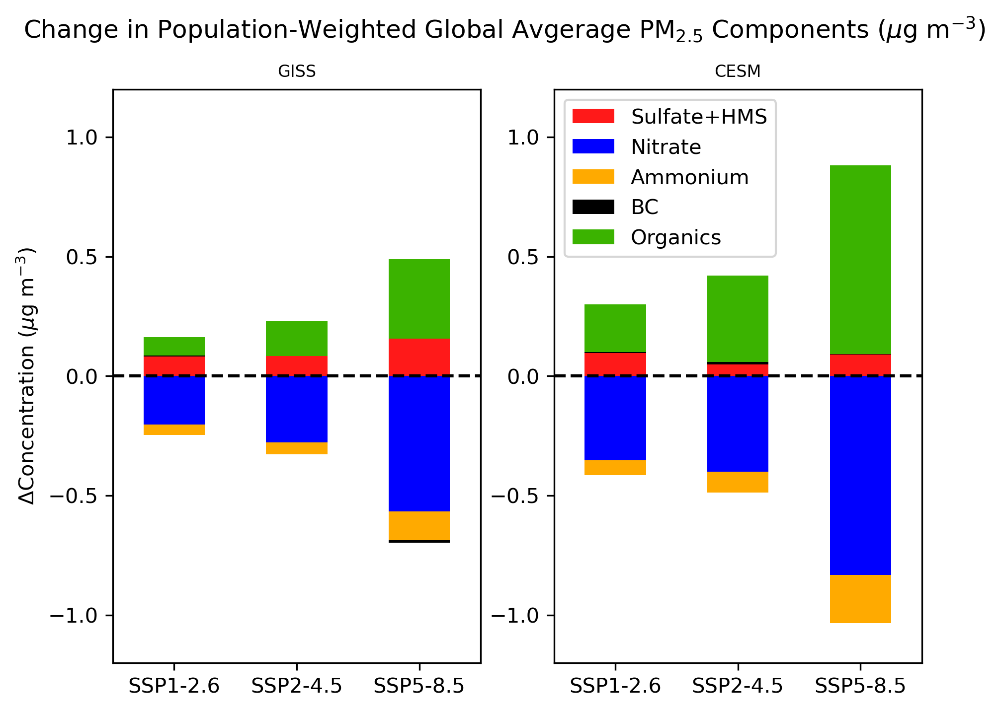

In [19]:
# now make bar chart

fig = plt.figure(dpi=300,figsize=(7,5))
ax1 = fig.add_subplot(1,2,1)
df.plot(x='scenario', kind='bar', stacked=True,
       color = ["#FF1919","#0000FF","#FFAA00","#000000","#3BB300"],
       ax = ax1)
plt.axhline(y=0, color='black', linestyle = '--')
plt.ylim(-1.2, 1.2)
plt.ylabel('$\\Delta$Concentration ($\\mu$g m$^{-3}$)')
plt.xlabel('')
ax1.set_xticklabels(df.loc[:,'scenario'],rotation=0)
ax1.get_legend().remove()
ax1.set_title('GISS',fontsize=8)

ax2 = fig.add_subplot(1,2,2)
df2.plot(x='scenario', kind='bar', stacked=True,
       color = ["#FF1919","#0000FF","#FFAA00","#000000","#3BB300"],
       ax = ax2)
plt.axhline(y=0, color='black', linestyle = '--')
plt.ylim(-1.2, 1.2)
#plt.ylabel('$\\Delta$Concentration ($\\mu$g m$^{-3}$)')
plt.xlabel('')
ax2.set_xticklabels(df.loc[:,'scenario'],rotation=0)
ax2.set_title('CESM',fontsize=8)
plt.suptitle('Change in Population-Weighted Global Avgerage PM$_{2.5}$ Components ($\\mu$g m$^{-3}$)')

plt.savefig('FigureS10_pm_pw_species_bars.png', bbox_inches='tight')
plt.show()

In [ ]:
# END :)